# Tarea Minería de Datos

# Ejercicio 1

Con el conjunto de datos **“FEV_data.csv”**, información en fev.doc (live.com), que se 
encuentra en la carpeta de datos de la documentación, y sabiendo que la variable 
objetivo es ‘fev’, se pide:


Ahora se cree ampliamente que fumar tiende a afectar la función pulmonar. Gran parte de los datos que respaldan esta afirmación surgen de estudios de la función pulmonar en adultos que han fumado durante mucho tiempo. Entonces surge la pregunta de si tales efectos nocivos del tabaquismo pueden detectarse en los niños que fuman. Para abordar esta pregunta, se realizaron mediciones de la función pulmonar en **654 niños** atendidos para un control de rutina en una clínica pediátrica particular. A los niños que participaron en este estudio se les preguntó si eran fumadores actuales.

Una medida común de la función pulmonar es el **volumen espiratorio forzado (FEV)**, que mide la cantidad de aire que puede expulsar de los pulmones en un corto período de tiempo. Un VEF más elevado suele asociarse a una mejor función respiratoria. Es bien sabido que el tabaquismo prolongado disminuye el FEV en adultos, y aquellos adultos con FEV disminuido también tienden a tener una función pulmonar disminuida medida por otras variables clínicas, como los niveles de oxígeno en sangre y dióxido de carbono.



El conjunto de datos fev.txt (ubicado en las páginas web de la clase) contiene los datos de los 654 niños en formato de campo libre. Los datos disponibles incluyen la medición de la edad, la altura, el sexo, el VEF y si cada niño fuma o no. Cada fila corresponde a una sola visita a la clínica. Los datos que faltan se denotan por NA. La primera línea del archivo contiene los nombres de las variables. El formato de los datos es:

* **seqnbr:** Número de casos (Los números del 1 al 654)

* **subjid:** Número de identificación del sujeto (Unico para cada diferente niño)

* **age:** Edad del sujeto en el momento de la medición (años)

* **fev:** Medida del FEV (Litros por segundo)

* **height:** Altura del sujeto en el momento de la medición (pulgadas)

* **sex:** Sexo del sujeto (1 = hombre, 2 = mujer)

* **smoke:** Hábitos de fumar (1 = sí, 2 = no)

## 1- Reporte descriptivo de los datos. Dimensiones del dataset, número de variables continuas y categóricas. Distribuciones. Comentarios generales. 

In [1]:
# Tratamiento de datos
# ==============================================================================
import pandas as pd
import numpy as np
 
# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

# Preprocesado y modelado
# ==============================================================================
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

### descriptivo de los datos. 
Primeramente realizaremos un reporte en el que se describiran los datos usando el .head(): 

In [2]:
import pandas as pd
import numpy as np
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Lectura de datos
df = pd.read_csv(r"C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Datos\FEV_data.csv")
df.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,2,2
1,2,451,8,1.724,67.5,2,2
2,3,501,7,1.720,54.5,2,2
3,4,642,9,1.558,53.0,1,2
4,5,901,9,1.895,57.0,1,2


Se observa a primera vista que las siguientes variables a estudiar se dividen en esto:

* **Seqnbr:** Se enumeran los datos de inicio hasta el final. 

* **subjid:** En esta variable vemos un identificador.

* **age:** Años de cada niño.

* **fev:** Medida del FEV (Litros por segundo), se sospecha que esta medida esta en Float.

* **height:** Altura del sujeto en el momento de la medición (pulgadas), se sospecha que esta medida está en Float.

* **sex:** Sexo del sujeto (1 = hombre, 2 = mujer)

* **smoke:** Hábitos de fumar (1 = sí, 2 = no)


### Dimensiones del dataset. 
Con la función **info()**, podemos obtener un summary de los tipos de variables almacenados en el dataset como python lo ha entendido en la lectura. 

In [3]:
# Información del dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   fev     654 non-null    float64
 4   height  654 non-null    float64
 5   sex     654 non-null    int64  
 6   smoke   654 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 35.9 KB


En el dataset hay 654 datos en los cuales tenemos un total de 7 columnas, sin valores null, los valores de seqnbr, subjid, fev y height tienen asignados tipos correctos, pero por otro lado sex y smoke se les deberían  asignar otro tipo de forma de string. Las dos variables anteriormente mencionadas deberían cambiarse el 2 y 1 a variables que tengan una representación de string para una mejor visualización de estas variables.

Con nunique podemos obtener el número de valores distintos por cada variable para evaluar cuáles deberían ser factores.

In [4]:
# Número de valores distintos por variable
df.nunique()

seqnbr    654
subjid    654
age        17
fev       575
height     56
sex         2
smoke       2
dtype: int64

De cara al análisis se debe saber si los valores distintos por variables tiene coherencia con lo esperado según la tendencia explicada con anteriores consultas **"head() e info()"** debemos conocer si estos valores están distribuidos de una correcta manera y no si tienen un valor más ya que esto puede ser un error en la forma de ingresar un dato:

* **seqnbr    654:** 
Esta variable tiene un valor correcto ya que se había hablado en su inicio de se trabaja con un dataset con 654 datos.
* **subjid    654:**
Esta variable tiene un valor correcto debido a que se puede observar que por identificador no hay ninguno repetido ya que podría haber un valor de identificador repetido por lo tanto tendríamos un valor menor a 654 que es lo esperado.
* **age        17:**
Esta variable se podría estudiar mejor ya que llama la atención de que hay 17 valores de edad en un análisis de niños que fuman por lo tanto se debería identificar un rango en el cual sea el menor valor. no obstante, se evalúa esta variable desde el menor valor (El menor valor se verá más adelante con otro tipo de consulta) hasta el mayor valor para ver los cambios y la influencia que esta tiene con respecto a que fume o no un niño y a el valor del volumen espiratorio forzado (fev). Pero entre más grande sea una persona más probabilidad tendrá de fumar no obstante esto se debe tener en cuenta al momento de plantear el modelo y de saber la correlación que existe entre fev.
* **fev       575:**
Esta variable tiene valores correctos o esperados ya que se espera una distribución variable.
* **height     56:**
Esta variable tiene valores correctos o esperados ya que se espera una distribución variable. ya que la altura va ligada a una edad.
* **sex         2:**
Esta variable tiene calores correctos, para este caso 2 ya que solo puede tomar dos valores 1= que sea hombre y 2= que sea mujer.
* **smoke       2:**
En esta variable se toman las mismas condiciones que en la anterior ya que se espera que sean solo dos valores 1= para los fumadores y 2= para los no fumadores. De esta variable se espera una correlación fuerte con respecto a nuestra variable objetivo.

In [5]:
df.describe()

,seqnbr,subjid,age,fev,height,sex,smoke
count,654.00000,654.000000,654.000000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,2.636780,61.143578,1.486239,1.900612
std,188.93782,23690.860350,2.953935,0.867059,5.703513,0.500193,0.299412
min,1.00000,201.000000,3.000000,0.791000,46.000000,1.000000,1.000000
25%,164.25000,15811.000000,8.000000,1.981000,57.000000,1.000000,2.000000
50%,327.50000,36071.000000,10.000000,2.547500,61.500000,1.000000,2.000000
75%,490.75000,53638.500000,12.000000,3.118500,65.500000,2.000000,2.000000
max,654.00000,90001.000000,19.000000,5.793000,74.000000,2.000000,2.000000


Si se observa los resultados dados por **describe()** no se obtienen valores fuera de lo esperado, ningún valor negativo, pero se mirara la distribución que haya en los datos. para tener una idea de cómo se comporta cada variable. 

### número de variables continuas y categóricas. 

Primeramente, tratamos los datos de las variables sex y smoke para que no tengan variables de 2 y 1 ya que queremos tener los datos identificados en los gráficos que haremos posteriormente más organizados.
Por lo tanto, realizaremos los siguientes cambios:

In [6]:
df.sex = df.sex.replace({1:"male", 2: "female"})
df.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,female,2
1,2,451,8,1.724,67.5,female,2
2,3,501,7,1.720,54.5,female,2
3,4,642,9,1.558,53.0,male,2
4,5,901,9,1.895,57.0,male,2


In [7]:
df.smoke = df.smoke.replace({1:"yes", 2: "no"})
df.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,female,no
1,2,451,8,1.724,67.5,female,no
2,3,501,7,1.720,54.5,female,no
3,4,642,9,1.558,53.0,male,no
4,5,901,9,1.895,57.0,male,no


### Conversión a factor de toda variable con menos de 10 valores distintos

Utilizamos el **.loc** para filtrar por condición sobre valores únicos de variables y creamos la lista de columnas que deberían pasar a factor. Posteriormente, se utiliza **astype** para pasar a categórica.

In [8]:
# Lista de columnas con menos de 10 valores distintos. Potenciales factores!
to_factor = list(df.loc[:,df.nunique() <= 10]);  

# Podemos cambiar el tipo de todas ellas a factor de una vez
df[to_factor] = df[to_factor].astype('category')


Para verificar que se ha realizado el cambio en las variables a objetivo se utiliza el **info()**

In [9]:
# Número de valores distintos por variable
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   fev     654 non-null    float64 
 4   height  654 non-null    float64 
 5   sex     654 non-null    category
 6   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(3)
memory usage: 27.2 KB


Se utiliza el describe para analizar las variables continuas por un lado:

In [10]:
df.describe()

,seqnbr,subjid,age,fev,height
count,654.00000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,2.636780,61.143578
std,188.93782,23690.860350,2.953935,0.867059,5.703513
min,1.00000,201.000000,3.000000,0.791000,46.000000
25%,164.25000,15811.000000,8.000000,1.981000,57.000000
50%,327.50000,36071.000000,10.000000,2.547500,61.500000
75%,490.75000,53638.500000,12.000000,3.118500,65.500000
max,654.00000,90001.000000,19.000000,5.793000,74.000000


A simple vista se observa que los valores de edad para un valor mínimo es 3 y el valor máximo es 19, se debe saber bien el concepto de cual muestra se está estudiando ya que la edad de 19 años es más para un adolescente que para un niño. Pero de igual forma está bien tener este tramo de edad ya que sin estudiar el dato a fondo se puede esperar que entre más mayor una persona más probabilidad va a tener de ser un fumador.

Y por otro lado se excluye las variables continuas para ver las categoricas aisladas:

In [11]:
# Número de valores distintos por variable
df.describe(exclude=np.number)

,sex,smoke
count,654,654
unique,2,2
top,male,no
freq,336,589


Según el estudio de las Categóricas se observa que en la variable sexo hay un 51,4% de hombres siendo parcialmente igual al de las mujeres y un supuesto de 90% de la población no fuma.

### Distribuciones.

In [12]:
exec(open(r'C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\NuestrasFunciones.py').read())

Continuas


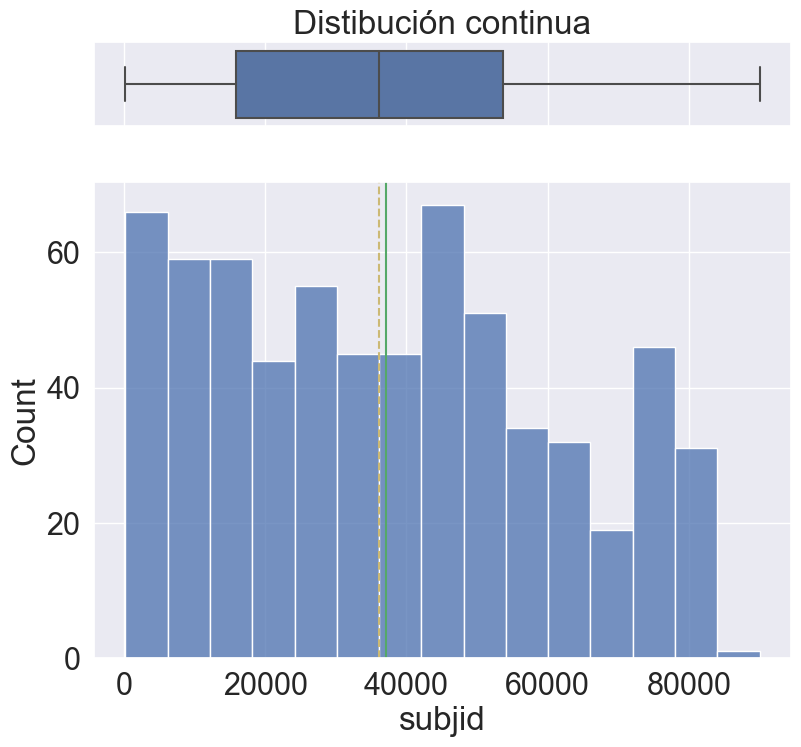

Continuas


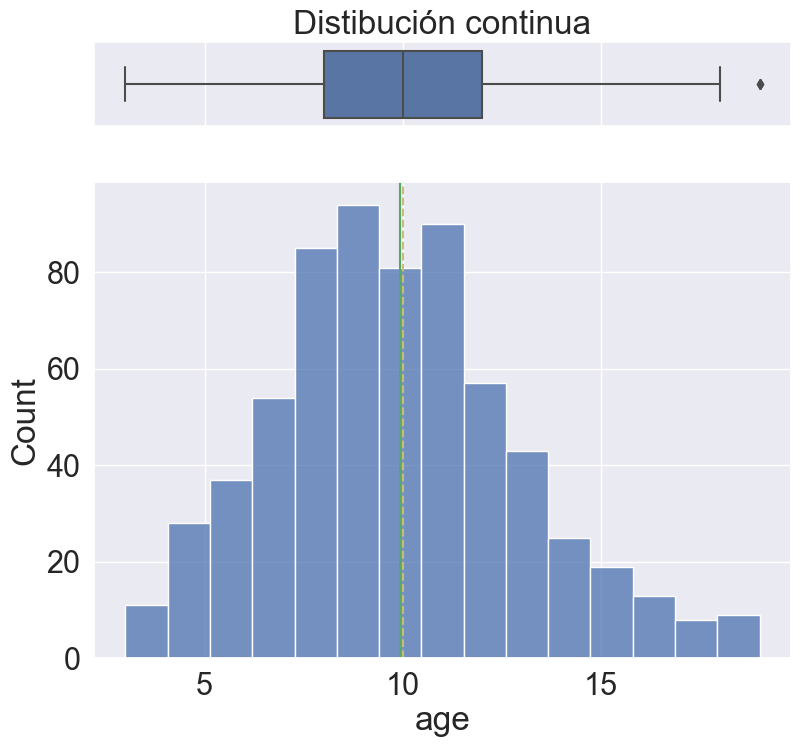

Continuas


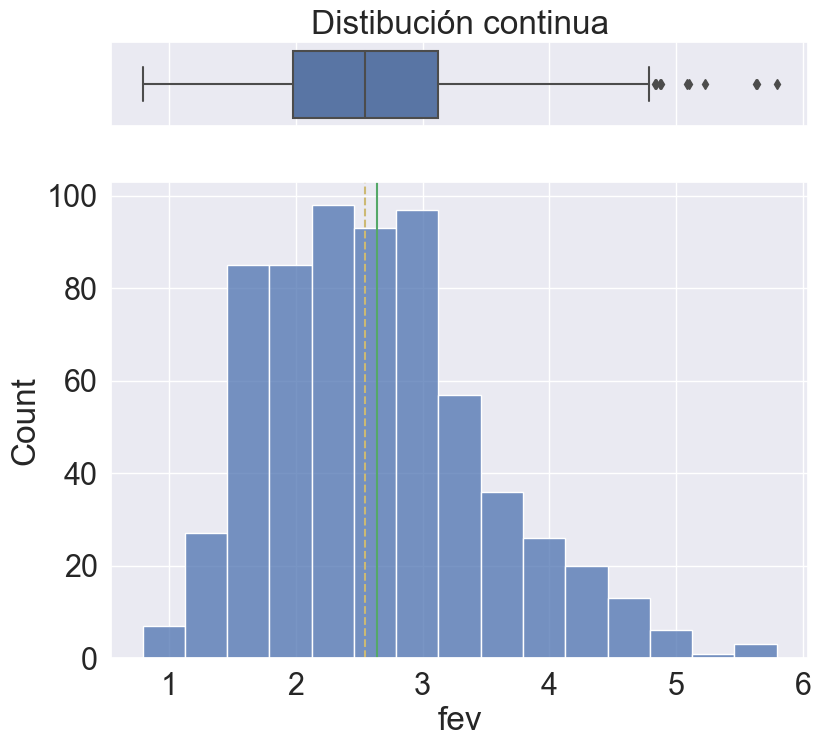

Continuas


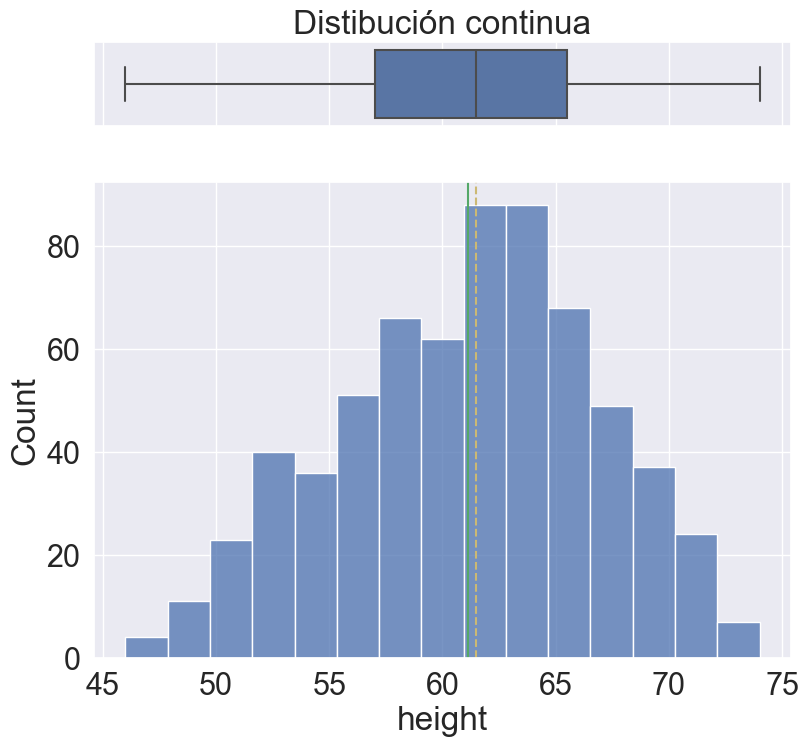

Categoricas


Categoricas


subjid    None
age       None
fev       None
height    None
sex       None
smoke     None
dtype: object

In [13]:
def plot(col):
     if col.dtypes != 'category':
        print('Continuas')
        histogram_boxplot(col, xlabel = col.name, title = 'Distibución continua')
     else:
        print('Categoricas')
        cat_plot(col).show()
        
# Aplicar a una serie de columas 1:9 del data
df.iloc[:,1:7].apply(plot)


Se tienen las siguientes observaciones:
### Variables Continuas
* **Age:** presenta una distribución mesocúrtica, además de haber valores atípicos según la distribución normal que se debe a las personas con un rango de edad de 19 años.
* **fev:** Se observa que la variable objetivo que es fev tiene una distribución hacia la izquierda teniendo una distribución leptocúrtica. (Más apuntada que la normal) con valores atípicos que muy posiblemente pueden ser valores muy altos de fev.
* **Height:** En la variable de altura se observa una distribución platicurtica sin datos atípicos.

### Variables Categorícas
* **sex:** Hay una distribución parcialmente igual en la variable sex, con una cantidad casi igual de hombres como de mujeres en el dataset.
* **smoke:** Se observa que la cantidad mayoritaria en la variable smoke es para los no fumadores, esto se cotejará cuando se haga relación con la variable objetivo.

### Chequeo para saber si tenemos outlier representativos en nuestro data

In [14]:
df.select_dtypes(include=np.number).apply(lambda x: x.skew())

seqnbr    0.000000
subjid    0.263379
age       0.413557
fev       0.662575
height   -0.213541
dtype: float64

In [15]:
# Llamada en modo check
df.select_dtypes(include=np.number).copy().apply(lambda x: gestiona_outliers(x))

seqnbr
subjid
age
fev
height


,seqnbr,subjid,age,fev,height
0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0


In [16]:
# Crear copia para evitar pisar información
dfCont = df.select_dtypes(include=np.number).copy()

# Aplicar la gestión de outliers en modelo winsor
df_winsor = dfCont.apply(lambda x: gestiona_outliers(x,clas='check'))

# Contemos si ha desaparecido algún resgitro o algo 
# vinos_winsor.apply(lambda x: x.isna().sum()/x.count()*100)

seqnbr
subjid
age
fev
height


In [17]:
# Aplicar la gestión de outliers en modelo winsor
df_winsor = dfCont.apply(lambda x: gestiona_outliers(x,clas='miss'))

# Contemos si ha desaparecido algún resgitro o algo 
# vinos_winsor.apply(lambda x: x.isna().sum()/x.count()*100)

seqnbr

 MissingAntes: 0
MissingDespues: 0

subjid

 MissingAntes: 0
MissingDespues: 0

age

 MissingAntes: 0
MissingDespues: 0

fev

 MissingAntes: 0
MissingDespues: 0

height

 MissingAntes: 0
MissingDespues: 0



No se observa un verdadero problema con respecto a los valores atípicos (Outliers) ya que según el tratamiento de outliers no se identificó valores verdaderamente extremos y que no sean típicos, lo cual necesariamente implica que no hay ninguno.

Es evidente que la búsqueda o gestión de outliers aplica únicamente a variables de tipo numérico por lo que podemos crear el subconjunto de estas variables, tratarlas y posteriormente volver a juntar con las categóricas sobre las que no aplica este análisis. 

## 2- Decide si se descarta de inicio alguna de las variables de cara al modelado.

Se decide descartar una la variable seqnbr de cara al modelo ya que una es el número asignado a cada dato en orden de menor a mayor, la variable subjid también se descarta ya que es el número identificador:

In [18]:
df_1 = df.drop(["seqnbr"], axis=1)
df_1.head()

,subjid,age,fev,height,sex,smoke
0,301,9,1.708,57.0,female,no
1,451,8,1.724,67.5,female,no
2,501,7,1.720,54.5,female,no
3,642,9,1.558,53.0,male,no
4,901,9,1.895,57.0,male,no


In [19]:
df_2 = df_1.drop(["subjid"], axis=1)
df_2.head()

,age,fev,height,sex,smoke
0,9,1.708,57.0,female,no
1,8,1.724,67.5,female,no
2,7,1.720,54.5,female,no
3,9,1.558,53.0,male,no
4,9,1.895,57.0,male,no


In [20]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Con el ProfileReport podemos ver todas las variables explicadas una a una o ver la correlación que tiene cada una, pero esto se explica específicamente en todo el punto 1.

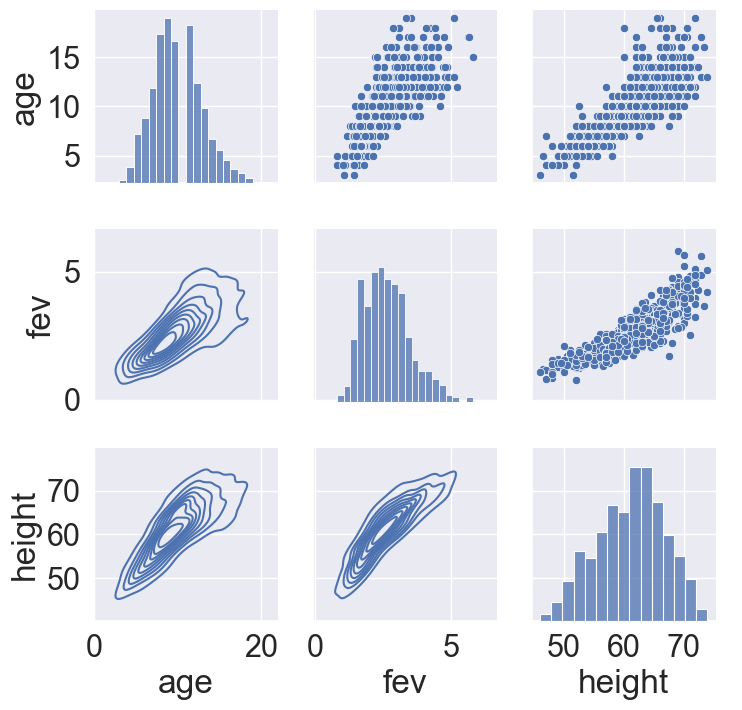

In [21]:
import seaborn as sns

g = sns.PairGrid(df_1.iloc[:,1:])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()
 
# del g


Según el gráfico anterior observamos la correlación entre las variables continuas y la variable objetivo:
* **fev vs height:** En el grafico podemos observar una distribución normal en la cual la relación entre las variables nos da un comportamiento lineal. Se observa que esta variable tendrá mucho peso en nuestra variable al tener un comportamiento lineal más que las otras, con esto se quiere decir que si se trazara una línea se tomarían más valores que en las otras variables.
* **fev vs age:** Al comparar estas dos variables se observa una correlación aunque menos fuerte que la anterior, ya que los datos así sigan una linealidad no están tan concentrados como en la relación entre fev y altura.
* **height vs age:** La relación entre estas dos también nos genera una correlación lineal.
Todas las variables continuas tienen una relación lineal además de tener buena relación. por lo tanto, no se descarta ninguna de ellas.

### Relación grafica entre las variables catergoricas y la variable objetivo

<AxesSubplot: xlabel='sex', ylabel='fev'>

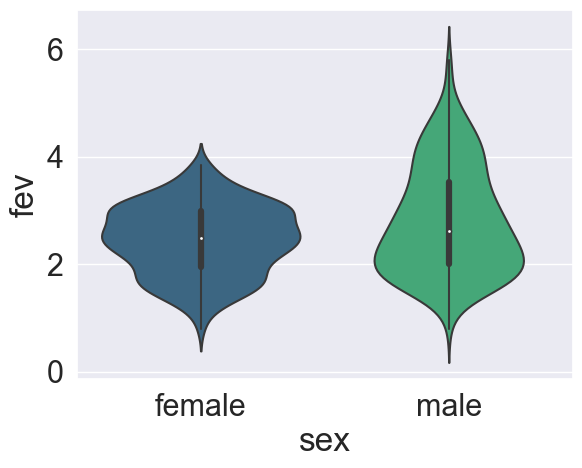

In [22]:
sns.violinplot(x='sex', y="fev", data=df_2, palette='viridis')

### sex

En base a los gráficos de violín se puede inferir lo siguiente:
* Para el que se relaciona con las mujeres y el volumen aspiratorio forzado vemos que los datos no solo se centran en la media, sino que también se centran al rededor del primer cuartil y el tercer cuartil, sin tener colas muy alargadas, su rango intercuartílico no es tan amplio y se observa una distribución mesocúrtica un poco deformada.
* Para el que relaciona los hombres y el volumen aspiratorio forzado vemos que los datos tienen una distribución unimodal con desviación a la izquierda el coeficiente toma un valor negativo esto quiere decir que la distribución es asimétrica negativa o a la derecha. Los datos se centran en el primer cuartil y por el contrario de la relación de las mujeres este tiene colas muy alargadas, pero un rango intercuartílico más amplio frente a esto podríamos inferir que los hombres tienen una capacidad de volumen aspiratorio forzado mayor que las mujeres.


<AxesSubplot: xlabel='smoke', ylabel='fev'>

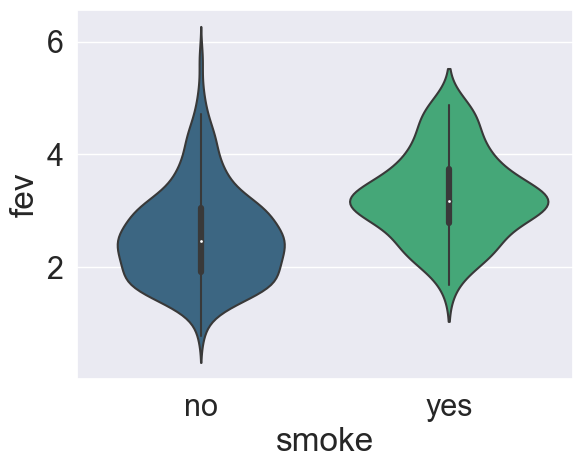

In [23]:
sns.violinplot(x='smoke', y="fev", data=df_2, palette='viridis')

### Smoke
* Si se observa el grafico de violín para los jóvenes que fuman con respecto al valor espiratorio forzado, se obtiene una distribución mesocúrtica con valores más centrados en la media, esto puede deberse a que el conjunto de datos que tenemos. ya que en los menores que fuman tenemos un 9.94% de datos en base al total, del grafico de los jóvenes que no fuman podemos decir que tiene una forma platicurtica con valores distribuidos de manera normal con largas colas. en general se observa un volumen espiratorio forzado mayor para los jóvenes que no fuman que para los que fuman siguiendo una tendencia o correlación acertada.  

## 3-Modelo lineal con las variables originales (sin ninguna modificación) y sin interacción entre las variables.

### 3.1- Ajustes de correlación y lo que se espera antes de aplicar nuestro modelo

Se para la variable **objetivo** de **todas las variables** para facilitar el manejo cuando realicemos la relación midiendo en la V de Cramer y también cuando realicemos nuestras predicciones.

In [24]:
df_2.head()

,age,fev,height,sex,smoke
0,9,1.708,57.0,female,no
1,8,1.724,67.5,female,no
2,7,1.720,54.5,female,no
3,9,1.558,53.0,male,no
4,9,1.895,57.0,male,no


In [25]:
#En esta variable separamos la variable objetivo
varObjCont = df_2.fev
varObjCont.info()

<class 'pandas.core.series.Series'>
RangeIndex: 654 entries, 0 to 653
Series name: fev
Non-Null Count  Dtype  
--------------  -----  
654 non-null    float64
dtypes: float64(1)
memory usage: 5.2 KB


In [26]:
# Eliminar variable objetivo continua 
imput = df_2.drop(["fev"],axis=1)
imput.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   age     654 non-null    int64   
 1   height  654 non-null    float64 
 2   sex     654 non-null    category
 3   smoke   654 non-null    category
dtypes: category(2), float64(1), int64(1)
memory usage: 11.9 KB


Hay una relación entre todas las variables del input frente a la variable objetivo (ya sea continua o binaria), (es importante destacar que estas relaciones solamente cuentan el efecto marginal de una variable con la objetivo sin considerar las posibles interacciones existentes entre variables que pueden modificar en modelo estas asociaciones).

In [27]:
#se estudia la correlación que hay con cada varaible y la variable objetivo para saber cual esta más relacionada según
#la V de cramer
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x,varObjCont)),columns=['VCramer'])
tablaCramer

,VCramer
age,0.437329
height,0.539096
sex,0.315734
smoke,0.257104


In [28]:
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente al FEV').update_yaxes(categoryorder="total ascending")

Tenemos alta correlación con las variables, como se había observado en nuestro scatterplot height tienen mayor correlación con FEV que con las otras variables, ya que su grafico presenta una relación más lineal.

Frente a esta premisa comenzaremos a formar nuestro modelo lineal con las variables originales (sin ninguna modificación) y sin interacción entre las variables.

### 3.2- Ajuste del modelo (partición)

Se ajusta un modelo empleando como variable respuesta **Todas las variables continuas y categoricas que no sean la objetivo** y como predictor **fev (objetivo)**. Como en todo estudio predictivo, no solo es importante ajustar el modelo, sino también cuantificar su capacidad para predecir nuevas observaciones. Para poder hacer esta evaluación, se dividen los datos en dos grupos, uno de entrenamiento y otro de test.

In [29]:
imput.dtypes

age          int64
height     float64
sex       category
smoke     category
dtype: object

In [30]:
# Función necesaria
from sklearn.model_selection import train_test_split

# Creamos 4 objetos: predictores para tr y tst y variable objetivo para tr y tst. 
X_train, X_test, y_train, y_test = train_test_split(imput, varObjCont, test_size=0.2, random_state=42)

# Comprobamos dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (523, 4) (523,)
Testing dataset shape: (131, 4) (131,)


In [31]:
#unimos el predictor de la variable objetivo con la variable objetivo en el training 
data_train = X_train.join(y_train)
data_train.head()
#aquí se realiza el data train

,age,height,sex,smoke,fev
321,12,71.0,male,no,4.550
456,12,68.0,male,no,4.411
340,10,62.0,male,no,1.937
29,9,60.0,female,no,2.100
570,10,65.0,male,no,3.090


### 3.3- Scikit-learn 

Una vez teniendo la partición obtenemos un data_train la cual vamos a entrenar para tener nuestro modelo más optimo, vamos a importar la api para fórmulas, esta nos genera una linea de regresión ajustada.

#### 3.3.1- Modelo con todas las variables

In [32]:
# Aplicamos a fórmula de modelo completo
form=ols_formula(data_train,'fev')
form

'fev ~ age + height + sex + smoke'

In [33]:
form ='fev ~ age + height + sex + smoke'

In [34]:
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajusto regresión de ejemplo
modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     423.4
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          1.09e-161
Time:                        23:00:18   Log-Likelihood:                -281.13
No. Observations:                 523   AIC:                             572.3
Df Residuals:                     518   BIC:                             593.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -4.4435      0.252    -17.627      0.000      -4.939      -3.948
sex[T.male]      0.1511      0.038      4.028      0.000       0.077       0.225
smoke[T.yes]    -0.0652      0.066     -0.983      0.326      -0.196       0.065
age              0.0632      0.011      5.678      0.000       0.041       0.085
height           0.1041      0.005     19.150      0.000       0.093       0.115
==============================================================================
Omnibus:                       11.617   Durbin-Watson:                   2.092
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.038
Skew:                           0.178   Prob(JB):                     0.000200
Kurtosis:                       3.810   Cond. No.                         863.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Del resumen anterior podemos inferir que:
* en base a esta fórmula se va a generar matriz explicita de esta **'fev ~ age + height + sex + smoke'**, la variable **FEV** puede explicar un **76,7%** con este modelo, además tiene un estadístico grande y un p-valor muy pequeño lo que explica que nuestro modelo es significativamente mejor que el no modelo, ósea que el modelo nuestro con todos los efectos es mejor que el modelo con solo una constante.
* valor de la constante con su error de estimación **coef** y el valor que toman las variables que toman estos valores con respecto al corte, **P>|t|** está bien para todas las variables excepto para **smoke[T.yes]** que nos da un valor de **0.326** cuando debe tener uno inferior al **0.05** esto se debe a que el estimador de los límites de confianza pasa por el 0.


#### 3.3.2- Modelo lineal eliminando smoke del modelo

Ya que para el modelo anterior explicamos a "fondo" el summary de nuestra grafica lo que realizaremos ahora será ir un poco más al grano con el resumen de cada modelo:

In [35]:
form1 ='fev ~ age + height + sex'

In [36]:
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajusto regresión de ejemplo
modeloC1 = ols(form1,data=data_train).fit()
modeloC1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     564.2
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          6.86e-163
Time:                        23:00:22   Log-Likelihood:                -281.61
No. Observations:                 523   AIC:                             571.2
Df Residuals:                     519   BIC:                             588.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -4.4369      0.252    -17.608      0.000      -4.932      -3.942
sex[T.male]     0.1540      0.037      4.117      0.000       0.081       0.227
age             0.0601      0.011      5.629      0.000       0.039       0.081
height          0.1043      0.005     19.223      0.000       0.094       0.115
==============================================================================
Omnibus:                       11.573   Durbin-Watson:                   2.100
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.840
Skew:                           0.155   Prob(JB):                     0.000134
Kurtosis:                       3.850   Cond. No.                         863.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

En este modelo eliminamos la variable **smoke** para probar si esta variable tiene efecto en nuestro modelo, ya que por su P-valor podemos tender a despreciarla. 
Al quitarla esta variable vemos que el coeficiente de determinación no tiene un cambio significativo, cambiando un **0,1%**, **R-squared:	0.765** por lo tanto este modelo será el tentativo.   

#### 3.3.3- Modelo lineal eliminando sex del modelo

In [37]:
form2 ='fev ~ age + height + smoke'

In [38]:
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajusto regresión de ejemplo
modeloC2 = ols(form2 ,data=data_train).fit()
modeloC2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     543.1
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          1.26e-159
Time:                        23:00:28   Log-Likelihood:                -289.19
No. Observations:                 523   AIC:                             586.4
Df Residuals:                     519   BIC:                             603.4
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -4.6008      0.253    -18.209      0.000      -5.097      -4.104
smoke[T.yes]    -0.0860      0.067     -1.281      0.201      -0.218       0.046
age              0.0565      0.011      5.062      0.000       0.035       0.078
height           0.1090      0.005     20.293      0.000       0.098       0.120
==============================================================================
Omnibus:                       18.413   Durbin-Watson:                   2.101
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.790
Skew:                           0.259   Prob(JB):                     3.40e-07
Kurtosis:                       4.048   Cond. No.                         853.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

En este modelo eliminamos la variable **sex** para probar si esta variable tiene efecto en nuestro modelo. 
Al quitarla esta variable vemos que el coeficiente de determinación no tiene un cambio significativo, pero se disminuye un poco el coeficiente de determinación, cambiando un **0,7%**, **R-squared: 0.758** por lo tanto este modelo no será el tentativo. 


### 3.4 Filosofía matriz de diseño explícita

Esta es otra forma de *generar* nuestro modelo, en el cual se crea una matriz explicita y, X **(dmatrices)**, ya que nuestra formula OLS evalua los **y** por un lado y los **X** por otro, por esta razón la X tiene que se explicita **(las variables categoricas estan extendidas en Dummies)** osea sin ningun valor de tipo categorico.

In [39]:
import statsmodels.api as sm
import patsy
form3 ='fev ~  height + sex + smoke'
# Generamos las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form3, data_train, return_type='dataframe')

# Ahora podemos aplicar la función "oficial" de statmodels OLS (con formato y,X)
modeloC3=sm.OLS(y,X).fit()
modeloC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     522.3
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          2.67e-156
Time:                        23:00:31   Log-Likelihood:                -296.91
No. Observations:                 523   AIC:                             601.8
Df Residuals:                     519   BIC:                             618.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -5.2863      0.210    -25.199      0.000      -5.698      -4.874
sex[T.male]      0.1195      0.038      3.127      0.002       0.044       0.195
smoke[T.yes]     0.0408      0.066      0.622      0.534      -0.088       0.170
height           0.1282      0.003     36.779      0.000       0.121       0.135
==============================================================================
Omnibus:                       16.177   Durbin-Watson:                   2.107
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.946
Skew:                           0.163   Prob(JB):                     3.14e-07
Kurtosis:                       4.126   Cond. No.                         690.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* La evaluamos con una formula en la cual no despreciamos la variable age aunque sabemos que tiene un peso en nuestro modelo como lo habíamos visto en nuestro grafico de relaciones frente a la variable Objetivo FEV. 
* Vemos lo que esperamos, el coeficiente de determinación presenta una disminución si se compara con los modelos anteriormente, además los P-valor aumentan.


### Importancia de las variables en el modelo completo

In [40]:
from relativeImp import relativeImp

y, X = patsy.dmatrices(form, data_train, return_type='dataframe')
# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calculamos importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'fev', driverNames = names)

# Ordenamos valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
3,height,0.443669,57.937958
2,age,0.277787,36.275651
0,sex[T.male],0.024235,3.164859
1,smoke[T.yes],0.020075,2.621533


**rawRelaImpt**
* El análisis de impulsores clave es una herramienta popular y poderosa ya que evalúa importancia relativa de los impulsores individuales en la predicción de una variable de resultado.

* Dado que los impulsores suelen estar altamente correlacionados entre sí, el análisis de regresión múltiple típico produciría indicadores defectuosos de la importancia del impulsor. En su lugar, adoptamos el enfoque de análisis de peso relativo que divide con precisión la varianza entre los impulsores correlacionados.



In [41]:
#Gráfico de importancia relativa en base al R2
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al R2').update_yaxes(categoryorder="total ascending").show()

## 4- Ajusta el mejor modelo de regresión lineal con variables originales y con interacciones entre las variables que resulten relevantes. 

### Interacción de la forma  'fev ~ age + height*sex'

In [42]:
form4 ='fev ~ age + height*sex'

In [43]:
modeloC4 = ols(form4 ,data=data_train).fit()
modeloC4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.773
Method:                 Least Squares   F-statistic:                     446.5
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          2.74e-166
Time:                        23:00:50   Log-Likelihood:                -270.42
No. Observations:                 523   AIC:                             550.8
Df Residuals:                     518   BIC:                             572.1
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -3.0651      0.379     -8.078      0.000      -3.811      -2.320
sex[T.male]           -1.8025      0.413     -4.368      0.000      -2.613      -0.992
age                    0.0662      0.011      6.276      0.000       0.045       0.087
height                 0.0806      0.007     11.057      0.000       0.066       0.095
height:sex[T.male]     0.0322      0.007      4.760      0.000       0.019       0.045
==============================================================================
Omnibus:                        6.036   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.049   Jarque-Bera (JB):                7.799
Skew:                           0.090   Prob(JB):                       0.0203
Kurtosis:                       3.570   Cond. No.                     2.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

En base a los modelos obtenidos en regresión lineal con variables originales y sin variables vemos que **el mejor modelo** generado fue en el que **eliminamos la variable smoke** de nuestro modelo teniendo un valor de R-square de **0.765** siendo el más alto, por lo tanto seguiremos con esta formular y solo haremos la interaccionar la variable **sexo** con otras variables ya que su importancia relativa con respecto al R2 era baja como la de smoke.

podríamos predecir que la altura puede tener algún tipo de relación con respecto a la variable sexo, por lo tanto lo que **hacemos es interaccionar la variable altura con la variable sex** y obtenemos que el **coeficiente de determinación aumenta**, teniendo una mejoría en nuestro modelo. Ya que **alcanzamos un R-squared de 0,775 además no se presenta un aumento en el p-valor**.


En base a lo anterior haremos interaccionar tanto la variable sexo con otras variables importantes en nuestro modelo como la variable smoke, ya que probando podriamos obtener un coeficiente mayor.

### Interacción de la forma  'fev ~ age*sex + height'

In [44]:
form5 ='fev ~ age*sex + height'

In [45]:
modeloC5 = ols(form5 ,data=data_train).fit()
modeloC5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     440.1
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          4.80e-165
Time:                        23:00:56   Log-Likelihood:                -273.31
No. Observations:                 523   AIC:                             556.6
Df Residuals:                     518   BIC:                             577.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -3.8968      0.281    -13.856      0.000      -4.449      -3.344
sex[T.male]        -0.3665      0.133     -2.765      0.006      -0.627      -0.106
age                 0.0417      0.011      3.642      0.000       0.019       0.064
age:sex[T.male]     0.0533      0.013      4.088      0.000       0.028       0.079
height              0.0984      0.006     17.761      0.000       0.088       0.109
==============================================================================
Omnibus:                        7.388   Durbin-Watson:                   2.085
Prob(Omnibus):                  0.025   Jarque-Bera (JB):               10.696
Skew:                           0.066   Prob(JB):                      0.00476
Kurtosis:                       3.688   Cond. No.                     1.00e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  1e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

El R-squared no mejora además lo que logramos es tener un impacto negativo en nuestro p-valor.

El R-squared no mejora además lo que logramos es tener un impacto negativo en nuestro p-valor, se observa que la variable smoke definitivamente no aporta una mejora a nuestro modelo de lo contrario lo empeora.

### Evaluación en el conjunto de test

In [46]:
tr_tst_eval_lin(form,df)

Coeficiente de determinaciÃ³n TRAINING:  0.765765937533381 

Mean squared error TEST: 0.40
Coeficiente de determinaciÃ³n TEST: 0.81


In [47]:
tr_tst_eval_lin(form1,df)

Coeficiente de determinaciÃ³n TRAINING:  0.7653291017165244 

Mean squared error TEST: 0.40
Coeficiente de determinaciÃ³n TEST: 0.80


In [48]:
tr_tst_eval_lin(form4,df)

Coeficiente de determinaciÃ³n TRAINING:  0.7751652919568588 

Mean squared error TEST: 0.39
Coeficiente de determinaciÃ³n TEST: 0.81


In [49]:
tr_tst_eval_lin(form5,df)

Coeficiente de determinaciÃ³n TRAINING:  0.7726620282412249 

Mean squared error TEST: 0.38
Coeficiente de determinaciÃ³n TEST: 0.82


Al evaluar cada conjunto de test se observa que así se obtenga un coeficiente de determinación más bajo en la **form5** obtenemos en el test una **mejor sensibilidad** con respecto a los otros modelos por lo tanto, será nuestro modelo tentativo junto con la **form4** que se comporta parcialmente igual.

## 5- Comparación de ambos modelos por validación cruzada repetida. ¿Cuál de ellos tiene mejor comportamiento en generalización?

In [50]:
form = 'fev ~ age + height + sex + smoke'
form1 = 'fev ~ age + height + sex'
form2 ='fev ~ age + height + smoke'
form3 ='fev ~  height + sex + smoke'
form4 ='fev ~ age + height*sex'
form5 ='fev ~ age*sex + height'
# Creamos lista de fórmulas   
list_form = [form,form1,form2,form3,form4, form5]
list_form

# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,df_2, seed=42),list_form))
print(list_res)
#semilla de la particion es diferente jgs
# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()
# pivot de long a wide

Modelo: fev ~ age + height + sex + smoke
Coeficiente de determinaciÃ³n R2: 0.769 (0.030)
Modelo: fev ~ age + height + sex
Coeficiente de determinaciÃ³n R2: 0.770 (0.030)
Modelo: fev ~ age + height + smoke
Coeficiente de determinaciÃ³n R2: 0.762 (0.032)
Modelo: fev ~  height + sex + smoke
Coeficiente de determinaciÃ³n R2: 0.753 (0.032)
Modelo: fev ~ age + height*sex
Coeficiente de determinaciÃ³n R2: 0.779 (0.029)
Modelo: fev ~ age*sex + height
Coeficiente de determinaciÃ³n R2: 0.778 (0.030)
         0         1         2         3         4         5         6   \
0  0.805612  0.810751  0.766404  0.746866  0.714957  0.701608  0.737074   
1  0.803962  0.813179  0.765685  0.745412  0.713336  0.700442  0.743043   
2  0.795886  0.801874  0.756997  0.737793  0.713461  0.688653  0.726562   
3  0.781887  0.790559  0.754978  0.754143  0.681027  0.702025  0.746268   
4  0.814646  0.818141  0.775097  0.754626  0.731322  0.725976  0.752181   
5  0.820703  0.821194  0.775314  0.747580  0.723223  0.

,Modelo,R2
0,0,0.805612
1,0,0.810751
2,0,0.766404
3,0,0.746866
4,0,0.714957


El funcionamiento en las 100 particiones distintas vemos que obtenemos una mejor respuesta con respecto la form4 ya que en media tenemos un 0.779 y en varianza 0.029 (al tener una varianza más baja y una media "sesgo" más alta elegimos este modelo además es nuestro modelo más simple).

<AxesSubplot: xlabel='Modelo', ylabel='R2'>

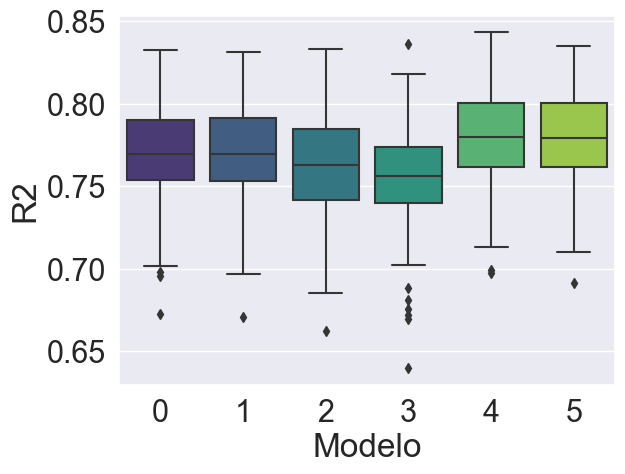

In [51]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')

Se observa que en la validación cruzada vemos que los mejores modelos son el **form4 ='fev ~ age + height*sex'** y el **form5 ='fev ~ age*sex + height'**:

Si se compara el blox-plot de los dos modelos vemos que en el modelo 4 tenemos dos outliers pero nuestro rango es un poco más alto que el rango del modelo5 pero en este solo tenemos la presencia de 1 outlier, frente a esto la decisión es tomar el modelo5 debido a que si se prueban los modelos en validación cruzada repetida y obtenemos valores de error cuadrático medio de 0,029 (menor error que los otros modelos) y coeficiente de determinación de 0,779 (mayor coeficiente de determinación que los otros modelos).

In [52]:
# Ajusto regresión
modelo_final = ols(form4,data=data_train).fit()
modelo_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.773
Method:                 Least Squares   F-statistic:                     446.5
Date:                Mon, 03 Apr 2023   Prob (F-statistic):          2.74e-166
Time:                        23:02:09   Log-Likelihood:                -270.42
No. Observations:                 523   AIC:                             550.8
Df Residuals:                     518   BIC:                             572.1
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -3.0651      0.379     -8.078      0.000      -3.811      -2.320
sex[T.male]           -1.8025      0.413     -4.368      0.000      -2.613      -0.992
age                    0.0662      0.011      6.276      0.000       0.045       0.087
height                 0.0806      0.007     11.057      0.000       0.066       0.095
height:sex[T.male]     0.0322      0.007      4.760      0.000       0.019       0.045
==============================================================================
Omnibus:                        6.036   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.049   Jarque-Bera (JB):                7.799
Skew:                           0.090   Prob(JB):                       0.0203
Kurtosis:                       3.570   Cond. No.                     2.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [53]:
modeloC4.params

Intercept            -3.065120
sex[T.male]          -1.802533
age                   0.066154
height                0.080595
height:sex[T.male]    0.032193
dtype: float64

In [54]:
modelo_final.params

Intercept            -3.065120
sex[T.male]          -1.802533
age                   0.066154
height                0.080595
height:sex[T.male]    0.032193
dtype: float64

Conclusiones que podemos sacar para el volumen aspiratorio forzado:

1) El volumen aspiratorio forzado estimado para las **mujeres** (niñas y jóvenes) será menor que el de los **hombres** (niños y jóvenes).

2) El aumento unitario de la **altura** produce un aumento del volumen aspiratorio forzado esperado de 0.080 unidades.

3) El aumento unitario de la **edad** produce un aumento del volumen aspiratorio forzado esperado de unas 0.066 unidades.

4) La relación entre la **altura y el género** producen un aumento unitario en el volumen aspiratorio forzado de 0.032 unidades. 

Todas estas afirmaciones se hacen a constancia de todas las demás variables involucradas en el modelo (ceteris paribus), es decir, se valora el cambio marginal que tiene cada variable para valores fijos de todas las demás.

Si se quisiera estudiar cómo afecta si una persona fuma o no al volumen aspiratorio forzado debería haber más datos de personas que fumen ya que nuestros datos de los niños o jóvenes fumadores fueron del 9,94%

# Ejercicio 2

Con los datos de la serie de “defunciones.xlsx” que se encuentra en la carpeta de datos de la documentación, se pretende ajustar el mejor modelo de series
temporales a cualquiera de las series allí contenidas (elige 1).

En este documento exploramos distintos modelos de suavizado y ARIMA para series univariantes.La idea será buscar los mejores modelos para la predicción de series temporales para los datos wisconsin-xlxs.

## 1- Lectura y representación de la serie. Descomposición. Conclusiones.

In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
plt.style.use("default")

In [3]:
from rpy2.robjects.packages import importr, data

In [4]:
# Lo leemos desde el csv que desde R en el propio R colapsa el espacio-tiempo jeje
defunciones = pd.read_excel(r"C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Datos\defunciones.xlsx")
defunciones.head()

,,Todas las causas,Tumores,Causas externas
0,1980M01,28681,4883,1277
1,1980M02,23906,4493,1122
2,1980M03,25275,4957,1244
3,1980M04,22500,4523,1214
4,1980M05,22781,4893,1228


Se observa una columna que no tiene nombre en la cual observamos una especie de fecha, entonces vamos a cambiarla para que python entienda que es una fecha:

In [5]:
defunciones['Month'] = defunciones.iloc[:,0].apply(lambda x: x.replace('M','-'))

Aquí lo que hacemos es generar otra columna la cual nos genere la misma columna de 1980M01 pero remplazando el M por -. 

Luego de esto eliminamos la primera columna que en este caso es la que contiene el formato tipo 1980M01:

In [6]:
defunciones = defunciones.iloc[:,1:]
defunciones.head()

,Todas las causas,Tumores,Causas externas,Month
0,28681,4883,1277,1980-01
1,23906,4493,1122,1980-02
2,25275,4957,1244,1980-03
3,22500,4523,1214,1980-04
4,22781,4893,1228,1980-05


In [7]:
defunciones.set_index(['Month'],inplace=True)
defunciones.index=pd.to_datetime(defunciones.index)

La variable Month pasa a ser nuestro index para que python entienda que estamos ante una **serie temporal**

In [8]:
defunciones.head()

,Todas las causas,Tumores,Causas externas
Month,,,
1980-01-01,28681,4883,1277
1980-02-01,23906,4493,1122
1980-03-01,25275,4957,1244
1980-04-01,22500,4523,1214
1980-05-01,22781,4893,1228


In [9]:
defunciones.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 468 entries, 1980-01-01 to 2018-12-01
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Todas las causas  468 non-null    int64
 1   Tumores           468 non-null    int64
 2   Causas externas   468 non-null    int64
dtypes: int64(3)
memory usage: 14.6 KB


Tenemos la serie de todas las causas, las muertes causadas por tumores y las muertes causadas por causalidad externa. Nos preguntamos si se comportan igual en cuanto a cada defunción. 

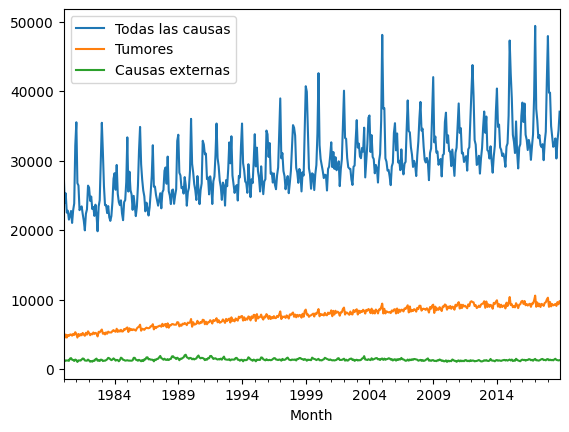

In [10]:
exec(open(r'C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\NuestrasFunciones.py').read())
defunciones.plot()
plt.show()

Podemos definir una función que calcule el test de Dickey Fuller para la estacionariedad de la serie. De esta forma, en cualquier momento, introduciendo el vector de valores de la serie, obtendremos el contraste de hipótesis. 

**Ho: Es serie no estacionaría**

**H1: Hay evidencia en contra de la no estacionariedad**

Por tanto, nos interesará que el contraste de hipótesis sea rechazado (p-valor < 0.05). 

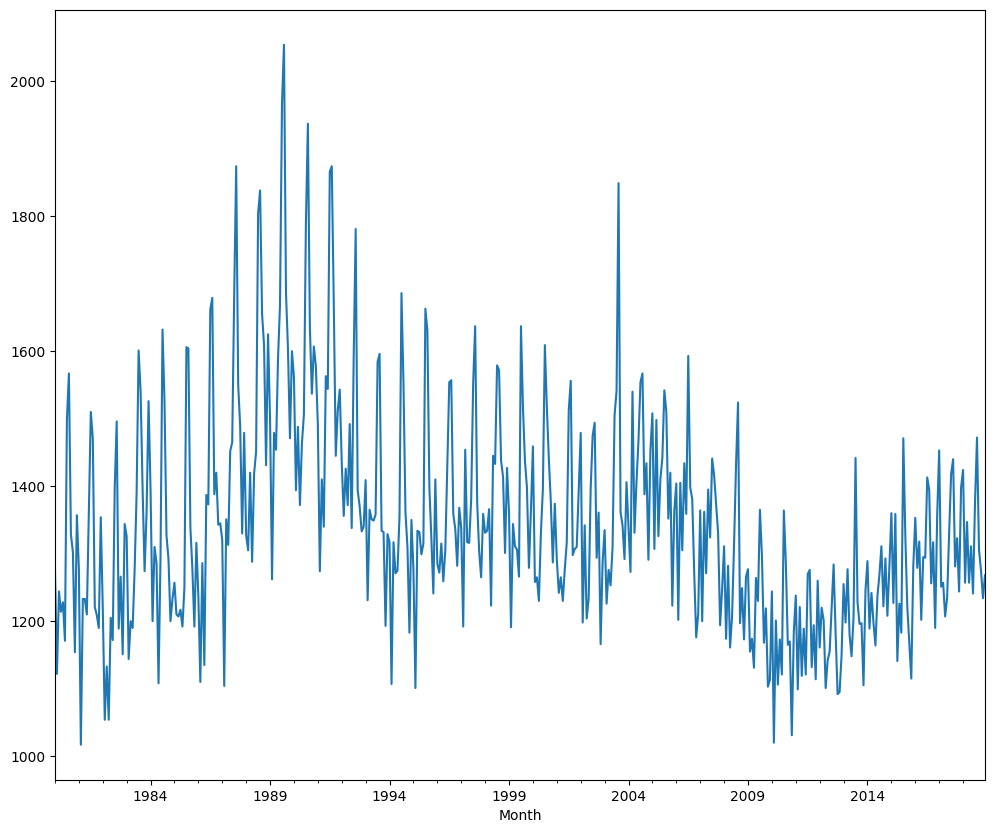

Results of Dickey-Fuller Test:
Test Statistic                  -2.347672
p-value                          0.407782
#Lags Used                      18.000000
Number of Observations Used    449.000000
Critical Value (1%)             -3.979075
Critical Value (5%)             -3.420313
Critical Value (10%)            -3.132828
dtype: float64
ConclusiÃ³n: =====>
No se puede rechazar la hipotesis nula
Los datos no son estacionarios


In [11]:
plt.rcParams["figure.figsize"] = (12,10) #sirve para agrandar el grafico 
defunciones["Causas externas"].plot()
plt.show()
test_stationarity(defunciones["Causas externas"])

**Ho: Es serie no estacionaría**

**H1: Hay evidencia en contra de la no estacionariedad**

Se observa la evolución de las enfermedades por causas externas en lo que observamos primeramente un crecimiento, luego un descenso entre 120 y 180 luego de esto vemos que se queda constante hasta un pico alto de defunciones (alrededor de 285) y luego se mantiene un poco constante. 

A simple vista correlacionando el grafico con el text de Dickey-Fuller vemos que el valor de p-value es igual a 0.4077 siendo mucho mayor que 0.05 **lo que significa que los datos aceptan la hipótesis nula, lo que significa que los datos no son estacionarios**, no se observa tendencia en nuestra grafica.


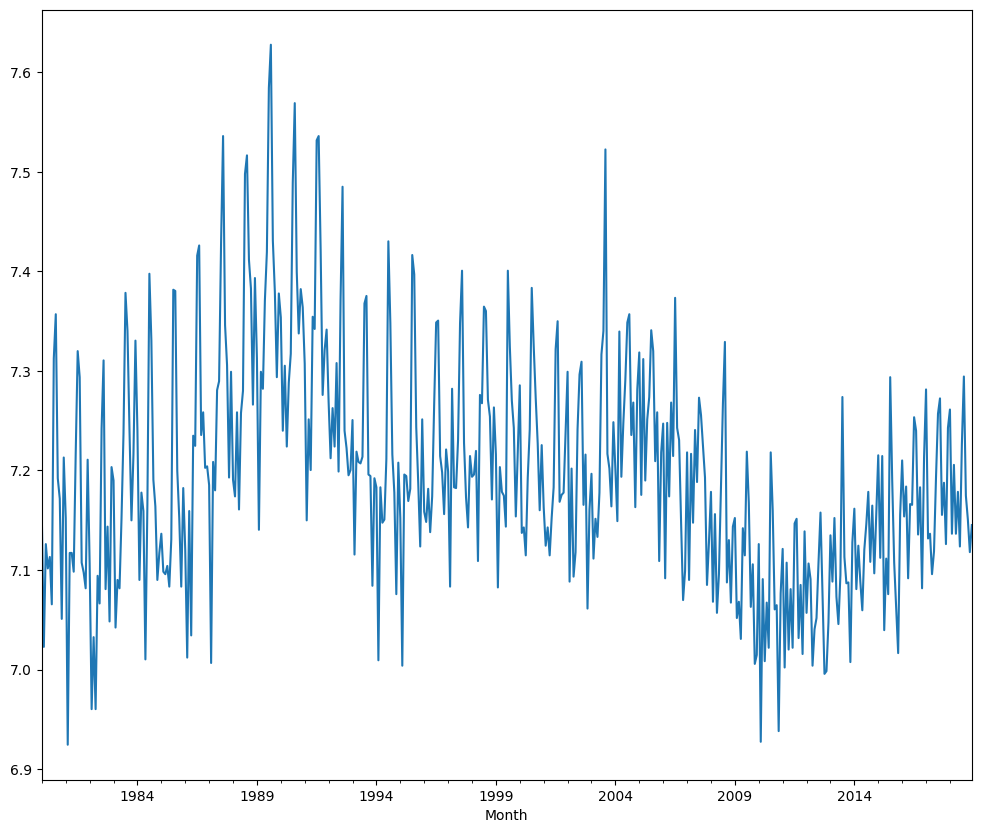

Results of Dickey-Fuller Test:
Test Statistic                  -2.327400
p-value                          0.418858
#Lags Used                      18.000000
Number of Observations Used    449.000000
Critical Value (1%)             -3.979075
Critical Value (5%)             -3.420313
Critical Value (10%)            -3.132828
dtype: float64
ConclusiÃ³n: =====>
No se puede rechazar la hipotesis nula
Los datos no son estacionarios


In [12]:
defTLog = np.log(defunciones["Causas externas"])
defTLog.plot()
plt.show()
test_stationarity(defTLog)

Al aplicar logaritmación vemos que nuestra serie no cambia incluso su p-value tiene un aumento pero no significativo pasado de un valor de 0.4077 a 0.4148, por lo tanto, apriori no se observa una diferencia significativa entre ambos por lo tanto se podrian utilizar cualquiera de las dos para diferenciar. (se diferenciara con ambas para observar los valores del p-valor y asi decidir)

Se observa que aplicar el logaritmo genera un cambio en nuestro p-value pero como no hay heteroscedasticidad se genera un cambio muy pequeño de p-value . Además, nuestra serie no sigue tendencia logarítmica o lineal.

### Descomposición de la serie

En base a la descomposición descriptiva por medias móviles, se extraen las componentes de tendencia y estacionalidad.

**Descomposición aditiva** 

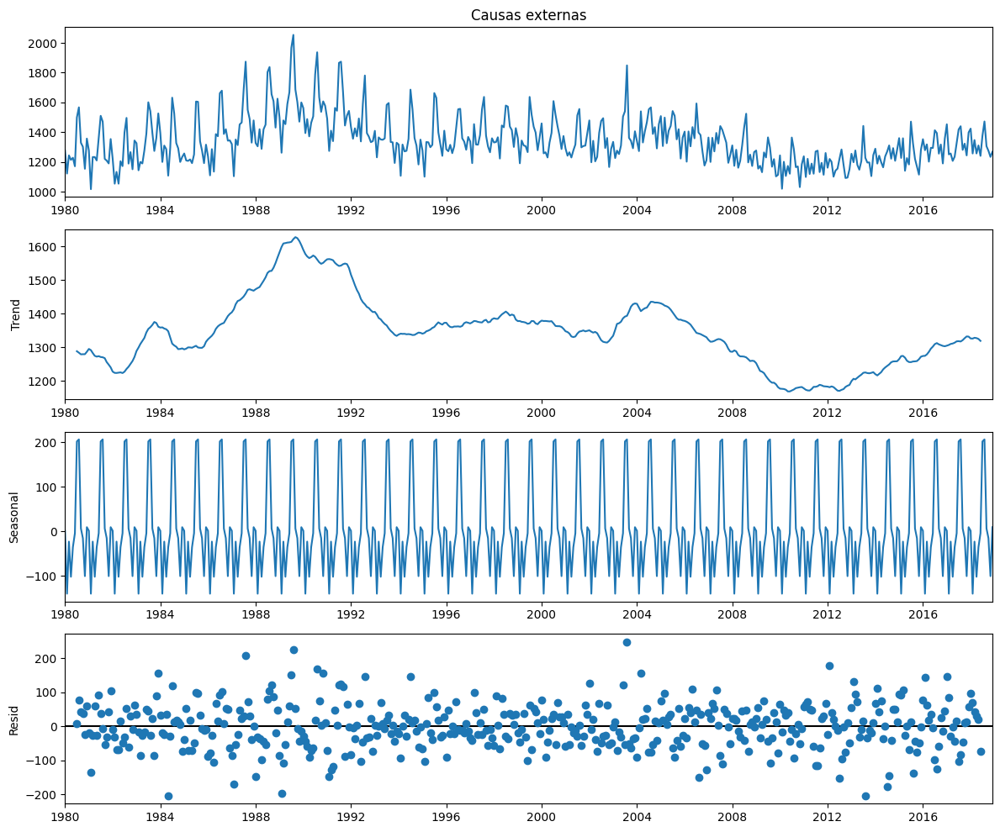

In [12]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Aplicar descomposición aditiva
defunciones_desc_Ad = seasonal_decompose(defunciones["Causas externas"], model='additive',period=12)
defunciones_desc_Ad.plot()
plt.show()

 En el modelo multiplicativo tenemos que: 
* **Tendencia:** No hay tendencia en nuestros datos debido a esto se puede ya sea aplicar la descomposición aditiva o multiplicativa.
* **Estacionalidad:** cuando se quita la tendencia se puede ver la estacionalidad super marcada, en la cual se observa un gran valor de frecuencias iguales gráficamente hablando. En la estacionalidad media estimada para todos los periodos vemos que le estamos restando hasta 100 puntos o sumando 200 según el caso.


In [13]:
test_stationarity(defunciones_desc_Ad.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -8.369701e+00
p-value                        1.000668e-11
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.979589e+00
Critical Value (5%)           -3.420561e+00
Critical Value (10%)          -3.132974e+00
dtype: float64
ConclusiÃ³n: =====>
Rechaza la hipotesis nula
Los datos son estacionarios


**Test de estacionariedad para los residuos:** Los residuos que no son NaN son estacionarios ya que según el test de Dickey-Fuller vemos un P valor bajo lo que nos indica que tenemos raíces fuera del círculo de unidad. Por lo tanto, se deberá sacar la estacionariedad de nuestro sistema.


**Descomposición multiplicativa** 

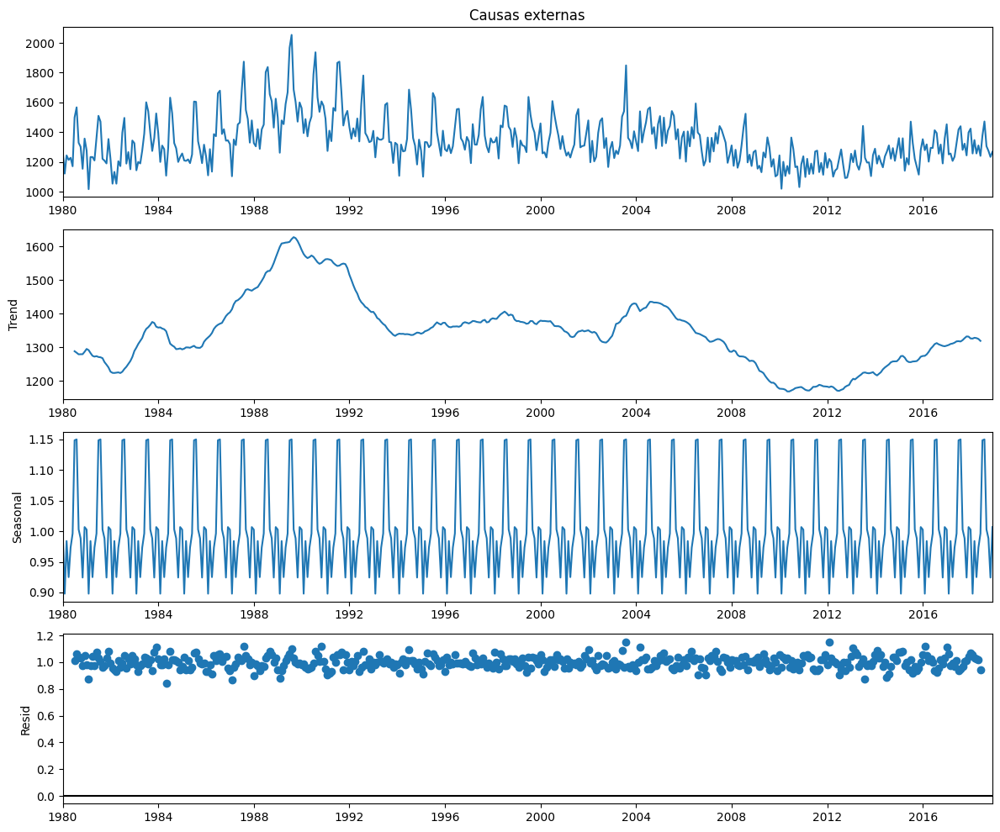

In [14]:
defunciones_desc_Mul = seasonal_decompose(defunciones["Causas externas"], model='multiplicative',period=12)
defunciones_desc_Mul.plot()
plt.show()

In [15]:
test_stationarity(defunciones_desc_Mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -8.225752e+00
p-value                        2.149456e-11
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.979589e+00
Critical Value (5%)           -3.420561e+00
Critical Value (10%)          -3.132974e+00
dtype: float64
ConclusiÃ³n: =====>
Rechaza la hipotesis nula
Los datos son estacionarios


Si se compara la descomposición aditiva (p-value: 1.000668e-11) con la multiplicativa (p-value: 2.149456e-11) no se ve un cambio significativo en el valor del p-valor, pero como es inferior en la multiplicativa que en la aditiva se propondra realizar la partición con el logaritmo para poder eliminar algún tipo de heteroscedasticidad.

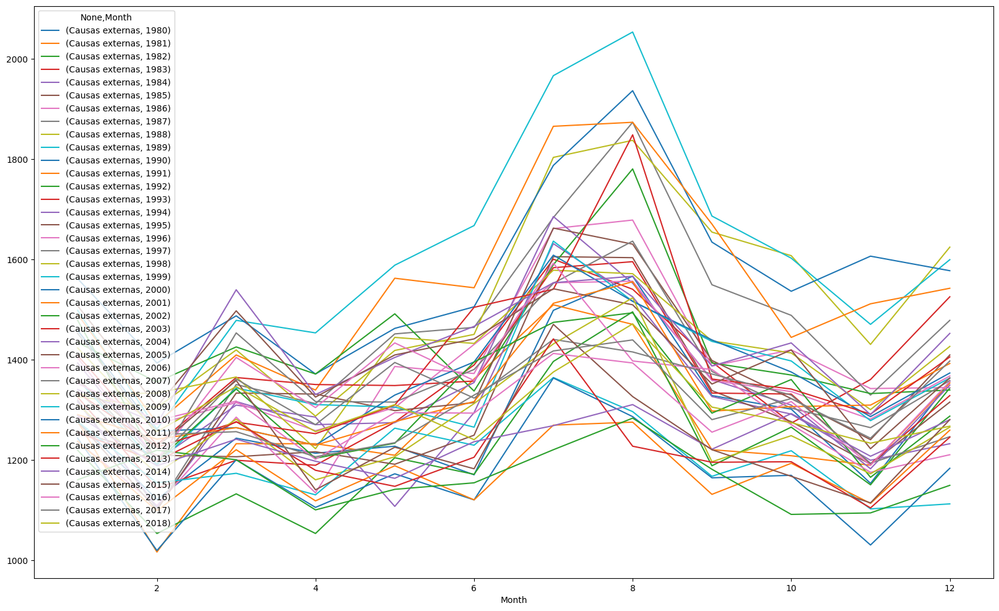

In [16]:
# Gráfico de estacionalidad
seasonal_plot(defunciones,column="Causas externas")
plt.show()

**Grafico season-plot:** la estacionalidad todos los meses de todos los años puestos unos sobre otros, vemos que la componente estacional es bastante constante en el tiempo porque la fluctuación va siendo parecida, no hay tendencia creciente de la serie porque no vemos variación significativa o creciente en los años, dado a esto tampoco se espera heteroscedasticidad.

#### Hacia la estacionariedad

#### Diferenciación regular

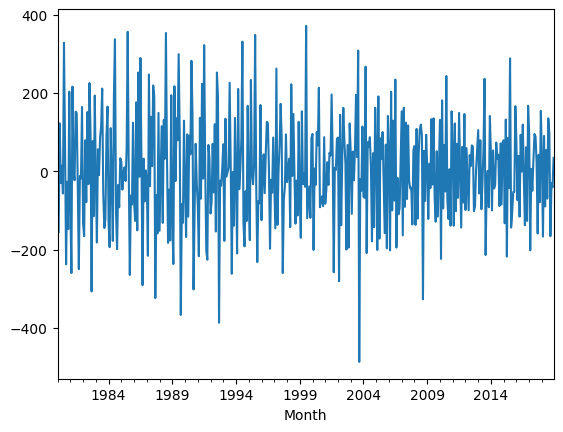

Results of Dickey-Fuller Test:
Test Statistic                  -5.236567
p-value                          0.000075
#Lags Used                      17.000000
Number of Observations Used    449.000000
Critical Value (1%)             -3.979075
Critical Value (5%)             -3.420313
Critical Value (10%)            -3.132828
dtype: float64
ConclusiÃ³n: =====>
Rechaza la hipotesis nula
Los datos son estacionarios


In [18]:
plt.style.use("default")
def_diff_1 = defunciones["Causas externas"].diff(periods=1)
def_diff_1.plot()
plt.show()
test_stationarity(def_diff_1.dropna(inplace=False))

**Ho: Es serie no estacionaría**

**H1: Hay evidencia en contra de la no estacionariedad**

Al aplicar la diferenciación regular mejoramos nuestro p-value pasando de un 0,40 a un 0,000075 mejorando notablemente. Lo que quíere decir que rechazamos nuestra hipotesis nula. Entonces los datos son estacionarios.



#### Diferenciación regular con log aplicado

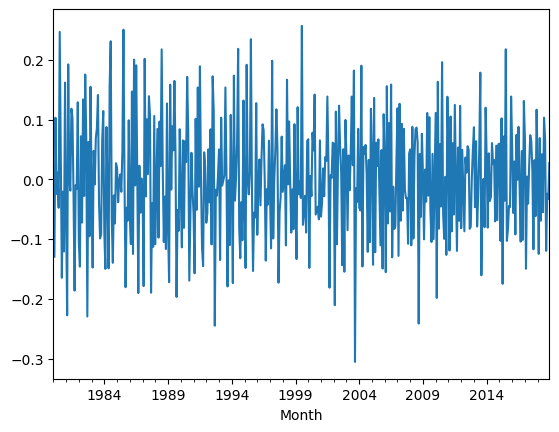

Results of Dickey-Fuller Test:
Test Statistic                  -5.238789
p-value                          0.000074
#Lags Used                      17.000000
Number of Observations Used    449.000000
Critical Value (1%)             -3.979075
Critical Value (5%)             -3.420313
Critical Value (10%)            -3.132828
dtype: float64
ConclusiÃ³n: =====>
Rechaza la hipotesis nula
Los datos son estacionarios


In [13]:
plt.style.use("default")
def_diff_1_log = defTLog.diff(periods=1)
def_diff_1_log.plot()
plt.show()
test_stationarity(def_diff_1_log.dropna(inplace=False))

**Ho: Es serie no estacionaría**

**H1: Hay evidencia en contra de la no estacionariedad**

Al aplicar la diferenciación regular mejoramos nuestro p-value pasando de un 0,41 a un 0,000074 mejorando notablemente. Lo que quíere decir que rechazamos nuestra hipotesis nula. Entonces los datos son estacionarios. (Aquí seguimos con la premisa inicial y es que nos da igual hacer la partición con log o no, compararemos como mejora nuestro p-value en la diferenciación estacional)

#### Diferenciación estacional

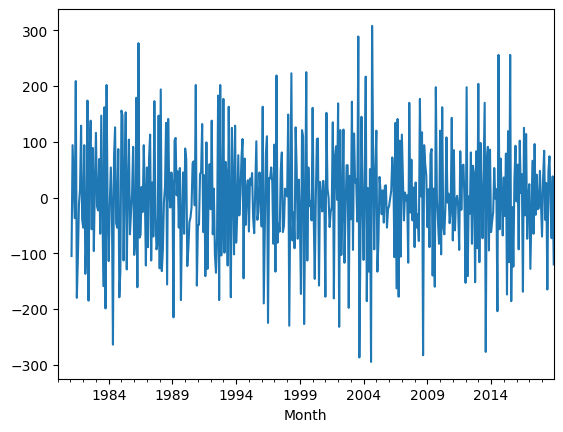

Results of Dickey-Fuller Test:
Test Statistic                -9.398700e+00
p-value                        4.648995e-14
#Lags Used                     1.300000e+01
Number of Observations Used    4.410000e+02
Critical Value (1%)           -3.979446e+00
Critical Value (5%)           -3.420493e+00
Critical Value (10%)          -3.132933e+00
dtype: float64
ConclusiÃ³n: =====>
Rechaza la hipotesis nula
Los datos son estacionarios


In [19]:
def_diff_1_12 = def_diff_1.diff(periods=12)
def_diff_1_12.plot()
plt.show()
test_stationarity(def_diff_1_12.dropna(inplace=False))

Se le aplica la serie diferenciada en lo estacional a la serie diferenciada en lo regular, lo que obtenemos es un gráfico sin subidas y bajadas propias de una estacionalidad. Si observamos el p-valor vemos que ya hemos obtenido una serie estacional solo diferenciando una vez en lo regular y una vez en lo estacional sin aplicar logaritmo (No obstante cabe aclarar que si se compara en plo estacional la serie diferenciada con logaritmo y sin logaritmo obtenemos un valor mejor para la logaritmica ya que su valor de p-value es 7.911738e-14 siendo mejor que 4.648995e-14). 

#### Diferenciación estacional con log aplicado

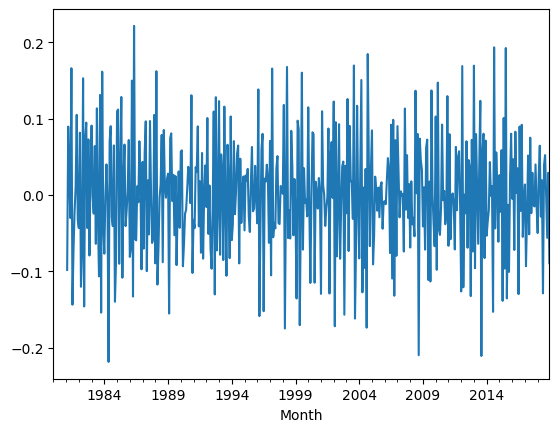

Results of Dickey-Fuller Test:
Test Statistic                -9.294729e+00
p-value                        7.911738e-14
#Lags Used                     1.300000e+01
Number of Observations Used    4.410000e+02
Critical Value (1%)           -3.979446e+00
Critical Value (5%)           -3.420493e+00
Critical Value (10%)          -3.132933e+00
dtype: float64
ConclusiÃ³n: =====>
Rechaza la hipotesis nula
Los datos son estacionarios


In [14]:
def_diff_1_12_log = def_diff_1_log.diff(periods=12)
def_diff_1_12_log.plot()
plt.show()
test_stationarity(def_diff_1_12_log.dropna(inplace=False))

#### Autocorrelaciones 

In [20]:
from statsmodels.tsa.stattools import acf, pacf #calcula
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf #pinta

Primero se plantea la serie al natural 

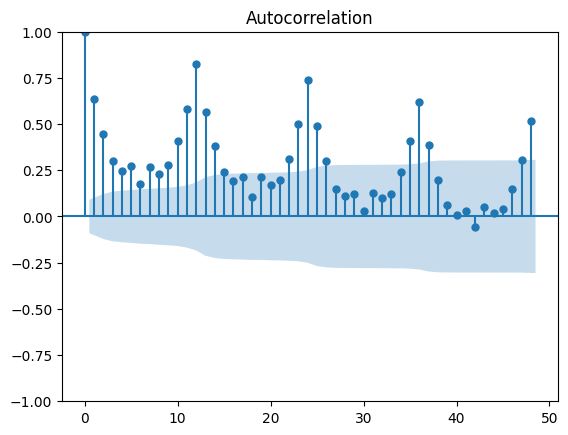

In [21]:
plot_acf(defunciones["Causas externas"].dropna(inplace=False), lags=48) 
plt.show()

Al natural no es estacionaria porque tiene un decrecimiento lento, además, en los puntos del 10 al 15 sube y vuelve a bajar.

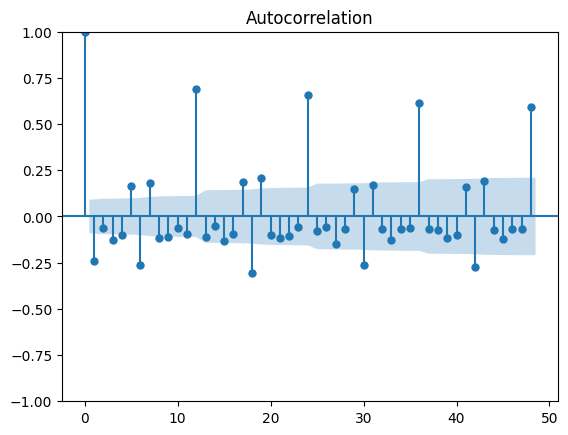

In [22]:
plot_acf(def_diff_1.dropna(inplace=False),  lags=48)
plt.show()

En el correlograma de la diferenciada, seguimos teniendo decrecimiento lento en los 4 picos más altos de correlación que se ven.

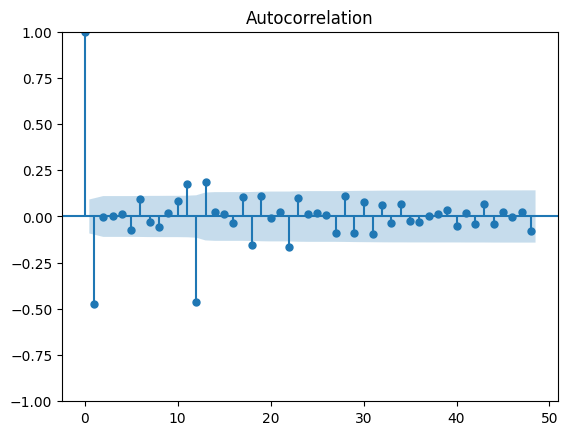

In [23]:
plot_acf(def_diff_1_12.dropna(inplace=False), lags=48)
plt.show()

En el correlograma de la diferenciación en lo estacional, ya no vemos estacionariedad, ya que vemos rapidamente un decrecimiento. hay un patro de desaparición de correlaciones rápido cosa que en el anterior grafico no habia. (todos estos graficos se probaron tambien con logaritmación pero el resultado es el mismo así que no se anexaron)

Se aplica el test de Ljung-Box que dice si hay ausencia de correlaciones en los residuos de la descomposición de cualquier tipo.

In [24]:
# Tets Ljung-box
print(" ")
print("Test de Ljung.Box para serie suavizada diferenciada a 12")
sm.stats.acorr_ljungbox(def_diff_1_12.dropna(inplace=False), lags=12, return_df=True)

 
Test de Ljung.Box para serie suavizada diferenciada a 12


,lb_stat,lb_pvalue
1,101.821869,6.074581e-24
2,101.832227,7.716366e-23
3,101.834953,6.264884e-22
4,101.924690,3.828455e-21
5,104.463712,6.048831e-21
6,108.436712,4.330584e-21
7,108.861384,1.581674e-20
8,110.279393,3.335886e-20
9,110.419319,1.207968e-19
10,113.824142,9.016984e-20


In [25]:
print(" ")
print("Test de Ljung.Box para serie sin suavizar")
sm.stats.acorr_ljungbox(defunciones["Causas externas"], lags=12, return_df=True)

 
Test de Ljung.Box para serie sin suavizar


,lb_stat,lb_pvalue
1,189.022516,5.196340e-43
2,282.117236,5.483030e-62
3,324.865445,4.125603e-70
4,354.206214,2.166553e-75
5,389.421490,5.649213e-82
6,403.860366,4.135325e-84
7,438.317948,1.431359e-90
8,464.170662,3.396559e-95
9,501.553653,2.672693e-102
10,582.130635,1.184890e-118


**Ho:** Los residuos son ausentes de correlación 

**H1:** Los residuos no son ausentes de correlación

Lo que vemos es que si se esta rechazando el p-valor los residuos tienen correlación significativa.

In [26]:
print(" ")
print("Test de Ljung.Box para serie suavizada con diferenciación")
sm.stats.acorr_ljungbox(def_diff_1.dropna(inplace=False), lags=12, return_df=True)

 
Test de Ljung.Box para serie suavizada con diferenciación


,lb_stat,lb_pvalue
1,27.846743,1.313149e-07
2,29.622375,3.694733e-07
3,37.015071,4.567720e-08
4,41.869084,1.775712e-08
5,54.743265,1.474149e-10
6,87.318499,1.091540e-16
7,102.709885,2.971315e-19
8,109.094552,5.843636e-20
9,115.255437,1.247033e-20
10,117.034709,2.019997e-20


## 2- Partición training y test (los últimos 2 años de datos).

### Modelos de suavizado

Exploramos ahora los distintos métodos de suavizado estudiados sobre la serie de muertes por causas externas. Antes de nada, tomamos las ventanas de training y test para ajuste y evaluación del modelo, respectivamente. 


In [27]:
import statsmodels.tsa.holtwinters as ets
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Generamos la serie logaritmica
defuncionesLog = defunciones.copy()
defuncionesLog["Causas externas"] = np.log(defuncionesLog["Causas externas"])
CE = pd.DataFrame(defuncionesLog["Causas externas"])
CE.head()


,Causas externas
Month,
1980-01-01,7.152269
1980-02-01,7.022868
1980-03-01,7.126087
1980-04-01,7.101676
1980-05-01,7.113142


In [28]:
#se cogen las ventanas de series y test desde el inicio hasta el 1980 del 2016

defT_tr = CE[:'2016-12-01']
defT_tst = CE['2017-01-01':] #dejamos dos años para el test
defT_tst

,Causas externas
Month,
2017-01-01,7.281386
2017-02-01,7.131699
2017-03-01,7.136483
2017-04-01,7.095893
2017-05-01,7.118826
2017-06-01,7.192934
2017-07-01,7.257003
2017-08-01,7.272398
2017-09-01,7.155396


#### Suavizado Simple

Suavizado simple, ya sabemos que no va a ajustar bien pues es para series sin tendencia y estacionalidad. Solo por ver como ajustarlo en caso de necesidad. Esperamos predicciones constantes para la ventana de test.

In [29]:
ses = ets.SimpleExpSmoothing(defT_tr["Causas externas"]).fit()
#suavizado simple 
ses.summary()

c:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Tarea\mdd-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Dep. Variable:,Causas externas,No. Observations:,444
Model:,SimpleExpSmoothing,SSE,3.942
Optimized:,True,AIC,-2093.566
Trend:,None,BIC,-2085.374
Seasonal:,None,AICC,-2093.475
Seasonal Periods:,None,Date:,"ma., 04 abr. 2023"
Box-Cox:,False,Time:,22:17:49
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1401068,alpha,True
initial_level,7.1353871,l.0,True


Evaluación del modelo SES.

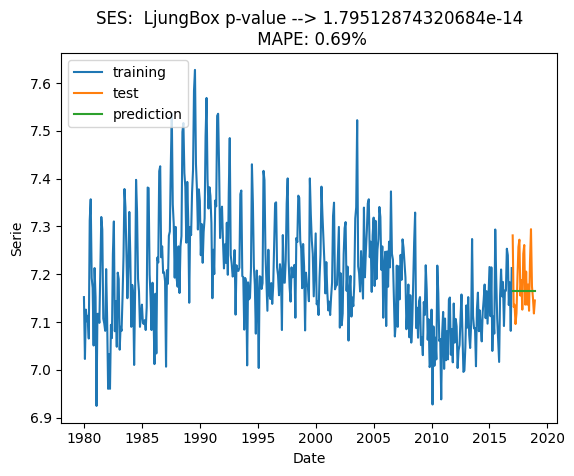

1.79512874320684e-14


In [30]:
# Evaluar SES
eval_model(ses,defT_tr["Causas externas"],defT_tst["Causas externas"],'SES')

#### Suavizado doble de Holt

Suavizado doble de Holt, con pendiente pero sin componente estacional. Esperamos una recta con pendiente como predicción.

c:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Tarea\mdd-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                              Holt Model Results                              
Dep. Variable:        Causas externas   No. Observations:                  444
Model:                           Holt   SSE                              3.943
Optimized:                       True   AIC                          -2089.445
Trend:                       Additive   BIC                          -2073.061
Seasonal:                        None   AICC                         -2089.252
Seasonal Periods:                None   Date:                ma., 04 abr. 2023
Box-Cox:                        False   Time:                         22:17:55
Box-Cox Coeff.:                  None                                         
                       coeff                 code              optimized      
------------------------------------------------------------------------------
smoothing_level            0.5163894                alpha                 True
smoothing_trend           1.1009e-16                

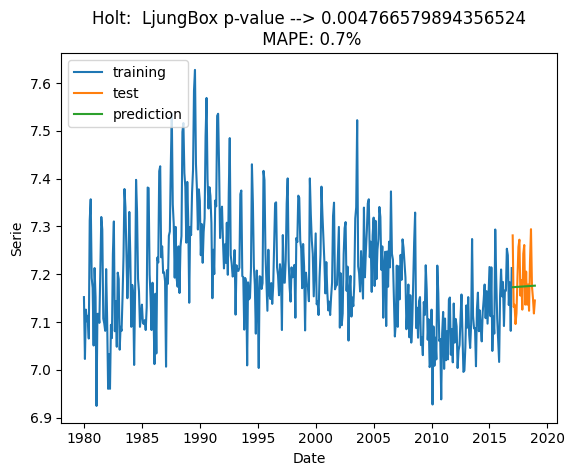

0.004766579894356524


In [31]:
# Suavizado de Holt
holt = ets.Holt(defT_tr["Causas externas"]).fit()
print(holt.summary())

eval_model(holt,defT_tr["Causas externas"],defT_tst["Causas externas"],'Holt')
# no vamos a captar la estacionalidad 

En el alpha (smoothing_level) y en el beta (smoothing_trend), no se está suavizando de correcta manera y además si observamos la predicción vemos que no predice de manera correcta.

Nos dice que las defunciones causadas por enfermedades externas se mantendrán constantes, pero no pasa el test de residuos entonces no es un modelo muy adecuado.


#### Suavizado de Holt Winters Aditivo

Ahora si, vamos a los métodos que podrían funcionar sobre esta serie. En primer lugar, Holt Winters aditivo. Con el aspecto de la serie y la clara heterocedasticidad, no parece que sea la mejor opción...pero probad con el logaritmo veréis que cambio. 


c:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Tarea\mdd-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:          Causas externas   No. Observations:                  444
Model:             ExponentialSmoothing   SSE                              1.063
Optimized:                         True   AIC                          -2647.474
Trend:                         Additive   BIC                          -2581.941
Seasonal:                      Additive   AICC                         -2645.865
Seasonal Periods:                    12   Date:                ma., 04 abr. 2023
Box-Cox:                          False   Time:                         22:18:15
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.2462207                alpha                 True
smoothing_trend          

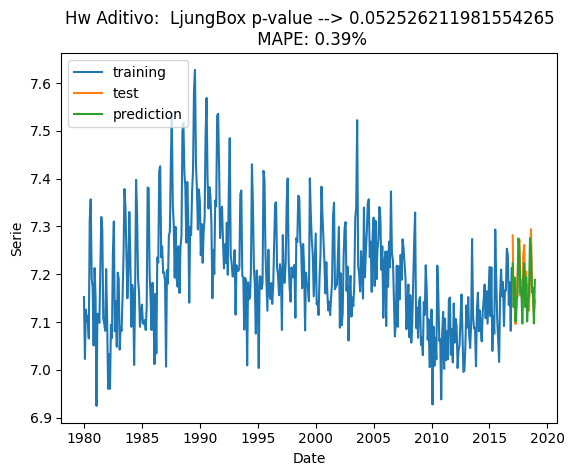

0.052526211981554265


In [32]:
hw_add = ets.ExponentialSmoothing(defT_tr["Causas externas"],trend='add', damped_trend=False, seasonal='add').fit()
print(hw_add.summary())

eval_model(hw_add,defT_tr["Causas externas"],defT_tst["Causas externas"],'Hw Aditivo')

c:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Tarea\mdd-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                       ExponentialSmoothing Model Results                       
Dep. Variable:          Causas externas   No. Observations:                  444
Model:             ExponentialSmoothing   SSE                              1.060
Optimized:                         True   AIC                          -2648.653
Trend:                   Multiplicative   BIC                          -2583.120
Seasonal:                Multiplicative   AICC                         -2647.044
Seasonal Periods:                    12   Date:                ma., 04 abr. 2023
Box-Cox:                          False   Time:                         22:18:39
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.2476286                alpha                 True
smoothing_trend          

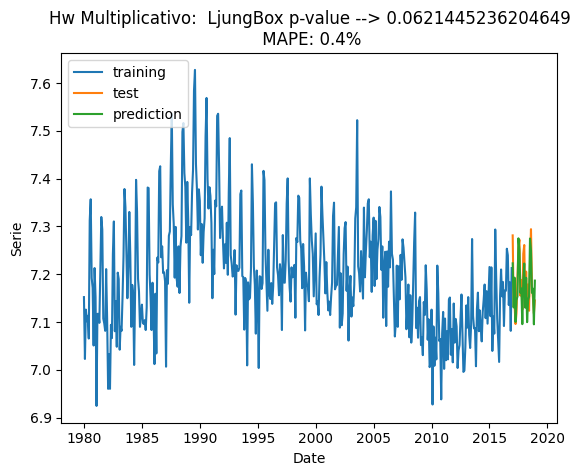

0.0621445236204649


In [33]:
hw_mul = ets.ExponentialSmoothing(defT_tr["Causas externas"],trend='mul', damped_trend=False, seasonal='mul').fit()
print(hw_mul.summary())

eval_model(hw_mul,defT_tr["Causas externas"],defT_tst["Causas externas"],'Hw Multiplicativo')

Nuestro aplha nos da un valor de 0.2462207 lo que quiere decir que nuestra serie está suavizando en nivel, aunque está muy justo, por el contrario, si se analiza el beta nos da un valor muy bajo 5.0825e-18 lo que quiere decir que se está suavizando con respecto a la pendiente de forma correcta. 
Esta subestimando en algunos puntos, pero la forma de la serie la está captando correctamente.
No se puede rechazar la hipótesis nula ya que esta justo en la brecha del 95% el p-valor dando un valor de 0.0525. (Se anexa el multiplcativo para generar constancia de que su predicción es un poco peor que la adictiva como se habia observado antes)


## 3- Mejor modelo de suavizado exponencial. ¿Pasa el test residual de Ljung.Box? 

Con respecto a los modelos de suavizado exponenecial aplicados anteriormente con el unico modelo que nos quedamos es con el modelo en el que se aplica el suavizado de Holt Winters Aditivo ya que en este obtenemos una estimación mucho mejor que en los antiguos además de que nuestro p-valor da un valor de aceptación de 0.0525.

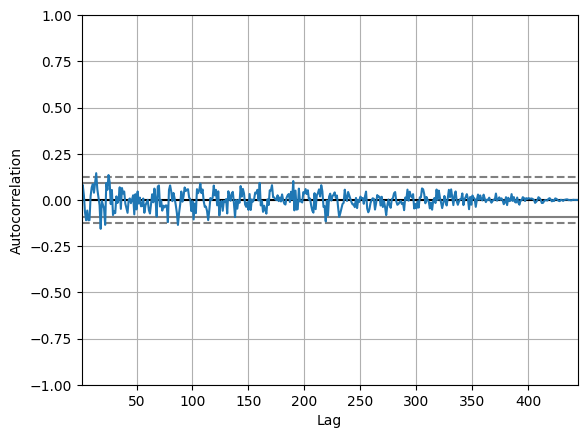

In [34]:
from pandas.plotting import autocorrelation_plot

plt.clf()
autocorrelation_plot(hw_add.resid)
plt.show()

Lo que se observa es que los residuos están exentos de patrón, pero hay valores que están por fuera de las bandas de confianza al inicio del gráfico, por esto es que vemos un valor de p-value muy justo ya que es 0.0525. Con respecto a este análisis y al del test anteriormente aplicado vemos que no pasa el test residual de Ljung.Box. Pero nos quedaremos con el modelo **hw_add** ya que es el que mejor se ajusta. 

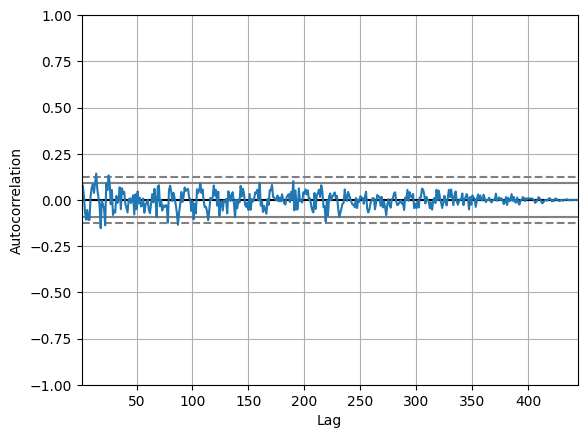

In [35]:
plt.clf()
autocorrelation_plot(hw_mul.resid)
plt.show()

como es de esperar los residuos no mejoran tampoco, de una u otra forma son casi iguales a los que ya teniamos

## 4- Mejor modelo ARIMA. ¿Pasa el test residual de Ljung.Box?

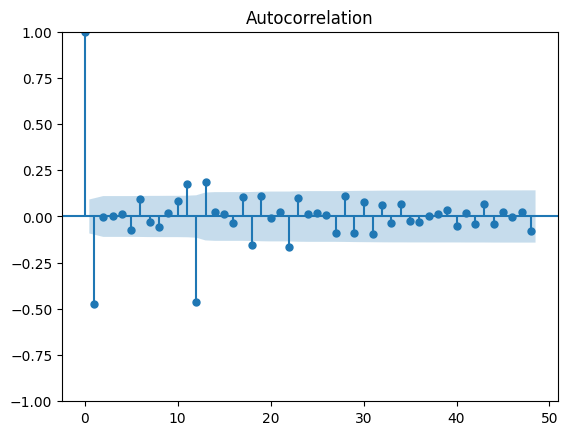

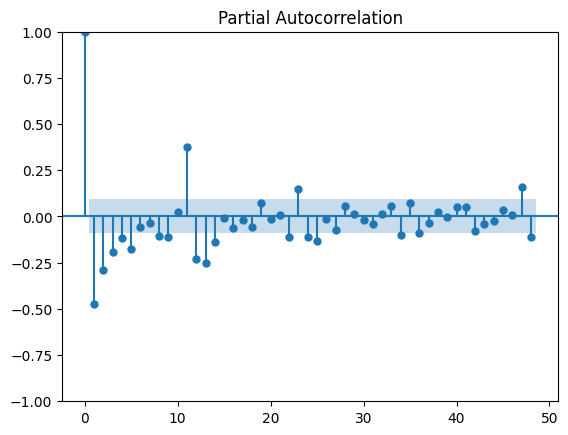

In [36]:
plot_acf(def_diff_1_12.dropna(inplace=False),lags=48)
plt.show()
plot_pacf(def_diff_1_12.dropna(inplace=False),lags=48,method='ywm')
plt.show()

**ACF**: Podría ser un AR si consideramos que hay decrecimiento rápido y no corte en el segundo retardo. Si es así, el orden del AR sería 1 por el corte en el pacf. En lo estacional, el retardo 12 es significativo así que podríamos decir que es un MA 

**PACF**: Hay un retardo en el 2 y 3 con descenso por lo tanto podremos decur que es un MA o un enmascaramiento de ambos. En lo estacional, de nuevo el retardo 12 jugando y no queda clara la dinámica de desaparición de las autocorrelaciones estacionales

Con esto probaremos algo así como ARIMA(0-1,1,1)(0,1,1)[12]

**Modelo 1** -> Con ambas partes MA



In [37]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
  
arima1 = SARIMAX(defT_tr["Causas externas"], 
                order = (0, 1, 1), 
                seasonal_order =(0, 1, 1, 12))
  
arima_1 = arima1.fit()
arima_1.summary()

c:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Tarea\mdd-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Tarea\mdd-env\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                    Causas externas   No. Observations:                  444
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                 677.033
Date:                           ma., 04 abr. 2023   AIC                          -1348.066
Time:                                    22:20:40   BIC                          -1335.868
Sample:                                01-01-1980   HQIC                         -1343.250
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7169      0.036    -20.175      0.000      -0.787      -0.647
ma.S.L12      -0.7908      0.036    -22.109      0.000      -0.861      -0.721
sigma2         0.0025      0.000     16.054      0.000       0.002       0.003
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 5.64
Prob(Q):                              0.77   Prob(JB):                         0.06
Heteroskedasticity (H):               0.75   Skew:                             0.06
Prob(H) (two-sided):                  0.09   Kurtosis:                         3.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Los p-valores de nuestro parametros son 0.0 por lo tanto todas nuestras variables son significativas

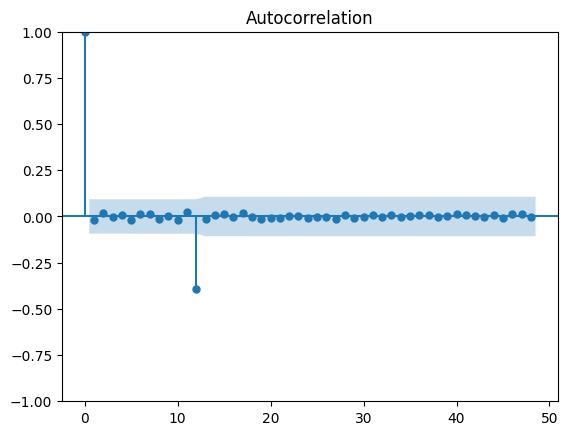

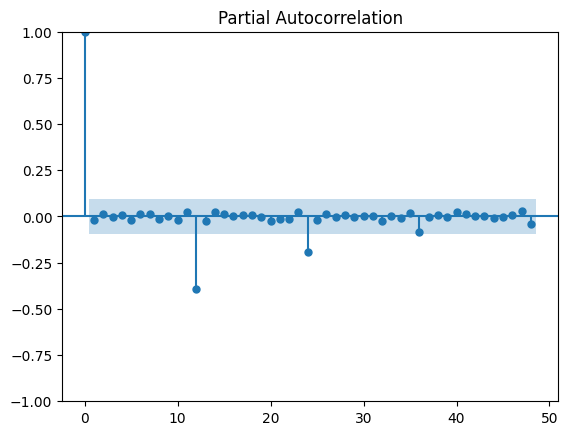

In [96]:
plot_acf(arima_1.resid, lags=48)
plt.show()
plot_pacf(arima_1.resid, lags=48, method="ywm")
plt.show()

Cumplen en general excepto para el retardo 12 que es significativo

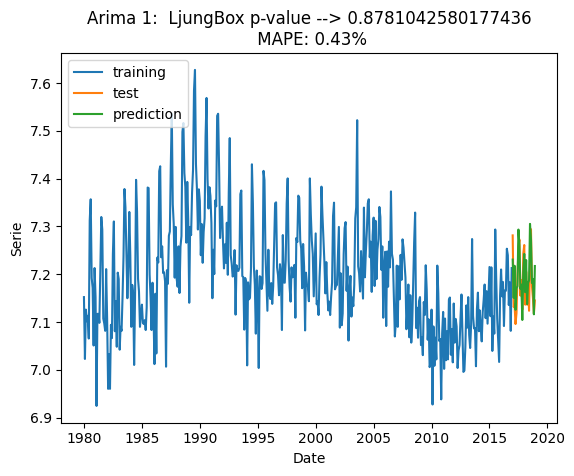

0.8781042580177436


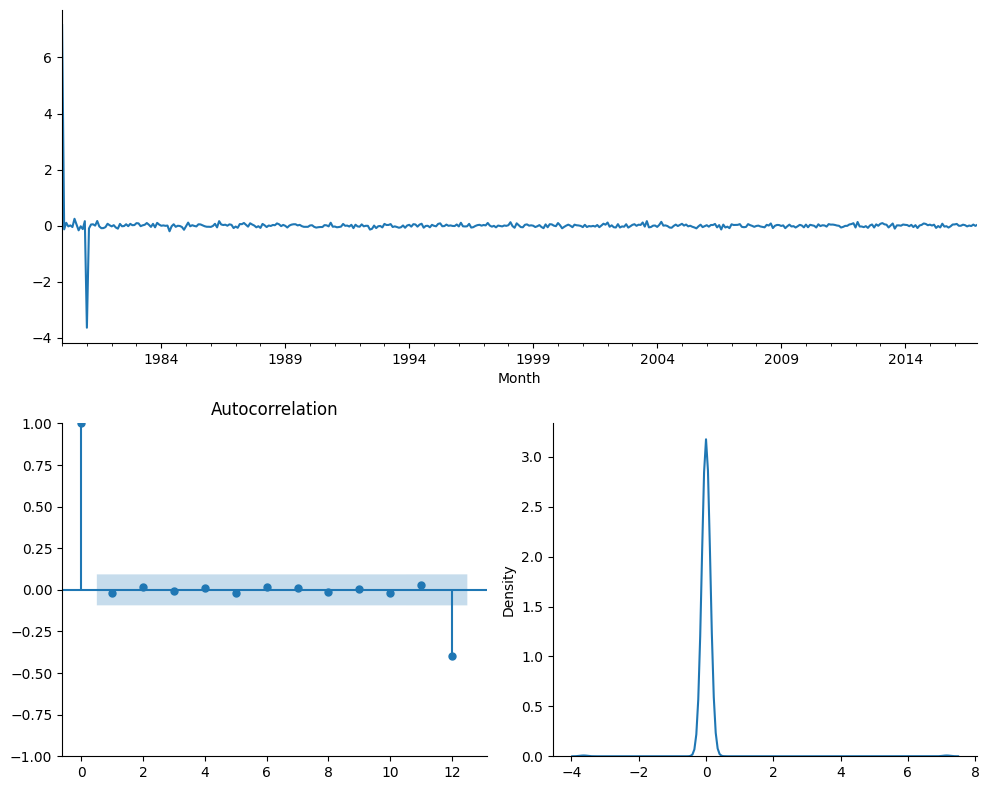

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.878 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel='Month'>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [97]:
eval_model(arima_1,defT_tr["Causas externas"],defT_tst["Causas externas"],'Arima 1')

residcheck(arima_1.resid,12)

Best model:  ARIMA(1,0,1)(1,0,1)[12]  

**Mean of the residuals:**  0.01 esta cercana a cero por lo tanto esto nos beneficia al modelo.

**Ljung Box Test:** el valor del p-valor es de 0.878 (>0.05, Uncorrelated) son incorrelados ya que se sabe que hay algo en lo estacional aunque en nuestro grafico de autocorrelación no se logra observar nada fuera de lo común.

**Jarque Bera Normality Test** el valor del p-valor es 0.0 (<0.05, Not-normal), si se coge la serie entera de residuos nos dice que no tenemos.

**AD Fuller** el valor del p-valor es 0.0 al ser menor que 0,5 esto nos dice que los datos son estacionarios.

Tenemos un modelo relativamente en residuos con un error mayor que los suavizados.

**Modelo 2** -> Con ambas partes AR

In [98]:
arima2 = SARIMAX(defT_tr["Causas externas"], 
                order = (1, 1, 0), 
                seasonal_order =(1, 1, 0, 12))
  
arima_2 = arima2.fit()
arima_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                    Causas externas   No. Observations:                  444
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                 609.564
Date:                           lu., 03 abr. 2023   AIC                          -1213.127
Time:                                    23:41:08   BIC                          -1200.929
Sample:                                01-01-1980   HQIC                         -1208.311
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5349      0.039    -13.726      0.000      -0.611      -0.458
ar.S.L12      -0.5419      0.043    -12.532      0.000      -0.627      -0.457
sigma2         0.0034      0.000     16.262      0.000       0.003       0.004
===================================================================================
Ljung-Box (L1) (Q):                  11.54   Jarque-Bera (JB):                 5.32
Prob(Q):                              0.00   Prob(JB):                         0.07
Heteroskedasticity (H):               0.76   Skew:                             0.04
Prob(H) (two-sided):                  0.11   Kurtosis:                         3.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Modelo 2** -> Con ambas partes AR

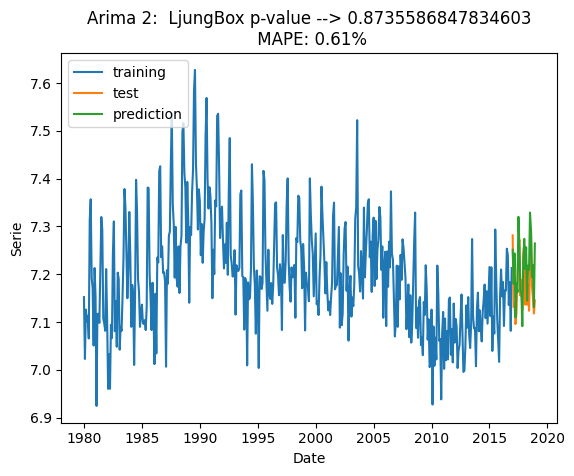

0.8735586847834603


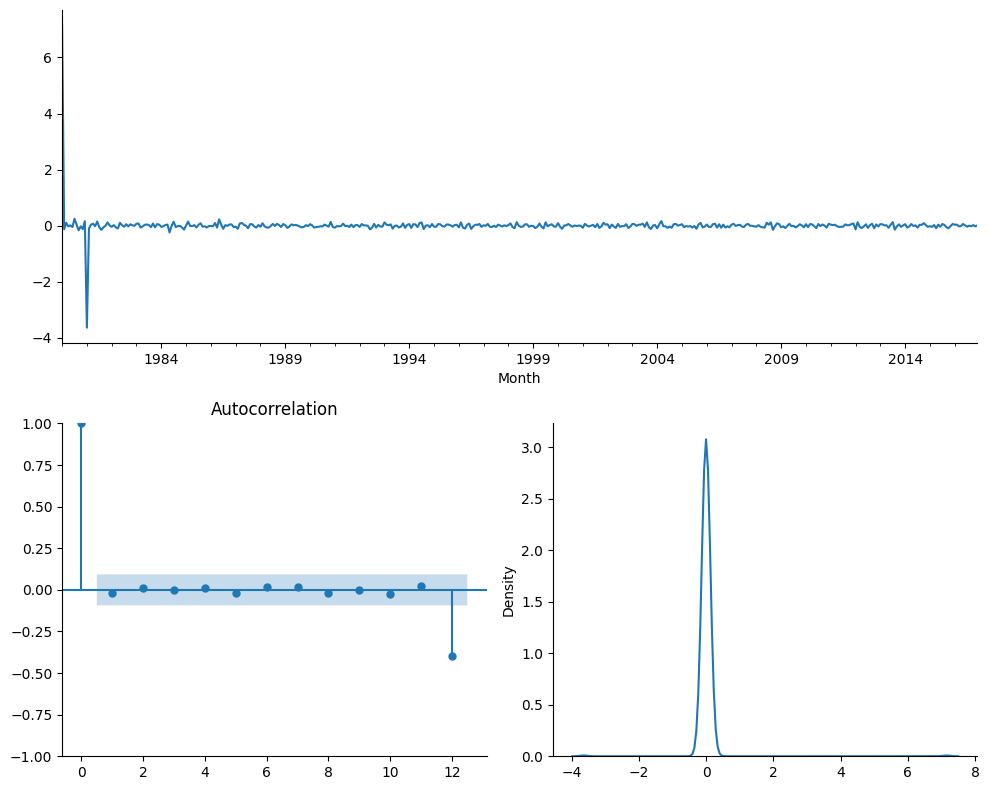

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.874 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel='Month'>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [99]:
eval_model(arima_2,defT_tr["Causas externas"],defT_tst["Causas externas"],'Arima 2')

residcheck(arima_2.resid,12)


**Modelo 3** -> Superposición de efectos ARMA en regular y estacional

In [103]:
arima3 = SARIMAX(defT_tr["Causas externas"], 
                order = (1, 1, 1), 
                seasonal_order =(1, 1, 1, 12))
  
arima_3 = arima3.fit()
arima_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                    Causas externas   No. Observations:                  444
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                 677.222
Date:                           lu., 03 abr. 2023   AIC                          -1344.445
Time:                                    23:57:57   BIC                          -1324.114
Sample:                                01-01-1980   HQIC                         -1336.418
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0427      0.069      0.616      0.538      -0.093       0.178
ma.L1         -0.7426      0.045    -16.417      0.000      -0.831      -0.654
ar.S.L12       0.0211      0.063      0.336      0.737      -0.102       0.144
ma.S.L12      -0.8024      0.044    -18.034      0.000      -0.890      -0.715
sigma2         0.0025      0.000     16.005      0.000       0.002       0.003
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 6.15
Prob(Q):                              0.93   Prob(JB):                         0.05
Heteroskedasticity (H):               0.75   Skew:                             0.07
Prob(H) (two-sided):                  0.09   Kurtosis:                         3.57
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

vemos que ar.S.L12 no es significativo ya que nuestro p-value es 0.737.

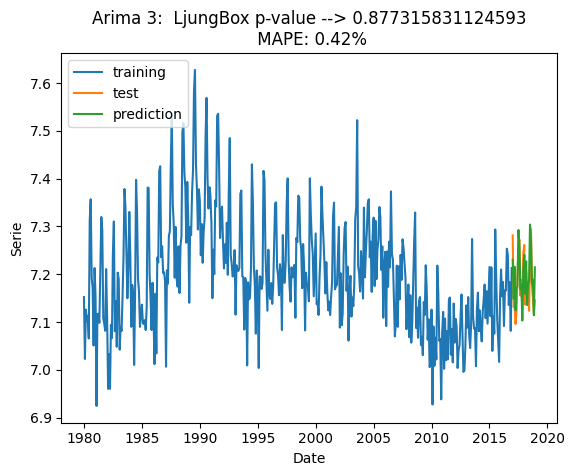

0.877315831124593


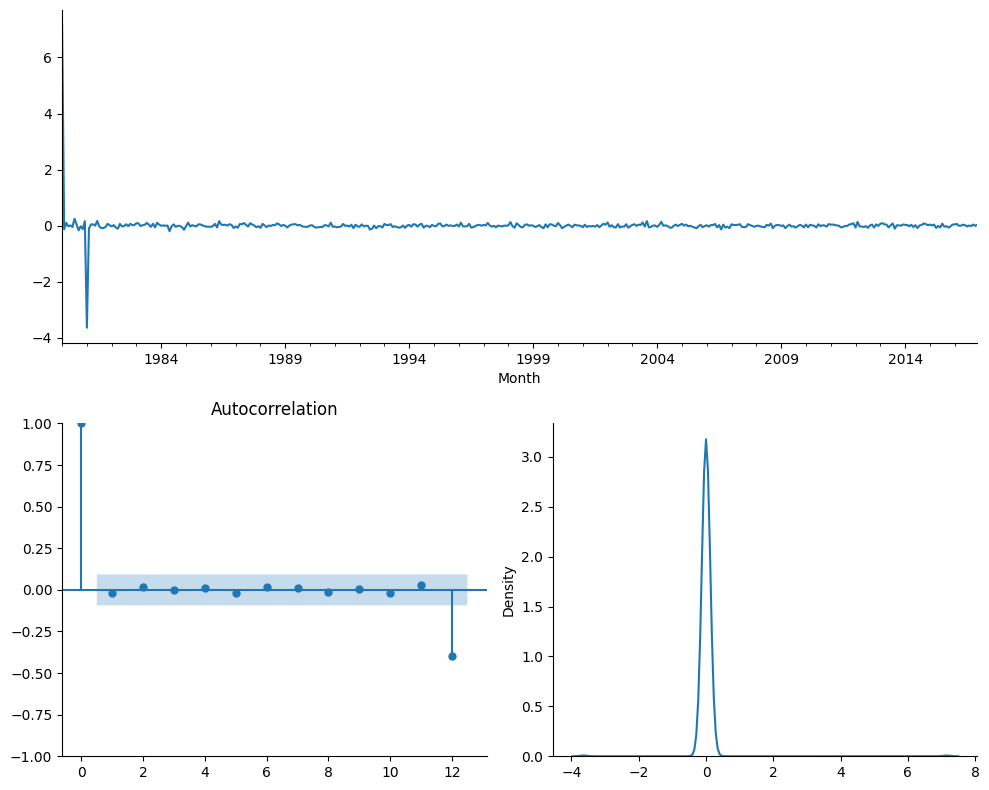

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.877 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel='Month'>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [104]:
eval_model(arima_3,defT_tr["Causas externas"],defT_tst["Causas externas"],'Arima 3')
residcheck(arima_3.resid,12)

In [105]:
import pmdarima as pm

# Ajustamos modelo arima step-wise con métrica AIC para la serie de vuelos
arima_auto = pm.auto_arima(defT_tr["Causas externas"], start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None, 
                      D=None, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima_auto.summary())
#se deja libertad a las d para ser calculadas
#p a 5 no estaria bien visto 

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=-1207.363, Time=2.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-648.497, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-1212.454, Time=1.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-993.393, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3014.855, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-868.027, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=-1233.539, Time=2.71 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=-1226.753, Time=2.58 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=-1199.950, Time=1.21 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=-1165.379, Time=3.47 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=-1231.868, Time=4.71 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=-1212.211, Time=4.21 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=-1211.752, Time=3.55 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=-1262.366, Time=5.46 sec
 ARIMA(2,

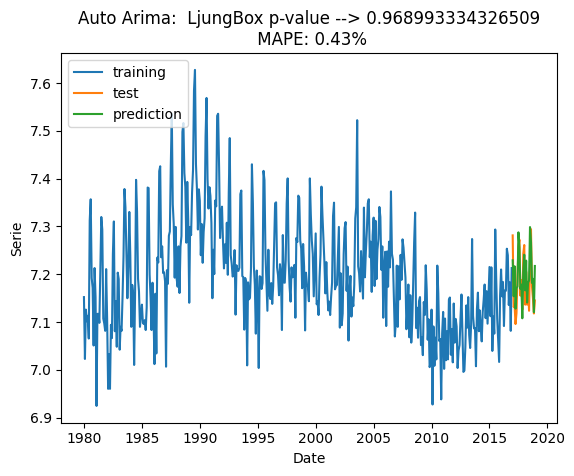

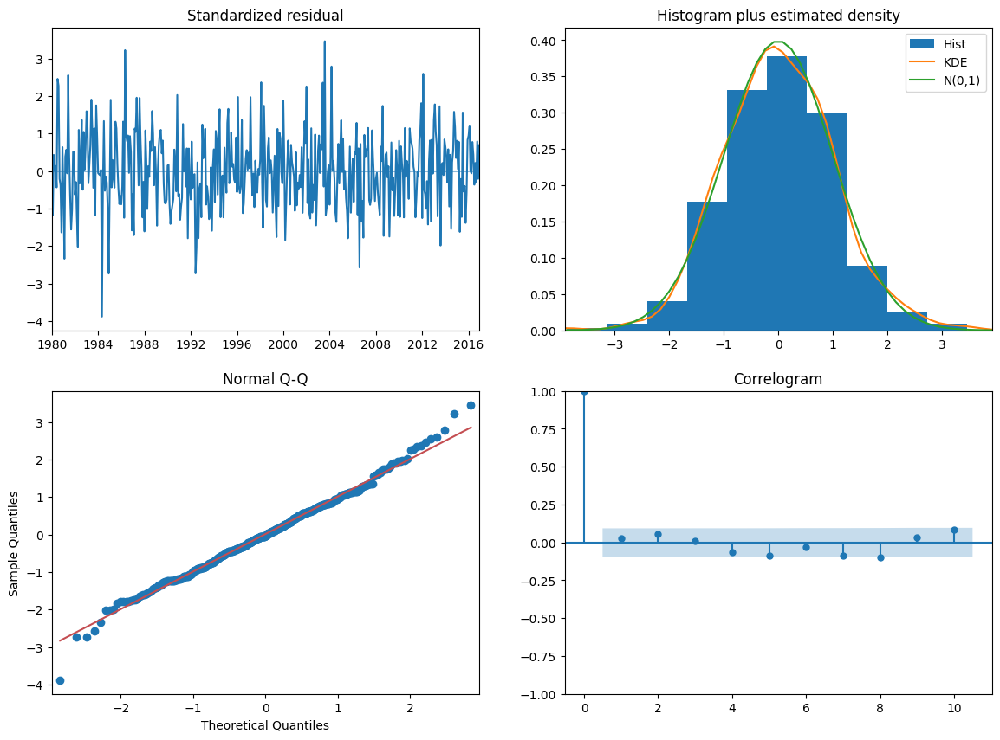

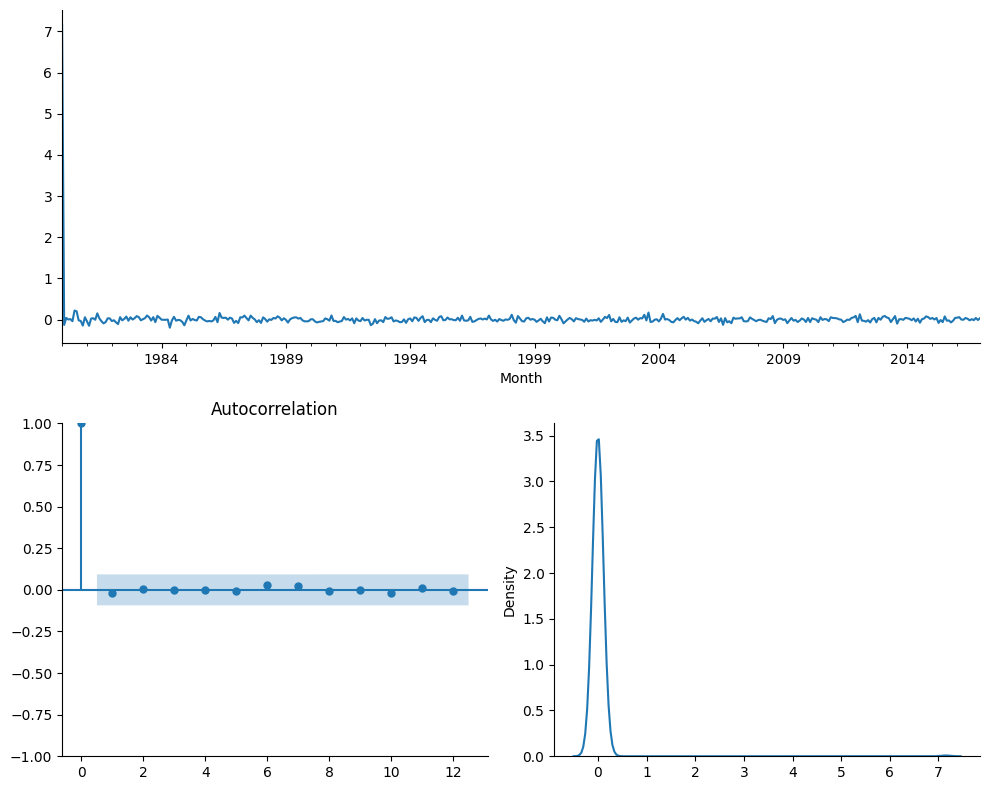

** Mean of the residuals:  0.02

** Ljung Box Test, p-value: 0.969 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel='Month'>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [107]:
eval_model_Aarima(arima_auto,defT_tr["Causas externas"],defT_tst["Causas externas"],'Auto Arima')
residcheck(arima_auto.resid(),12)

Best model:  ARIMA(1,0,1)(1,0,1)[12]  

**Mean of the residuals:**  0.02 esta cercana a cero por lo tanto esto nos beneficia al modelo.

**Ljung Box Test:** el valor del p-valor es de 0.969 (>0.05, Uncorrelated) son incorrelados ya que se sabe que hay algo en lo estacional aunque en nuestro grafico de autocorrelación no se logra observar nada fuera de lo común.

**Jarque Bera Normality Test** el valor del p-valor es 0.0 (<0.05, Not-normal), si se coge la serie entera de residuos nos dice que no tenemos.

**AD Fuller** el valor del p-valor es 0.0 al ser menor que 0,5 esto nos dice que los datos son estacionarios.

Tenemos un modelo relativamente en residuos con un error mayor que los suavizados.

In [44]:
import pmdarima as pm

# Ajustamos modelo arima step-wise con métrica AIC para la serie de vuelos
arima_auto_1 = pm.auto_arima(defT_tr["Causas externas"], start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=1,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None, 
                      D=None, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima_auto_1.summary())
#se deja libertad a las d para ser calculadas
#p a 5 no estaria bien visto 

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-1348.704, Time=2.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-776.287, Time=0.10 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-1146.260, Time=0.55 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-1020.137, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-778.287, Time=0.07 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-1061.951, Time=1.10 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=-1229.131, Time=1.42 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=-1340.695, Time=4.02 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=-1347.569, Time=4.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-895.355, Time=0.29 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=-1145.619, Time=3.83 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=-1311.132, Time=3.31 sec
 ARIMA(1,1,1)(2,0,2)[12] intercept   : AIC=-1365.620, Time=4.68 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-1366.902, Time=4.67 sec
 ARIMA(0

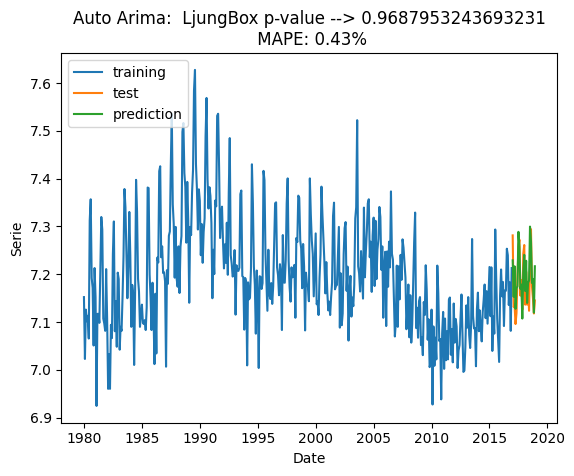

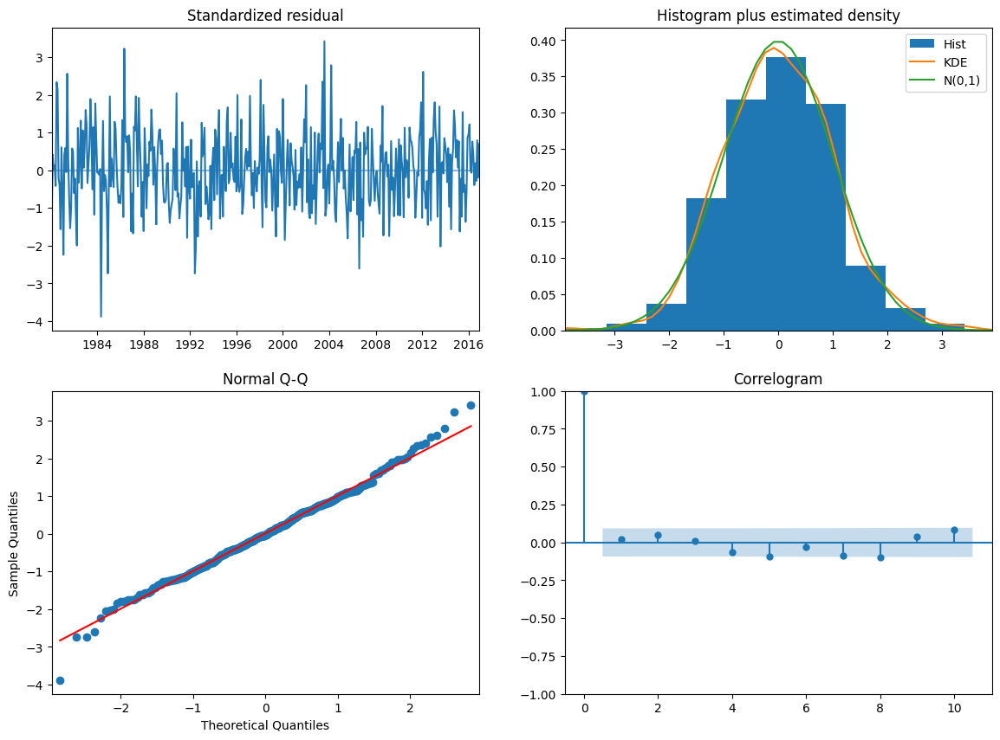

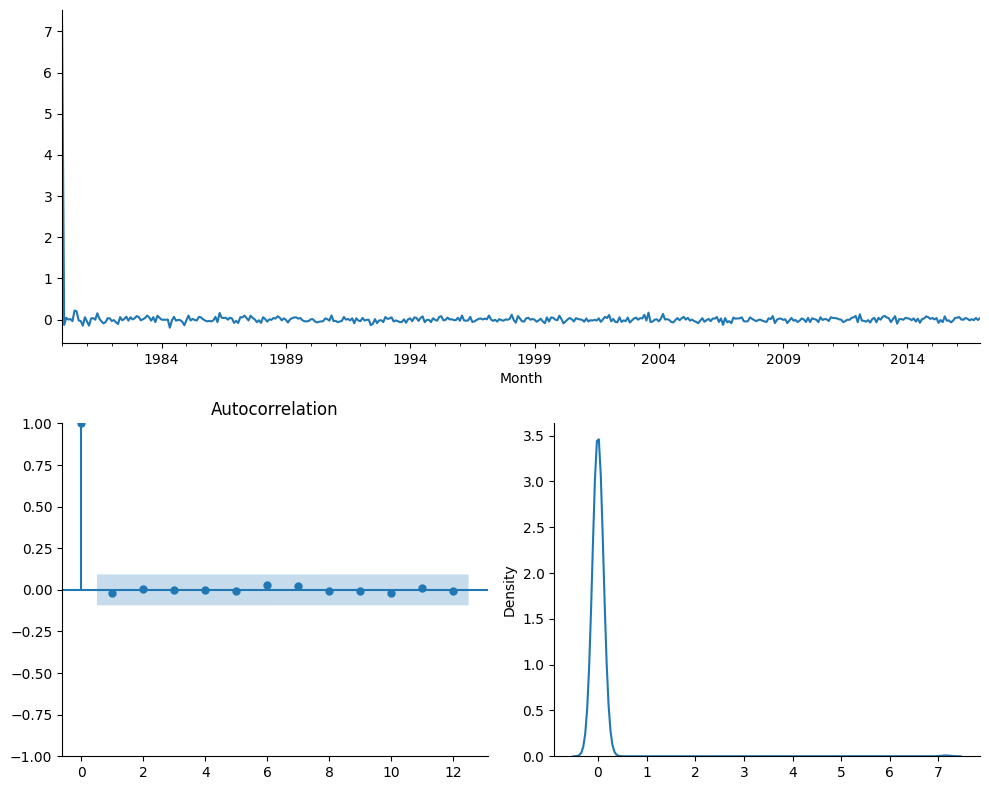

** Mean of the residuals:  0.02

** Ljung Box Test, p-value: 0.969 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel='Month'>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [45]:
eval_model_Aarima(arima_auto_1,defT_tr["Causas externas"],defT_tst["Causas externas"],'Auto Arima')
residcheck(arima_auto_1.resid(),12)

Se obtiene el mismo valor de la rimer auto _arima cambiando d=None por d=1.

In [42]:
import pmdarima as pm

# Ajustamos modelo arima step-wise con métrica AIC para la serie de vuelos
arima_auto_2 = pm.auto_arima(defT_tr["Causas externas"], start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None, 
                      D=1, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima_auto_2.summary())
#se deja libertad a las d para ser calculadas
#p a 5 no estaria bien visto 

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=-1348.091, Time=4.53 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=-1093.713, Time=0.14 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=-1206.381, Time=0.90 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=-1175.159, Time=1.15 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=-1095.693, Time=0.10 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=-1354.092, Time=2.63 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=-1172.486, Time=0.56 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=-1346.513, Time=6.65 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=-1284.869, Time=2.97 sec
 ARIMA(1,0,1)(1,1,2)[12] intercept   : AIC=-1342.625, Time=4.94 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=-1250.284, Time=1.20 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AIC=-1350.069, Time=3.65 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=-1350.682, Time=3.69 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=-1120.748, Time=0.64 sec
 ARIM

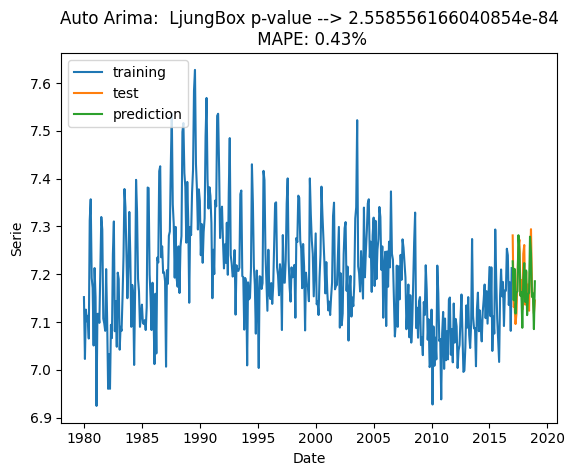

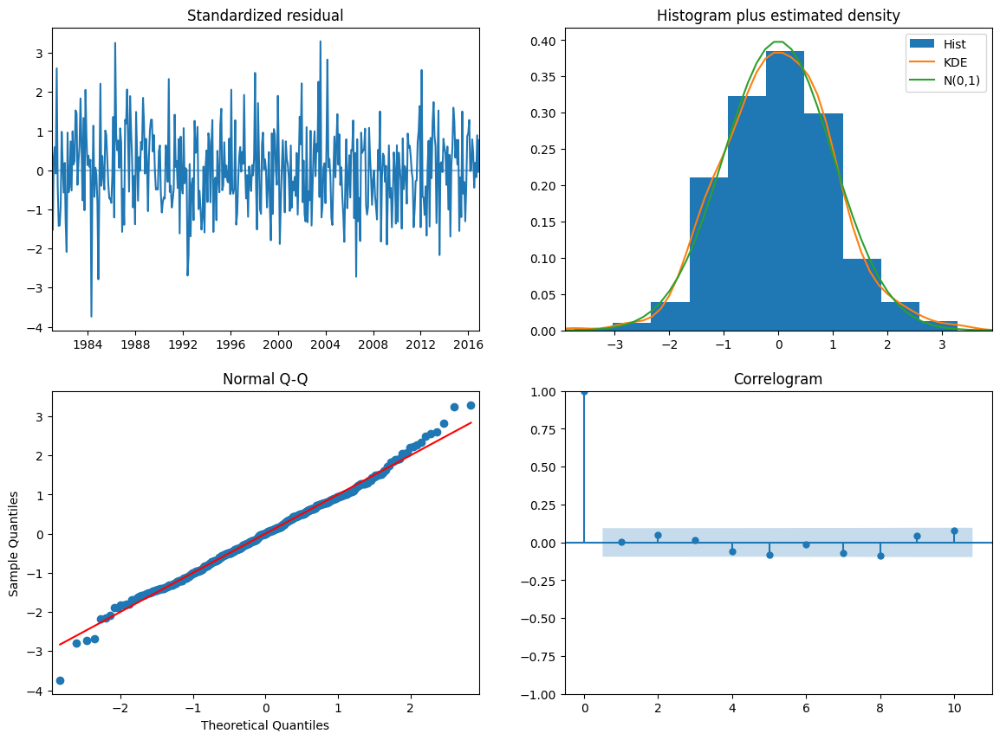

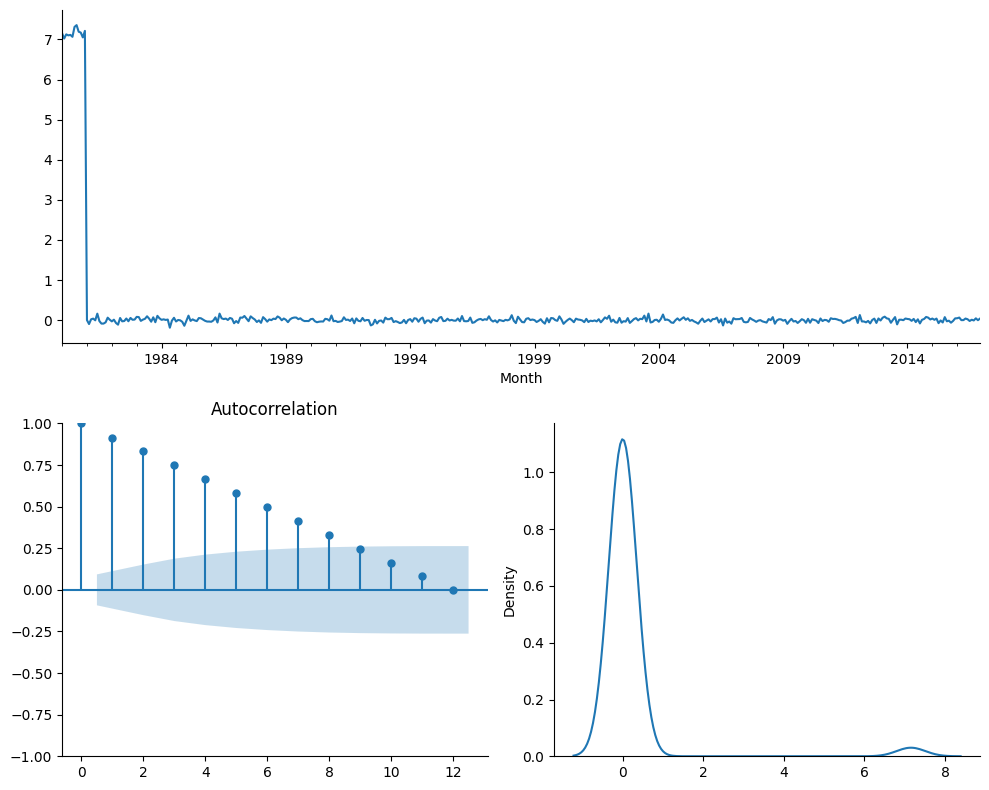

** Mean of the residuals:  0.19

** Ljung Box Test, p-value: 0.0 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel='Month'>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [43]:
eval_model_Aarima(arima_auto_2,defT_tr["Causas externas"],defT_tst["Causas externas"],'Auto Arima')
residcheck(arima_auto_2.resid(),12)

Se obtiene mayor autocorrelación.

## 5- Comparación. En relación al MAPE en el conjunto de tets, ¿Qué modelo resulta más preciso en sus predicciones?


En resumen, a los modelos anteriormente observados se tienen los soguientes resultados:

* Modelo de suavizado simple (ses): obtuvo un valor de MAPE de 0.69% y un p-valor de 1.7
* Modelo de suavizado doble de Holt (holt): obtuvo un valor de MAPE de 0.7% y un p-valor de 0.004
* Modelo de **suavizado Holt Winters Aditivo (hw_add):** obtuvo un valor de **MAPE de 0.39%** y un p-valor de 0.052
* Modelo Arima1 (arima_1): Se tiene un MAPE de 0.43% y un p-valor de 0.878 en la autocorrelación observamos un pico en el mes 12.
* Modelo Arima2 (arima_2): Se tiene un MAPE de 0.61% y un p-valor de 0.873 en la autocorrelación observamos un pico en el mes 12.
* Modelo Arima3 (arima_3): Se tiene un MAPE de 0.42% y un p-valor de 0.877 en la autocorrelación observamos un pico en el mes 12.
* Modelo Arima (arima_auto): Se tiene un MAPE de 0.43% y un p-valor de 0.968 no hay autocorrelación.
* Modelo Arima (arima_auto_1): Se tiene un MAPE de 0.43% y un p-valor de 0.968 no hay autocorrelación.
* Modelo Arima (arima_auto_2): Se tiene un MAPE de 0.43% y un p-valor de 2.558 no hay autocorrelación.

El modelo el cual genero un resultado **más preciso con respecto al MAPE fue el modelo de Holt Winters Aditivo**, por lo tanto, nuestras predicciones pueden ser más precisas aunque su autocorrelación no fue la mejor ya que obtuvimos una correlación mejor en el modelo arima_auto.

Se debide realizar la particion con una serie aplicando el log por que los valores de MAPE son mejores.


# Ejercicio 3

Con los datos de wisconsin.xlsx que se encuentran en la carpeta Datos de la 
documentación. 

In [108]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.express as px

#PCA
from sklearn.preprocessing import StandardScaler, scale
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA

#Factor Analysis
from sklearn.decomposition import FactorAnalysis
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

#Encoding
from sklearn.preprocessing import LabelEncoder

exec(open(r'C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\NuestrasFunciones.py').read())

#quitar errores
import warnings
warnings.filterwarnings('ignore')

## 1- Leer el archivo

In [109]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Lectura de datos
wisconsin = pd.read_excel(r"C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Datos\wisconsin.xlsx")
wisconsin.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [110]:
# Información del dataset
wisconsin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

No se observa ningun valor faltante, tenemos 32 columnas y 569 filas.

In [111]:
# Número de valores distintos por variable
wisconsin.nunique()

id                         569
diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: i

Aquí se observa principalmente la variable diagnosis ya que será nuestra variable objetivo categoría la cual predicaremos. por lo tanto necesitamos que tenga los valores adecuados, como solo puede ser bueno o mala entonces nunique() contara solo 2 valores.

In [112]:
wisconsin.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Solo se observa que el valor mínimo no sea menor ya que estamos trabajando con unidades de medidas de área por lo tanto estamos hablando de un espacio y ningún espacio (área, perímetro, concavidad.. entre otras) puede ser negativo.

In [113]:
VarObjCat = wisconsin["diagnosis"]
id = wisconsin["id"]

Se elimina la variable id ya que solo es un identificador t no aportara nada en nuestro modelo, además separamos la variable que se va a predecir ósea nuestra variable objetivo categórica que toma el valor de VarObjCat

In [114]:
# Eliminar variable objetivo continua 
impute = wisconsin.drop(["diagnosis"],axis=1)
imput = impute.drop(["id"],axis=1)
imput.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              569 non-null    float64
 1   texture_mean             569 non-null    float64
 2   perimeter_mean           569 non-null    float64
 3   area_mean                569 non-null    float64
 4   smoothness_mean          569 non-null    float64
 5   compactness_mean         569 non-null    float64
 6   concavity_mean           569 non-null    float64
 7   concave points_mean      569 non-null    float64
 8   symmetry_mean            569 non-null    float64
 9   fractal_dimension_mean   569 non-null    float64
 10  radius_se                569 non-null    float64
 11  texture_se               569 non-null    float64
 12  perimeter_se             569 non-null    float64
 13  area_se                  569 non-null    float64
 14  smoothness_se            5

## 2- Obtener la matriz de correlaciones entre las variables numéricas. Conclusiones.


Antes de realizar cualquier tipo de análisis de reducción de dimensiones, es conveniente estudiar la adecuación muestral de los datos en cuanto a la estructura de correlación global de las variables. La idea fundamental es que si no existe una estructura de varianzas compartidas entre las variables, las direcciones en el espacio entre las mismas serán más bien ortogonales y, por tanto, no hay componente en el mundo que pueda situarse correctamente para captar información de varias variables... El PCA o el FA están abocados al fracaso. 

1. **Matriz de correlaciones entre las variables**. Nos interesa siempre bien de color o, lo que es lo mismo, valores de correlación altos ya que eso es síntoma de estructura de varianzas compartidas y nos viene bien para captar esa varianza común con una buena componente situada correctamente. 

In [115]:
corr = imput.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000,0.324,0.998,0.987,0.171,0.506,0.677,0.823,0.148,-0.312,0.679,-0.097,0.674,0.736,-0.223,0.206,0.194,0.376,-0.104,-0.043,0.970,0.297,0.965,0.941,0.120,0.413,0.527,0.744,0.164,0.007
texture_mean,0.324,1.000,0.330,0.321,-0.023,0.237,0.302,0.293,0.071,-0.076,0.276,0.386,0.282,0.260,0.007,0.192,0.143,0.164,0.009,0.054,0.353,0.912,0.358,0.344,0.078,0.278,0.301,0.295,0.105,0.119
perimeter_mean,0.998,0.330,1.000,0.987,0.207,0.557,0.716,0.851,0.183,-0.261,0.692,-0.087,0.693,0.745,-0.203,0.251,0.228,0.407,-0.082,-0.006,0.969,0.303,0.970,0.942,0.151,0.456,0.564,0.771,0.189,0.051
area_mean,0.987,0.321,0.987,1.000,0.177,0.499,0.686,0.823,0.151,-0.283,0.733,-0.066,0.727,0.800,-0.167,0.213,0.208,0.372,-0.072,-0.020,0.963,0.287,0.959,0.959,0.124,0.390,0.513,0.722,0.144,0.004
smoothness_mean,0.171,-0.023,0.207,0.177,1.000,0.659,0.522,0.554,0.558,0.585,0.301,0.068,0.296,0.247,0.332,0.319,0.248,0.381,0.201,0.284,0.213,0.036,0.239,0.207,0.805,0.472,0.435,0.503,0.394,0.499
compactness_mean,0.506,0.237,0.557,0.499,0.659,1.000,0.883,0.831,0.603,0.565,0.497,0.046,0.549,0.456,0.135,0.739,0.571,0.642,0.230,0.507,0.535,0.248,0.590,0.510,0.566,0.866,0.816,0.816,0.510,0.687
concavity_mean,0.677,0.302,0.716,0.686,0.522,0.883,1.000,0.921,0.501,0.337,0.632,0.076,0.660,0.617,0.099,0.670,0.691,0.683,0.178,0.449,0.688,0.300,0.730,0.676,0.449,0.755,0.884,0.861,0.409,0.515
concave points_mean,0.823,0.293,0.851,0.823,0.554,0.831,0.921,1.000,0.462,0.167,0.698,0.021,0.711,0.690,0.028,0.490,0.439,0.616,0.095,0.258,0.830,0.293,0.856,0.810,0.453,0.667,0.752,0.910,0.376,0.369
symmetry_mean,0.148,0.071,0.183,0.151,0.558,0.603,0.501,0.462,1.000,0.480,0.303,0.128,0.314,0.224,0.187,0.422,0.343,0.393,0.449,0.332,0.186,0.091,0.219,0.177,0.427,0.473,0.434,0.430,0.700,0.438
fractal_dimension_mean,-0.312,-0.076,-0.261,-0.283,0.585,0.565,0.337,0.167,0.480,1.000,0.000,0.164,0.040,-0.090,0.402,0.560,0.447,0.341,0.345,0.688,-0.254,-0.051,-0.205,-0.232,0.505,0.459,0.346,0.175,0.334,0.767


Definimos la matriz de correlación para las variables en la que pintamos azul para para las correlaciones negativas y rojo para las correlaciones positivas, entre más grises sean menor correlación tendrán entonces observamos en nuestro grafico de correlación que las variables con menos correlación van a ser:
* compactness_mean
* fractal_dimension_mean
* smoothness_se
* compactness_worst

Vemos alta correlación casi en todas las variables, exceptuando las mencionadas anteriormente.
pero como no se puede saber a ciencia cierta, se debe comparar la matriz de correlación con una matriz de identidad por esta razón se debe realizar  el test de Bartlett que las compara y nos da un estadístico y un p-valor.


## 3- Sabiendo que se trata de predecir la variable binaria diagnosis (‘M,’B’). ¿Cuálsería el modelo adecuado de predicción? ¿Qué problemas auguras a la luz de la información sobre las correlaciones del archivo?

El modelo más adecuado para predecirla sería un modelo supervisado ya que tenemos una variable objetivo, dentro de los modelos supervisado podemos utilizar el logístico ya que tenemos una variable objetivo de tipo categórica, en la que el diagnostico puede ser bueno o malo. por lo tanto, tendremos que predecir esta variable para así tomar una decisión. Entre mayor correlación entre las variables más duro será predecir nuestra variable objetivo ya que tenemos muchos factores (variables) que pueden afectar a la probabilidad de que nuestra variable binaria de diagnosis tenga un valor bueno o tenga un valor malo. Además, uno de los problemas que se observa a la hora de realizar la matriz de correlación es que tenemos variables con un nivel de escala espacial mucho mayor que otras por lo tanto, esto puede llevar a que las escalas con mayor medida tengan un mayor peso en la solución. En base a la premisa anterior se debería realizar un escalado de datos para no tener estas diferencias.    

## 4- Como posible estrategia se plantea la realización de un ACP para la reducción de dimensiones y un modelo de predicción adecuado utilizando comopredictores las componentes principales resultantes de tal forma que se retenga al menos el 70% de la variabilidad del archivo. 

### a. Valora la adecuación muestral a priori

**Test de esferidad de Bartlett**. Compara la matriz de correlaciones con una matriz identidad para extraer un p-valor. La hipótesis nula del contraste es **H0: Matriz de correlaciones = Matriz identidad**, por lo que nos interesa rechazarla! Recordemos que una matriz identidad tiene componentes absolutamente ortogonales, ósea 0 correlación o varianza compartida. 

In [116]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
calculate_bartlett_sphericity(imput)

(39362.120841132666, 0.0)

Valor del estadístico de contraste muy alto 39362 y p-valor muy pequeño --> Rechazo claro de la hipótesis nula que nos dice que la matriz observada es igual a la matriz identidad entonces una matriz identidad tiene todas sus componentes ortogonales con lo cual la hipótesis nula es que no existe nada de correlación y la hipótesis alternativa es tengo que rechazar la hipótesis nula es decir existe correlación.
Con esto se entiende que la matriz de correlación no es 1 y números alrededor de uno sino números muy grandes con correlaciones muy altas.


3. **KMO-MSA global y por variable**. Índice de adecuación muestral o de Kaiser-Meyer-Olkin para comparar la correlación observada entre pares de variables y sus correspondientes correlaciones parciales (una vez eliminado el efecto de otras variables presentes). Buscamos valores superiores a 0.5 y cuanto más cercanos a 1, mejor. 

In [117]:
from factor_analyzer.factor_analyzer import calculate_kmo
calculate_kmo(imput)


(array([0.83463512, 0.64352613, 0.85334054, 0.86403253, 0.814716  ,
        0.87939755, 0.89192843, 0.90027723, 0.82510264, 0.83181381,
        0.83412178, 0.48458942, 0.84290718, 0.85199881, 0.64427854,
        0.8712978 , 0.82547994, 0.83516673, 0.5832182 , 0.81149623,
        0.82308704, 0.60329755, 0.88493799, 0.82044529, 0.75316064,
        0.85127714, 0.90222587, 0.89105242, 0.69074764, 0.81233969]),
 0.832225309468944)

Cuanto mayor es el kmo mejor funcionará el modelo, entonces según la premisa anterior el kmo va a contrastar las correlaciones entre variables de nuestro dataset. Frente a esto compararemos el KMO global con cada variable para decidir cual variable podremos sacar del análisis para ganar un poco de adecuación muestral general.
La idea no es quitar todas las variables que sean inferior a el KMO general. la gracia es quitar los valores para que todos suban a un 0.7 para tener un mejor kmo entre todas. Por lo tanto tendremos que quitar el valor de 0.48 ya que este está por debajo del límite de aceptación según la premisa inicial que nos decía que debe estar entre 0.5-1.



In [118]:
imput.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


La columan número 12 con el valor de 0.48 es texture_se

In [119]:
imput1 = imput.drop(['texture_se'], axis=1)
calculate_kmo(imput1)

(array([0.83383775, 0.71380996, 0.85236309, 0.86613237, 0.8119036 ,
        0.87978917, 0.89148028, 0.8989748 , 0.83287842, 0.83044023,
        0.83272641, 0.83872779, 0.85713086, 0.61630817, 0.87022696,
        0.82281541, 0.83113907, 0.58402361, 0.80709036, 0.82286537,
        0.71827893, 0.88349999, 0.82210308, 0.75028776, 0.85248406,
        0.90181629, 0.88817103, 0.70426333, 0.81112789]),
 0.8398097573866294)

In [120]:
imput1.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [121]:
imput2 = imput1.drop(['symmetry_se'], axis=1)
calculate_kmo(imput2)

(array([0.8329125 , 0.71267734, 0.8518427 , 0.86865135, 0.82327468,
        0.87822126, 0.89124341, 0.89874908, 0.85455359, 0.821995  ,
        0.82836718, 0.83977772, 0.86950018, 0.62788835, 0.86379837,
        0.81981466, 0.82628775, 0.79942192, 0.82158036, 0.71613705,
        0.88449638, 0.82831369, 0.76386015, 0.85064227, 0.90160359,
        0.88457217, 0.82825502, 0.80618913]),
 0.846257522700699)

La variable 'texture_se' y 'symmetry_se' tiene un msa muy bajo por lo que nos planteamos si eliminarla del análisis para ganar estructura compartida.

#### Escalado de datos

Unidades de medida distintas implican necesidad de escalar los datos para que las variables con mayor escala de medida no "pesen" más de lo que deben en la solución. 

In [122]:
scaler = StandardScaler()
scaler.fit(imput)
X = scaler.transform(imput)
pd.DataFrame(X, columns=imput.columns)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,2.489734,-0.565265,2.833031,2.487578,-0.214002,1.316862,0.724026,0.660820,1.148757,0.907083,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,0.499255,-0.876244,0.263327,0.742402,-0.605351,-0.692926,-0.440780,0.260162,-0.805450,-0.099444,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,1.228676,-0.780083,0.850928,1.181336,-0.297005,0.814974,0.213076,1.424827,0.237036,0.293559,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,0.326373,-0.110409,0.286593,-0.288378,0.689702,2.744280,0.819518,1.115007,4.732680,2.047511,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,1.270543,-0.790244,1.273189,1.190357,1.483067,-0.048520,0.828471,1.144205,-0.361092,0.499328,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100
5,-0.476375,-0.835335,-0.387148,-0.505650,2.237421,1.244335,0.866302,0.824656,1.005402,1.890005,-0.255070,-0.592662,-0.321304,-0.289258,0.156347,0.445544,0.160025,-0.069124,0.134119,0.486846,-0.165498,-0.313836,-0.115009,-0.244320,2.048513,1.721616,1.263243,0.905888,1.754069,2.241802
6,1.170908,0.160649,1.138125,1.095295,-0.123136,0.088295,0.300072,0.646935,-0.064325,-0.762332,0.149883,-0.804940,0.155410,0.298627,-0.909030,-0.651568,-0.310141,-0.228089,-0.829666,-0.611218,1.368983,0.322883,1.368325,1.275220,0.518640,0.021215,0.509552,1.196716,0.262476,-0.014730
7,-0.118517,0.358450,-0.072867,-0.218965,1.604049,1.140102,0.061026,0.281950,1.403355,1.660353,0.643623,0.290561,0.490051,0.233722,0.588031,0.268933,-0.232554,0.435349,-0.688004,0.611669,0.163763,0.401048,0.099449,0.028859,1.447961,0.724786,-0.021054,0.624196,0.477640,1.726435
8,-0.320167,0.588830,-0.184080,-0.384207,2.201839,1.684010,1.219096,1.150692,1.965600,1.572462,-0.356850,-0.389818,-0.227743,-0.352403,-0.436677,0.533290,0.120568,0.075243,0.107482,-0.017363,-0.161357,0.822813,-0.031609,-0.248363,1.662757,1.818310,1.280035,1.391616,2.389857,1.288650
9,-0.473535,1.105439,-0.329482,-0.509063,1.582699,2.563358,1.738872,0.941760,0.797298,2.783096,-0.388250,0.693345,-0.409420,-0.360764,0.036008,2.609587,1.509848,0.409395,-0.321136,2.377346,-0.244190,2.443109,-0.286278,-0.297409,2.320295,5.112877,3.995433,1.620015,2.370444,6.846856


Lo que hacemos en el escalado de datos es pasar de unidades de medidas comparables, lo que realiza es restar cada dato de la media y dividirlo por la desviación típica de tal manera que la distribución resultante está centrada en 0 (media 0) y desviación típica 1.

Hay que realizar el escalado de medidas que es la descomposición en valores singulares de la matriz de correlación, como nos basamos en distancias de los registros en el espacio, es necesario el escalado de los datos. 




### b. Realiza el PCA sobre las numéricas. ¿Cuántas componentes se deberían considerar para cumplir el criterio mencionado? Interpreta la componente 1.

#### Análisis de Componentes Principales (PCA)

Recurrimos a la función PCA de sklearn para obtener la descomposición en valores singulares y el resultado de componentes para los datos. 

In [123]:
#! esta de primero pero lo obvie
pca = PCA() #n_components=0.70
scores = pca.fit_transform(X)
pca_scores = pd.DataFrame(data= scores, 
                          columns = ['PC 1', 'PC 2','PC 3', 'PC 4','PC 5','PC 6','PC 7','PC 8', "PC 9", "PC 10",
                                     'PC 11', 'PC 12','PC 13', 'PC 14','PC 15','PC 16','PC 17','PC 18', "PC 19", "PC 20",
                                     'PC 21', 'PC 22','PC 23', 'PC 24','PC 25','PC 26','PC 27','PC 28', "PC 29", "PC 30"]) # columns=["PC1", "PC2", "PC3"]

Definir-Ajustar-Transformar
X=Datos escalados

Ponemos los datos escalados para analizar las variables, los scores son los registros originales frente a las componentes.

**Visualización con paquete *psynlig***

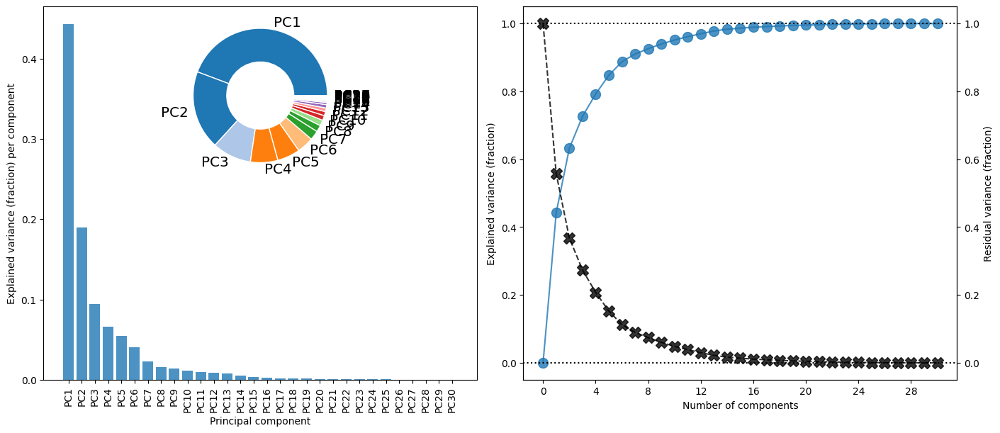

In [124]:
from psynlig import pca_scree
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from psynlig import (
    pca_explained_variance,
    pca_residual_variance,
    pca_explained_variance_bar,
    pca_explained_variance_pie,
    pca_1d_loadings,
    pca_2d_loadings,
    pca_2d_scores
)

fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, figsize=(14, 6), constrained_layout=True
)
pca_explained_variance_bar(pca, axi=ax1, alpha=0.8)
pca_explained_variance(pca, axi=ax2, marker='o', markersize=10, alpha=0.8)
ax4 = ax2.twinx()
pca_residual_variance(
    pca,
    ax4,
    marker='X',
    markersize=12,
    alpha=0.8,
    color='black',
    linestyle='--'
)
ax3 = inset_axes(ax1, width='45%', height='45%', loc=9)
pca_explained_variance_pie(pca, axi=ax3, cmap='tab20')
plt.show()


En el siguiente grafico podemos observar:
* Según el **pie-chart** la componente 1 es la que más explica.
* En el **scree-plot** hecho con barras **(grafico de sedimentación)** vemos que el autovalor va decreciendo con la componente, el mayor cambio de ángulo se ve en la componente 3.
* El **porcentaje de variabilidad explicada acomulada** es la que va subiendo (grafico con puntos) y con la **varianza residual** que va bajando (grafico con x). con **tres** componentes ya tengo más del 70% de la variabilidad explicada. 


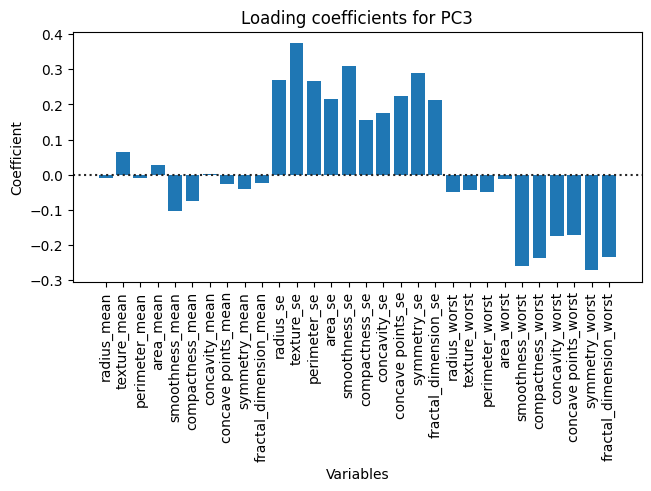

In [125]:
pca_1d_loadings(
        pca,
        imput.columns,
        select_components={3},
        plot_type='bar',
    )
plt.show()

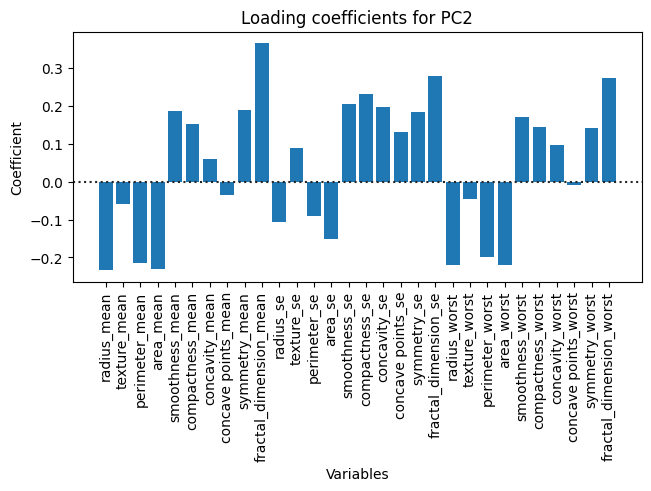

In [126]:
pca_1d_loadings(
        pca,
        imput.columns,
        select_components={2},
        plot_type='bar',
    )
plt.show()

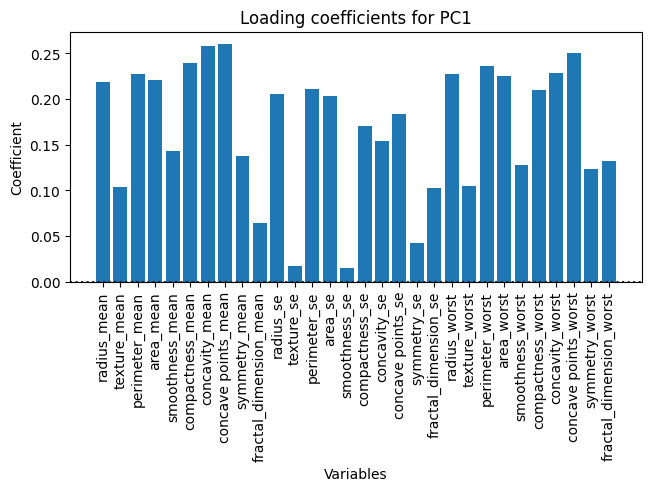

In [127]:
pca_1d_loadings(
        pca,
        imput.columns,
        select_components={1},
        plot_type='bar',
    )
plt.show()

Pero podemos analizar las cargas que describen la importancia de las variables independientes. Las cargas son desde un punto de vista numérico, iguales a los coeficientes de las variables, y brindan información sobre qué variables dan la mayor contribución a los componentes.

Visualizamos las cargas que son como se asocia cada variable original a cada componente, al observar nuestro **componente 1** vemos que explica lo máximo de cada variable si la comparamos con otras componentes.

Las **variables menos explicadas** por la componente 1 son **texture_se, smoothness_se, fractal_dimension_se y fractal_dimension_mean**. 


#### Diagrama de sedimentación

[pca] >Processing dataframe..
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [70.0%] explained variance using the [30] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [70.00%] explained variance.
[pca] >The PCA reduction is performed on the [30] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


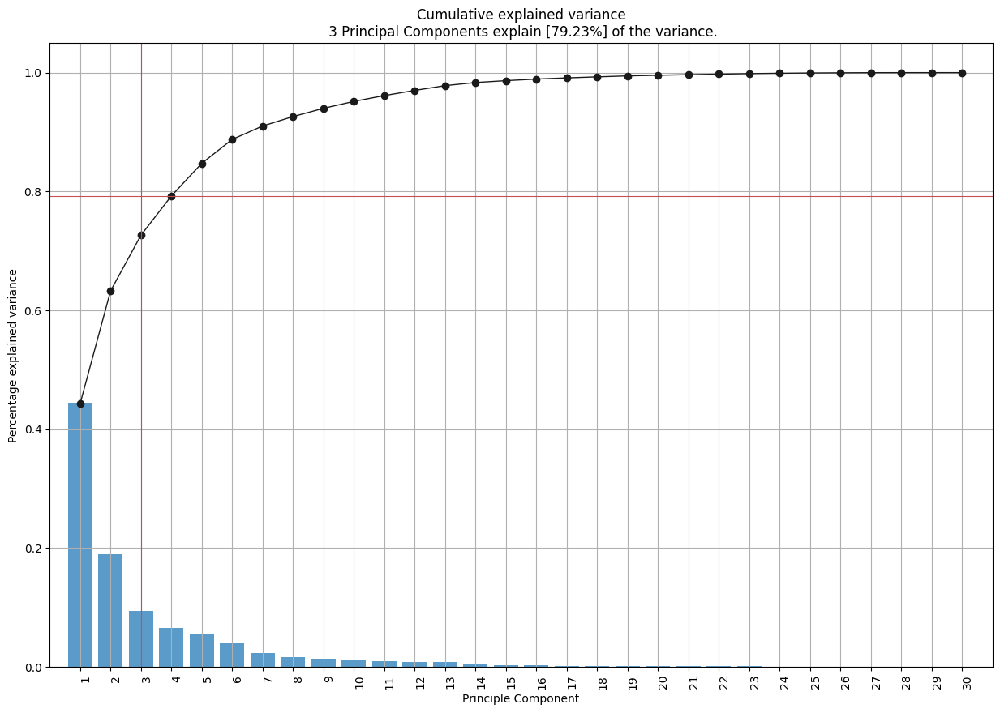

(<Figure size 1500x1000 with 1 Axes>,
 <AxesSubplot: title={'center': 'Cumulative explained variance\n 3 Principal Components explain [79.23%] of the variance.'}, xlabel='Principle Component', ylabel='Percentage explained variance'>)

<Figure size 640x480 with 0 Axes>

In [128]:
# Load library
from pca import pca

# Initialize pca with default parameters
model = pca(normalize=True, n_components=0.7)

# Fit transform
results = model.fit_transform(imput)

# Plot the explained variance
model.plot()



Después del ajuste y la transformación, podemos generar las funciones de mayor rendimiento que se almacenan en la clave " topfeat ". Aquí vemos qué variables contribuyen más a qué PC. Con el gráfico de pantalla, podemos examinar la varianza que se captura en las PC. 
* En el **grafico de sub-plots** podemos ver la primera componente explica el 44.2% de la varianza observada en los datos, en la segunda un 18.9% y en la tercera un 16.13%. De aquí en adelante las componentes van disminuyendo en % de varianza explicada.
* Si se empleasen únicamente las tres primeras componentes se conseguiría explicar el 79.23% de la varianza observada.


In [129]:
model.results

{'loadings':      radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
 PC1     0.218902      0.103725        0.227537   0.220995         0.142590   
 PC2    -0.233857     -0.059706       -0.215181  -0.231077         0.186113   
 PC3    -0.008531      0.064550       -0.009314   0.028700        -0.104292   
 
      compactness_mean  concavity_mean  concave points_mean  symmetry_mean  \
 PC1          0.239285        0.258400             0.260854       0.138167   
 PC2          0.151892        0.060165            -0.034767       0.190349   
 PC3         -0.074091        0.002734            -0.025564      -0.040240   
 
      fractal_dimension_mean  radius_se  texture_se  perimeter_se   area_se  \
 PC1                0.064363   0.205979    0.017428      0.211326  0.202870   
 PC2                0.366575  -0.105552    0.089980     -0.089457 -0.152293   
 PC3               -0.022574   0.268481    0.374634      0.266645  0.216007   
 
      smoothness_se  compactness_se  c

Si hacemos el biplot y coloreamos las tres clases, podemos notar directamente que las primeras 2 PC explican bastante bien un gran porcentaje del dataset sin embargo solo con dos no llegamos a explicar el 70%. El **primer PC capta el 44,2%** de la variación y el **segundo PC el 18,9%** y el **tercer PC el 16,13%**, Las cargas ahora nos ayudarán a examinar más profundamente cómo las variables contribuyen a las PC y cómo se separan las clases. 

* La característica que más contribuye al **eje x**, y por lo tanto para **PC1**, son **concave points_mean**, **concavity_mean**, **concave points_worst**, **compactness_mean**, **perimeter_worst** y **concavity_worst** en general **esta variable explica casi todas las variables** cabe aclarar que las variables **anteriormente mencionadas* van a tener más peso en nuestro modelo** que realicemos luego si PC1 tiene peso en el modelo.
* Para **PC2 (el eje y)**, el mayor contribuyente es la variable fractal_dimension_mean, fractal_dimension_se, fractal_dimension_worst radius_mean y compactness_se. 
* Para **PC3 (el eje z)**, los primeros 5 mejores contribuyentes son **texture_se**, **smoothness_se**, **symmetry_se**, **symmetry_worst** y **radius_se**.
* Las características con un ángulo más amplio, como **fractal_dimension_se**, **compactness_se**, **symetry_mean**, entre otras **contribuyen en parte a PC1, PC2 y PC3** lo que quiere decir que son explicadas no solo por una componente, sino que **son influenciadas por varias componentes**.


In [130]:
model1 = model.results["loadings"]
model1

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
PC1,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,0.205979,0.017428,0.211326,0.202870,0.014531,0.170393,0.153590,0.183417,0.042498,0.102568,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
PC2,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034767,0.190349,0.366575,-0.105552,0.089980,-0.089457,-0.152293,0.204430,0.232716,0.197207,0.130322,0.183848,0.280092,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339
PC3,-0.008531,0.064550,-0.009314,0.028700,-0.104292,-0.074091,0.002734,-0.025564,-0.040240,-0.022574,0.268481,0.374634,0.266645,0.216007,0.308839,0.154780,0.176464,0.224657,0.288584,0.211504,-0.047507,-0.042298,-0.048547,-0.011902,-0.259798,-0.236076,-0.173057,-0.170344,-0.271313,-0.232791


#### grafico de scores

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [569] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [569] unique colors! Available unique colors: [9].


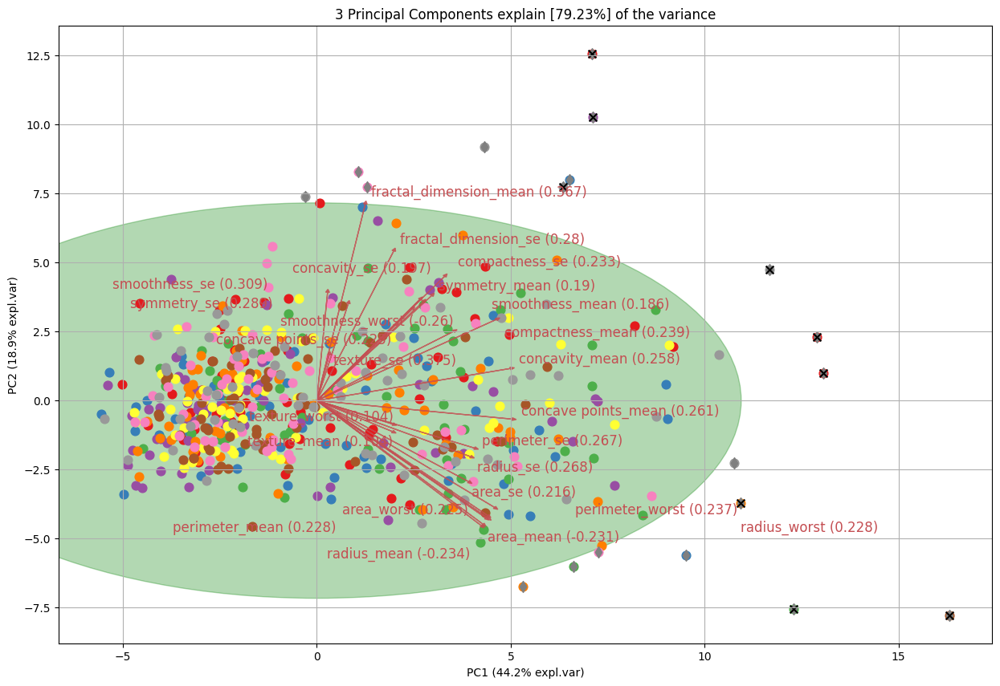

In [131]:
# 2d plot
ax = model.biplot(legend=False, label=False, SPE=True, hotellingt2=True)

En el grafico podemos observar que no hay una cantidad significativa de outliers que son los registros fuera del rango con marcas de x, se observa también que los datos tienen diversas agrupaciones por colores, pero esto puntos de los registros no nos permiten distinguir bien los vectores explicados por PC1 y PC2 por lo tanto, los eliminaremos.

[pca] >Plot PC1 vs PC2 with loadings.


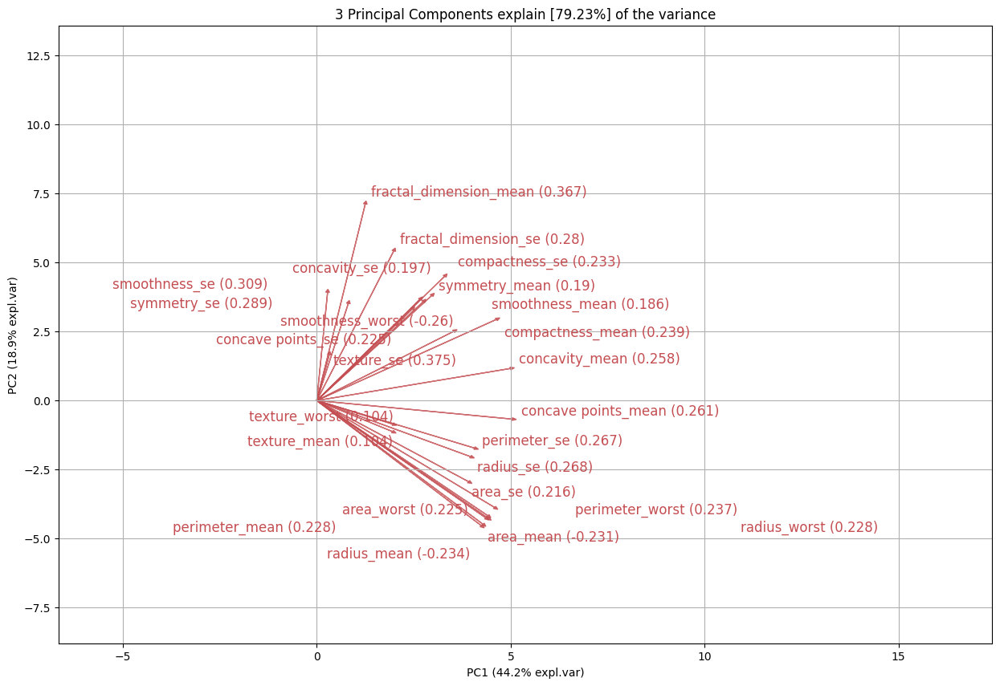

In [132]:
# 2d plot
ax = model.biplot(legend=False, label=False, cmap=None)

Como habíamos hablado anteriormente, vemos que entre más pequeño sea una variable en el PC2 vemos que la variable es mejor explicada por PC1 en nuestro caso concavity_mean y concave points_mean. Si realizamos el mismo análisis anterior pero en este caso la variable va a ser más pequeña en PC1 y con mayor cantidad en PC2 decimos que es mejor explicada por esta como fractal_dimension_mean, por otro lado las variables que tienen en mayor cantidad sus ejes x-y vemos que son explicada por las dos variables (ángulo más amplio) en este caso radius_worst.  

Debido a que se ya se ha analizado afondo las variables con los PC, se volverá a sacar la matriz de los score explicando el 70% las variables:

In [133]:
scaler = StandardScaler()
scaler.fit(imput)
X = scaler.transform(imput)
#! esta de primero pero lo obvie
pca = PCA(n_components=0.70)
scores = pca.fit_transform(X)
pca_scores = pd.DataFrame(data= scores, 
                          columns = ['PC1', 'PC2','PC3']) # columns=["PC1", "PC2", "PC3"]
pca_scores.head()

,PC1,PC2,PC3
0,9.192837,1.948583,-1.123166
1,2.387802,-3.768172,-0.529293
2,5.733896,-1.075174,-0.551748
3,7.122953,10.275589,-3.232790
4,3.935302,-1.948072,1.389767


Como ya se ha realizado todo el análisis anterior, ahora si podemos realizar el PCA de n_componentes = 0.7, en el cual obtendremos la matriz de puntuaciones o score **que va a ser con la que realizaremos nuestro modelo.**

### c. Crea el input con estas componentes (matriz de scores o puntuaciones) y ajusta un modelo de predicción adecuado para la variable objetivo diagnosis.

In [134]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score


In [135]:
wisconsin['diagnosis'] = wisconsin['diagnosis'].map({'M':1,'B':0})
wisconsin['diagnosis']
varObjcat = wisconsin['diagnosis']
varObjcat.head()

0    1
1    1
2    1
3    1
4    1
Name: diagnosis, dtype: int64

Se realiza un cambio en los valores de M por 1 y B por 0 para poder predecir esta variable ya que si no realizamos el cambio de la variable objetivo categórica a int cuando realicemos la predicción tendremos problemas.

In [136]:
nuevoData = pd.concat([pca_scores, varObjcat], axis=1)
nuevoData.info()
nuevoData.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PC1        569 non-null    float64
 1   PC2        569 non-null    float64
 2   PC3        569 non-null    float64
 3   diagnosis  569 non-null    int64  
dtypes: float64(3), int64(1)
memory usage: 17.9 KB


,PC1,PC2,PC3,diagnosis
0,9.192837,1.948583,-1.123166,1
1,2.387802,-3.768172,-0.529293,1
2,5.733896,-1.075174,-0.551748,1
3,7.122953,10.275589,-3.232790,1
4,3.935302,-1.948072,1.389767,1


creamos un nuevo dataset en el que unimos los valores que obtuvimos de PC que explican el 70% de nuestras variables y los valores de la variable objetivo categórica trasformada para cada registro.

imput1 = nuevoData.drop(["diagnosis"],axis=1)

In [137]:
varObjcat.head()
varObjcat.value_counts(normalize=True)

0    0.627417
1    0.372583
Name: diagnosis, dtype: float64

En este caso, tenemos situación de desbalanceo hacia los 0 ya que la frecuencia a priori de 0 es el 62%. el modelo tendrá mayor dificultad en reconocer a los 1.

In [138]:
# Matriz de predictores
#imput1
# Variable objetivo para la regresión logística
#VarObjCat

# Partición training-test
X_train, X_test, y_train, y_test = train_test_split(pca_scores, varObjcat, test_size=0.20, random_state=42)
print("Training dataset shape:", X_train.shape, y_train.shape)
print("Testing dataset shape:", X_test.shape, y_test.shape)

Training dataset shape: (455, 3) (455,)
Testing dataset shape: (114, 3) (114,)


Como ya se había separado la variable objetivo del dataset, lo único que realizamos es un cambio de variables en el cual la matriz de predictores (nuestro dataset sin la variable objetivo) tendrá el valor de X y la variable objetivo categórica  toma el valor de y, entonces con estos dos valores se realiza la partición training-test.

In [139]:
#unimos el predictor de la variable objetivo con la variable objetivo en el training 
data_train = X_train.join(y_train)
data_train.head()
#aquí se realiza el data train

,PC1,PC2,PC3,diagnosis
68,4.330003,9.202526,1.492963,0
181,9.007166,0.581031,-3.134715,1
63,-2.314132,3.267990,2.796224,0
248,-2.582556,0.729213,-0.548143,0
60,-2.385836,2.757658,1.214086,0


Aquí unimos las variables predictoras con la variable objetivo en el training osea ese 80% que sacamos para entrenar.

In [140]:
# Aplicamos a fórmula de modelo completo
form=ols_formula(data_train,'diagnosis')
form
form ='diagnosis ~ PC1 + PC2 + PC3'

In [141]:
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit 

# Ajusto regresión de ejemplo
modeloCompleto = logit(form,data=data_train).fit()
modeloCompleto.summary()

Optimization terminated successfully.
         Current function value: 0.121625
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      451
Method:                           MLE   Df Model:                            3
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.8156
Time:                        00:06:21   Log-Likelihood:                -55.339
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                8.312e-106
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.6741      0.253     -2.662      0.008      -1.170      -0.178
PC1            2.1008      0.295      7.113      0.000       1.522       2.680
PC2           -1.1524      0.206     -5.582      0.000      -1.557      -0.748
PC3           -0.4864      0.145     -3.358      0.001      -0.770      -0.202
==============================================================================

Possibly complete quasi-separation: A fraction 0.22 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Se obtiene un pseudo R^2 de 0.8156, si vemos el contraste general del modelo decimos que, rechazamos la hipótesis nula que nos dice que el modelo es igual a un no modelo. si observamos los p-valor de los intercepto vemos que cumplen todos ya que todos los valores son menores a 5%, se intentará mejorar estos valores, aunque lo que tengamos este muy bien.

In [142]:
tr_tst_eval_log(form,nuevoData)

Accuracy en training:  0.9472527472527472 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[71  0]
 [ 2 41]]
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99        71
         1.0       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114

Area bajo la curva ROC training: 
 0.9888691190466339
Area bajo la curva ROC test: 
 0.9993449066491975


Accurracy Tenemos una taza de aciertos general tenemos un 94.7%, tenemos 0 falsos negativos y 2 falsos positivos. 
* 0: tenemos una sensibilidad (capacidad de reconocer a los 0) muy buena ya que nos dice que es el 1. una precisión de 97%, no se espera un sobre ajuste ya que nuestro accyracy es 0.98.
* 1: tenemos una senilidad () muy buena ya que es 0.95, una precisión de 100%.


In [143]:
form1 = 'diagnosis ~ PC1 + PC2'
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit

# Ajusto regresión de ejemplo
modelo1 = logit(form1,data=data_train).fit()
modelo1.summary()


Optimization terminated successfully.
         Current function value: 0.136485
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      452
Method:                           MLE   Df Model:                            2
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.7931
Time:                        00:06:26   Log-Likelihood:                -62.101
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                4.059e-104
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.4377      0.232     -1.886      0.059      -0.892       0.017
PC1            2.0251      0.266      7.620      0.000       1.504       2.546
PC2           -1.1266      0.179     -6.296      0.000      -1.477      -0.776
==============================================================================

Possibly complete quasi-separation: A fraction 0.19 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [144]:
tr_tst_eval_log(form1,nuevoData)

Accuracy en training:  0.9472527472527472 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[71  0]
 [ 1 42]]
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99        71
         1.0       1.00      0.98      0.99        43

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

Area bajo la curva ROC training: 
 0.987131211983283
Area bajo la curva ROC test: 
 0.998689813298395


In [145]:
form2 ='diagnosis ~ PC1 + PC3'
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit

# Ajusto regresión de ejemplo
modelo2 = logit(form2,data=data_train).fit()
modelo2.summary()

Optimization terminated successfully.
         Current function value: 0.211363
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      452
Method:                           MLE   Df Model:                            2
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.6796
Time:                        00:06:31   Log-Likelihood:                -96.170
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                 2.538e-89
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.8556      0.192     -4.448      0.000      -1.233      -0.479
PC1            1.1178      0.108     10.315      0.000       0.905       1.330
PC3           -0.5510      0.123     -4.486      0.000      -0.792      -0.310
==============================================================================
"""

In [146]:
tr_tst_eval_log(form2,nuevoData)

Accuracy en training:  0.9098901098901099 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[69  2]
 [ 5 38]]
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95        71
         1.0       0.95      0.88      0.92        43

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.93       114
weighted avg       0.94      0.94      0.94       114

Area bajo la curva ROC training: 
 0.9682831960938469
Area bajo la curva ROC test: 
 0.9882083196855551


In [147]:
form3 ='diagnosis ~ PC1*PC3 + PC2'
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit 

# Ajusto regresión de ejemplo
modelo3 = logit(form3,data=data_train).fit()
modelo3.summary()

Optimization terminated successfully.
         Current function value: 0.120005
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      450
Method:                           MLE   Df Model:                            4
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.8181
Time:                        00:06:35   Log-Likelihood:                -54.602
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                5.544e-105
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.5920      0.260     -2.274      0.023      -1.102      -0.082
PC1            2.0803      0.294      7.084      0.000       1.505       2.656
PC3           -0.3555      0.178     -1.993      0.046      -0.705      -0.006
PC1:PC3       -0.0945      0.082     -1.159      0.246      -0.254       0.065
PC2           -1.1292      0.207     -5.460      0.000      -1.535      -0.724
==============================================================================

Possibly complete quasi-separation: A fraction 0.21 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [148]:
tr_tst_eval_log(form3,nuevoData)

Accuracy en training:  0.9472527472527472 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[71  0]
 [ 2 41]]
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99        71
         1.0       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114

Area bajo la curva ROC training: 
 0.9891173914842553
Area bajo la curva ROC test: 
 0.9986898132983951


In [149]:
form4 ='diagnosis ~ PC1 + PC2*PC3'
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit

# Ajusto regresión de ejemplo
modelo4 = logit(form4,data=data_train).fit()
modelo4.summary()

Optimization terminated successfully.
         Current function value: 0.118129
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      450
Method:                           MLE   Df Model:                            4
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.8209
Time:                        00:06:38   Log-Likelihood:                -53.749
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                2.369e-105
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.6376      0.262     -2.437      0.015      -1.151      -0.125
PC1            2.0714      0.295      7.015      0.000       1.493       2.650
PC2           -1.1262      0.212     -5.322      0.000      -1.541      -0.711
PC3           -0.3822      0.170     -2.253      0.024      -0.715      -0.050
PC2:PC3       -0.1112      0.069     -1.612      0.107      -0.246       0.024
==============================================================================

Possibly complete quasi-separation: A fraction 0.23 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [150]:
tr_tst_eval_log(form4,nuevoData)

Accuracy en training:  0.9494505494505494 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[70  1]
 [ 2 41]]
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98        71
         1.0       0.98      0.95      0.96        43

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

Area bajo la curva ROC training: 
 0.9892829064426698
Area bajo la curva ROC test: 
 0.9990173599737963


In [151]:
form5 ='diagnosis ~ PC2*PC1 + PC3'
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit 

# Ajusto regresión de ejemplo
modelo5 = logit(form5,data=data_train).fit()
modelo5.summary()

Optimization terminated successfully.
         Current function value: 0.121575
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      450
Method:                           MLE   Df Model:                            4
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.8157
Time:                        00:06:44   Log-Likelihood:                -55.317
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                1.129e-104
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.7079      0.299     -2.365      0.018      -1.295      -0.121
PC2           -1.1669      0.218     -5.357      0.000      -1.594      -0.740
PC1            2.0981      0.296      7.100      0.000       1.519       2.677
PC2:PC1        0.0107      0.049      0.217      0.828      -0.086       0.107
PC3           -0.4941      0.150     -3.301      0.001      -0.787      -0.201
==============================================================================

Possibly complete quasi-separation: A fraction 0.22 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [152]:
tr_tst_eval_log(form5,nuevoData)

Accuracy en training:  0.9472527472527472 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[71  0]
 [ 2 41]]
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99        71
         1.0       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114

Area bajo la curva ROC training: 
 0.9888691190466338
Area bajo la curva ROC test: 
 0.9993449066491975


Estas pruebas se tendrán en cuenta para el análisis posterior.

### d. Conclusiones del modelo por validación cruzada repetida. Interpreta el parámetro de la componente 1. 

In [153]:
# Creamos lista de fórmulas   
list_form = [form, form1,form3,form4,form5]
#list_form


# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: cross_val_log(x,nuevoData, seed=42),list_form))

Modelo: diagnosis ~ PC1 + PC2 + PC3
AUC: 0.991 (0.006)
Modelo: diagnosis ~ PC1 + PC2
AUC: 0.990 (0.006)
Modelo: diagnosis ~ PC1*PC3 + PC2
AUC: 0.989 (0.007)
Modelo: diagnosis ~ PC1 + PC2*PC3
AUC: 0.990 (0.007)
Modelo: diagnosis ~ PC2*PC1 + PC3
AUC: 0.991 (0.006)


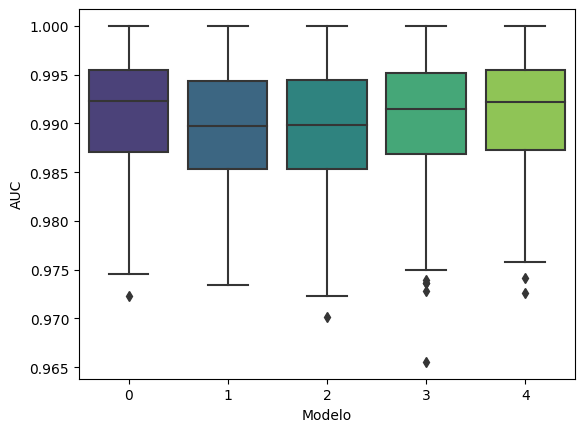

In [154]:
# Transponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','AUC']
results.head()

# Boxplot paralelo para comparar
plt.clf()
sns.boxplot(x='Modelo',y='AUC',data=results,palette='viridis')
plt.show()

Al evaluar los modelos por validación cruzada repetida vemos que el modelo **form= 'diagnosis ~ PC1 + PC2 + PC3'** y **form5= 'diagnosis ~ PC2*PC1 + PC3'** son los que mejor valor de AUC tienen con respecto a los demás. Por lo tanto, tienen igualdad de capacidad predictiva, pero hay tres factores por los que tomamos **form:**
* El primero es que por principio de parsimonia **form** es el más sencillo.
* El segundo es que vemos mayor presencia de outliers en form4 que en form. 
* el tercero es que así lo pongamos a comparar el modelo que tiene la form4 vemos en el summarys del modelo no cumple el p-valor ya que tiene un valor fuera de rango (Más alto del 5%)


<AxesSubplot: ylabel='Density'>

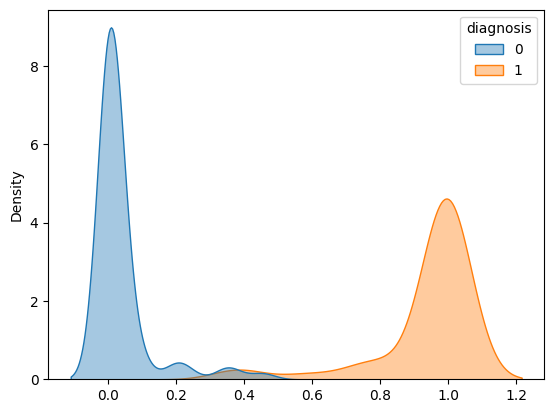

In [155]:
y_pred = modeloCompleto.predict(X_test)
plt.clf()
sns.kdeplot(x=y_pred, hue=y_test, fill=True, common_norm=False, alpha=0.4)

En este grafico presento la capacidad que tiene mi modelo definitivo para a separar 0 de 1, en el cual la probabilidad estimada es muy buena ya que solo entre 0.22 y 0.5 aproximadamente mi modelo tiene una probabilidad baja de estimar tanto 0 como 1 pero la densidad es muy baja.

Como vemos cada pico de densidad este concentrado en el valor que debería tomar que es 0 o 1, siendo así nuestro modelo tiene buena capacidad para diferenciar entre 0 y 1. habiendo muy poco solapamiento.

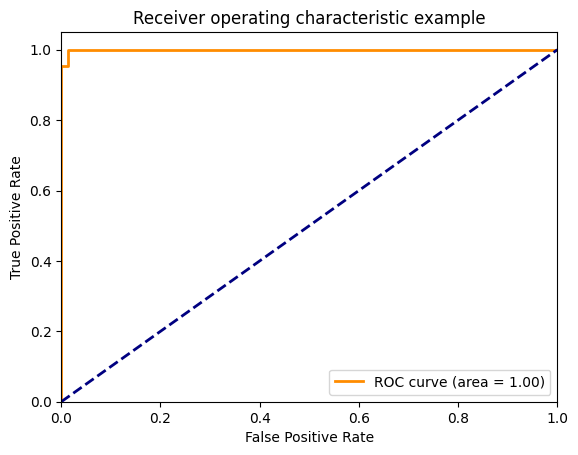

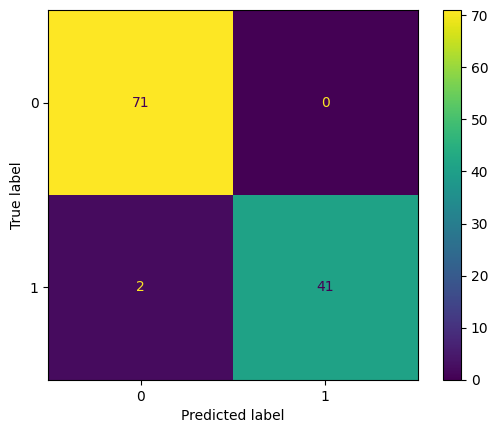

In [156]:
roc_grafico(y_test,y_pred)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

y_pred = modeloCompleto.predict(X_test)
cm = confusion_matrix(y_test, round(y_pred))

cm_display = ConfusionMatrixDisplay(cm).plot()
cm_display
plt.show()

En el diagrama de la curva ROC vemos que solo se está realizando con nuestras tres variables PC1, PC2 y PC3, lo interesante es mirar la matriz de confusión ya que aquí vemos que tan bueno es nuestro modelo para separar ceros y unos, y lo que vemos es que hay dos falsos positivos en los cuales selecciona mal dos 1 como si fuesen 0.

In [157]:
modeloF = logit(form,data=data_train).fit()
modeloF.summary()

Optimization terminated successfully.
         Current function value: 0.121625
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      451
Method:                           MLE   Df Model:                            3
Date:               ma., 04 abr. 2023   Pseudo R-squ.:                  0.8156
Time:                        00:07:42   Log-Likelihood:                -55.339
converged:                       True   LL-Null:                       -300.17
Covariance Type:            nonrobust   LLR p-value:                8.312e-106
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.6741      0.253     -2.662      0.008      -1.170      -0.178
PC1            2.1008      0.295      7.113      0.000       1.522       2.680
PC2           -1.1524      0.206     -5.582      0.000      -1.557      -0.748
PC3           -0.4864      0.145     -3.358      0.001      -0.770      -0.202
==============================================================================

Possibly complete quasi-separation: A fraction 0.22 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [158]:
tr_tst_eval_log(form,nuevoData)

Accuracy en training:  0.9472527472527472 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[71  0]
 [ 2 41]]
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99        71
         1.0       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114

Area bajo la curva ROC training: 
 0.9888691190466339
Area bajo la curva ROC test: 
 0.9993449066491975


El summary del modelo nos da los betas, esto es la expresión lineal respecto al logit del modelo. Recordamos que el logit es el log(p(evento)/p(no evento)) = beta0 + beta1 x1 + … betan xn

Entonces no se interpretan los betas como tal sino los Odds Ratio (OR) que son la exponencial de los parámetros beta.

Para calcular los OR podríamos aplicar las exponenciales de forma manual.

In [159]:
np.exp(modeloF.params)

Intercept    0.509624
PC1          8.172385
PC2          0.315869
PC3          0.614844
dtype: float64

Conclusiones del modelo:

* La probabilidad de una diagnosis bueno con respecto a malo en nuestro dataset winscons para la componente PC1 tiene un aumento 8 veces superior con respecto a las otras dos cargas. Lo que quiere decir que tiene mucho peso esta variable con respecto a la predicción de que nuestra variable objetivo, sin olvidar que si esta componente tiene un aumento o un peso de 8.1 concluiremos entonces que las siguientes variables de nuestro modelo original tendrán mucho peso en nuestro modelo:

        - concave points_mean 
        - concavity_mean 
        - concave points_worst 
        - compactness_mean  
        - perimeter_worst 
        - concavity_worst  
        - radius_worst  
        - perimeter_mean  
        - area_worst  
        - texture_worst 
        - texture_mean  

* La predicción de nuestros buenos con respectos a nuestros malos solo teniendo 3 componentes explicativas es buena.
* La precisión para predecir correctamente si es o no bueno es del 99.99%. El modelo se ha desempeñado eficiente mente y podemos utilizarlo para hacer las predicciones necesarias si queremos decidir si es bueno o no una casa en wisconsin.
* Nuestro modelo tiene buena capacidad para separar los de los buenos con respecto a los malos, ya que la curva ROC tiene un valor muy alto, aunque, el valor de AUC en realidad está distorsionado o mejor dicho inmerso en componentes que aglomeran otras variables. 





# Ejercicio 4

El conjunto de datos DatosEleccionesEspaña.xlsx contiene información demográfica sobre los distintos municipios de España junto con los resultados que se obtuvieron en un proceso electoral. En esta práctica, el objetivo fundamental es crear grupos de comunidades autónomas en función de ciertas características previamente seleccionadas. 

## 1- Escoge 10 variables numéricas presentes en el conjunto de datos y realiza un ligera depuración sobre este subconjunto de variables (Valores raros, Outliers, NAs..) 

### Leer el archivo

In [160]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Lectura de datos
DatosEleccionesEspaña = pd.read_excel(r"C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\Datos\DatosEleccionesEspaña.xlsx")
# Información del dataset
DatosEleccionesEspaña.info()
DatosEleccionesEspaña.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Name                          8119 non-null   object 
 1   CodigoProvincia               8119 non-null   int64  
 2   CCAA                          8119 non-null   object 
 3   Population                    8119 non-null   int64  
 4   TotalCensus                   8119 non-null   int64  
 5   AbstentionPtge                8119 non-null   float64
 6   AbstencionAlta                8119 non-null   int64  
 7   Izda_Pct                      8119 non-null   float64
 8   Dcha_Pct                      8119 non-null   float64
 9   Otros_Pct                     8119 non-null   float64
 10  Izquierda                     8119 non-null   int64  
 11  Derecha                       8119 non-null   int64  
 12  Age_0-4_Ptge                  8119 non-null   float64
 13  Age

,Name,CodigoProvincia,CCAA,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,ActividadPpal,inmuebles,Pob2010,SUPERFICIE,Densidad,PobChange_pct,PersonasInmueble,Explotaciones
0,Abadía,10,Extremadura,336,282,20.213,0,60.444,35.555,1.778,1,0,3.869,18.155,55.059,26.785,44.048,0.89,79.762,0.298,19.345,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0,0.0,0.0,0.0,0.0,Otro,216.0,326.0,4507.5593,MuyBaja,3.07,1.56,28
1,Abertura,10,Extremadura,429,364,25.275,0,54.779,44.118,0.368,1,0,1.632,13.055,56.643,30.304,50.117,1.63,90.909,2.797,7.226,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0,0.0,0.0,0.0,0.0,Otro,382.0,459.0,6270.7646,MuyBaja,-6.54,1.12,67
2,Acebo,10,Extremadura,569,569,27.241,0,44.203,53.140,0.966,0,1,1.230,9.139,54.834,36.028,49.033,0.70,78.910,0.703,18.102,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0,0.0,0.0,0.0,0.0,Otro,918.0,674.0,5702.1000,MuyBaja,-15.58,0.62,74
3,Acehúche,10,Extremadura,822,704,30.114,1,50.813,45.325,0.000,1,0,4.258,14.964,60.098,24.940,51.095,0.12,93.917,0.487,5.109,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0,0.0,0.0,0.0,0.0,Otro,599.0,842.0,9106.4649,MuyBaja,-2.38,1.37,66
4,Aceituna,10,Extremadura,623,540,30.185,1,44.562,49.867,0.796,0,1,3.531,15.569,59.391,25.042,48.154,0.64,93.258,0.161,4.173,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0,0.0,0.0,0.0,0.0,Otro,394.0,625.0,4007.6141,MuyBaja,-0.32,1.58,96


En el primer avistamiento con nuestro dataset servamos que tenemos 41 columnas con 8119 entradas, en las siguientes columnas tenemos algunos valores faltantes, pero nos vamos a centrar en seleccionar 10 variables y separarlas del dataset con nuestra variable CCAA.

### Toma de las 10 variables y CCAA

In [161]:
#Se separa las 10 variables y la variable CCAA:
nuevoData_elec = DatosEleccionesEspaña[["CCAA", "Population","ForeignersPtge", "UnemployLess25_Ptge", "Unemploy25_40_Ptge",
                               "UnemployMore40_Ptge", "AgricultureUnemploymentPtge", "IndustryUnemploymentPtge",
                               "ConstructionUnemploymentPtge", "ServicesUnemploymentPtge", "totalEmpresas"]]
nuevoData_elec.head()

,CCAA,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
0,Extremadura,336,0.89,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0
1,Extremadura,429,1.63,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0
2,Extremadura,569,0.70,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0
3,Extremadura,822,0.12,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0
4,Extremadura,623,0.64,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0


Tenemos nuestro nuevo dataset con las 10 variables y la variable CCAA, analizaremos cada variable del dataset para saber si tenemos un dato fuera de tendencia o algún tipo de  outlier.


### Información y descripción del dataset

In [162]:
nuevoData_elec.info()
nuevoData_elec.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   CCAA                          8119 non-null   object 
 1   Population                    8119 non-null   int64  
 2   ForeignersPtge                8119 non-null   float64
 3   UnemployLess25_Ptge           8119 non-null   float64
 4   Unemploy25_40_Ptge            8119 non-null   float64
 5   UnemployMore40_Ptge           8119 non-null   float64
 6   AgricultureUnemploymentPtge   8119 non-null   float64
 7   IndustryUnemploymentPtge      8119 non-null   float64
 8   ConstructionUnemploymentPtge  8119 non-null   float64
 9   ServicesUnemploymentPtge      8119 non-null   float64
 10  totalEmpresas                 8114 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 697.9+ KB


,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
count,8.119000e+03,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8114.000000
mean,5.741855e+03,5.619553,7.322292,37.003976,50.180442,8.400982,10.007836,10.837496,58.649705,398.603032
std,4.621520e+04,7.348553,9.408555,20.317306,22.803515,12.958405,12.528441,13.281177,24.259562,4219.366083
min,5.000000e+00,-8.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.660000e+02,1.060000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000
50%,5.490000e+02,3.590000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000
75%,2.427500e+03,8.180000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000
max,3.141991e+06,71.470000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,299397.000000


* **info:** Primeramente comenzaremos analizando los valores faltantes y vemos que en la variable **totalEmpresas** tenemos 5 valores faltantes (NaN), todos tienen un Dtype correctamente asignado.
* **describe:** en **population** tenemos como valor mínimo 5 y como valor maximo 3141991, por lo tanto, debemos hacer algo con esta variable ya que probablemente tengamos outliers ya sea en los valores cercanos al min o al valor max (valores fuera de rango). Para la variable que estudia el porcentaje de extranjeros **(ForeignersPtge)** tenemos un % negativo por lo tanto habrá que eliminar todos los valores inferiores a 0 ya que no podemos tener un porcentaje negativo de personas (valores mal codificados), además tenemos 653 valores perdidos alrededor de un 8% de nuestros datos. En **total de empresas** tenemos el mismo problema que en **population** ya que tenemos valores mínimos y máximos muy alejados, tendremos que ver como esta su distribución y detectar que valores son outliers o no (valores fuera de rango).  


In [163]:
# Número de valores distintos por variable
nuevoData_elec.nunique()

CCAA                              19
Population                      3597
ForeignersPtge                  2329
UnemployLess25_Ptge             2342
Unemploy25_40_Ptge              2681
UnemployMore40_Ptge             2751
AgricultureUnemploymentPtge     2525
IndustryUnemploymentPtge        2538
ConstructionUnemploymentPtge    2505
ServicesUnemploymentPtge        2904
totalEmpresas                   1225
dtype: int64

Frente a nuestro nuevo dataset con las 10 varaibles y la variable objetivo CCAA tenemos 19 comunidades autonomas, tambien se explica las 10 variables continuas:
* **Population:** cantidad de población*
* **ForeignersPtge:** porcentaje de extranjeros 
* **UnemployLess25_Ptge:** porcentaje de desempleados menores de 25 
* **Unemploy25_40_Ptge:** porcentaje de desempleados entre 25 y 40 
* **UnemployMore40_Ptge:** porcentaje de desempleados mayores al 40
* **AgricultureUnemploymentPtge:** porcentaje de desempleados de la agricultura
* **IndustryUnemploymentPtge:** porcentaje de desempleados de la industria 
* **ConstructionUnemploymentPtge:** porcetaje de desempleados de la construcción
* **ServicesUnemploymentPtge:** porcentaje de desempleados del sector de los servicios
* **totalEmpresas:** total de empresas

### Descripción grafica del dataset

In [164]:
exec(open(r'C:\Users\jhonn\Desktop\MBDDC\10_mineria_de_datos\NuestrasFunciones.py').read())
fig = px.bar(nuevoData_elec["CCAA"].value_counts())
print('Variable Objetivo')
fig

Variable Objetivo


Al observar la variable objetivo vemos que la comunidad autonoma con mayor número de votantes fue Castilla León teniendo un valor de 2248 personas en nuestro dataset.

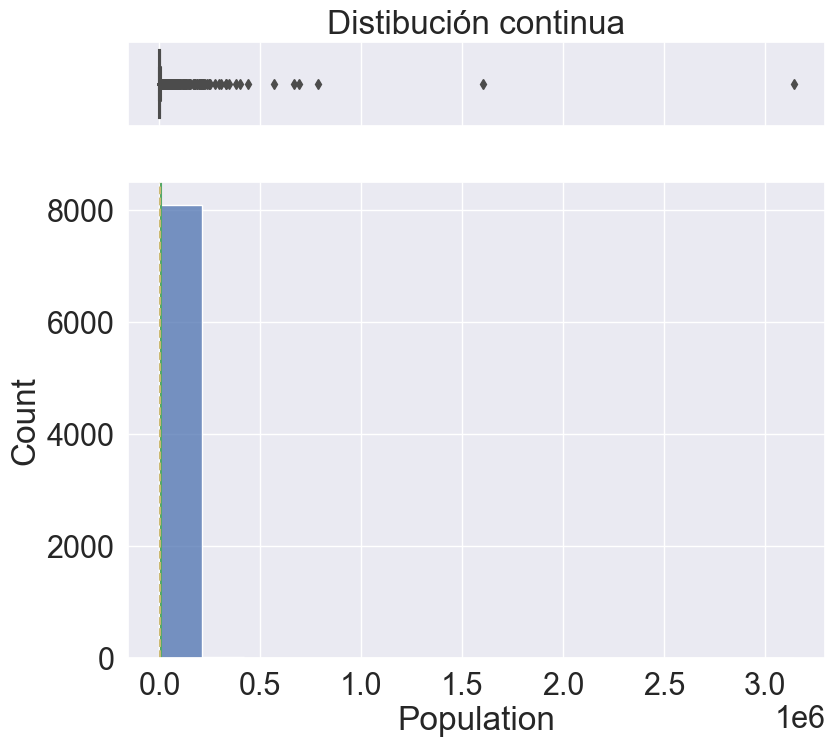

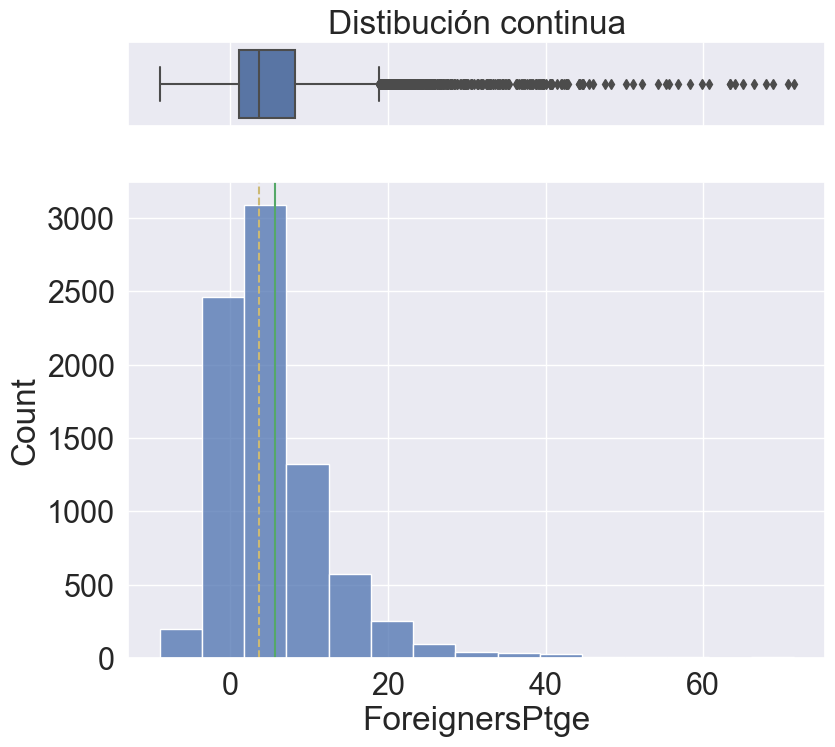

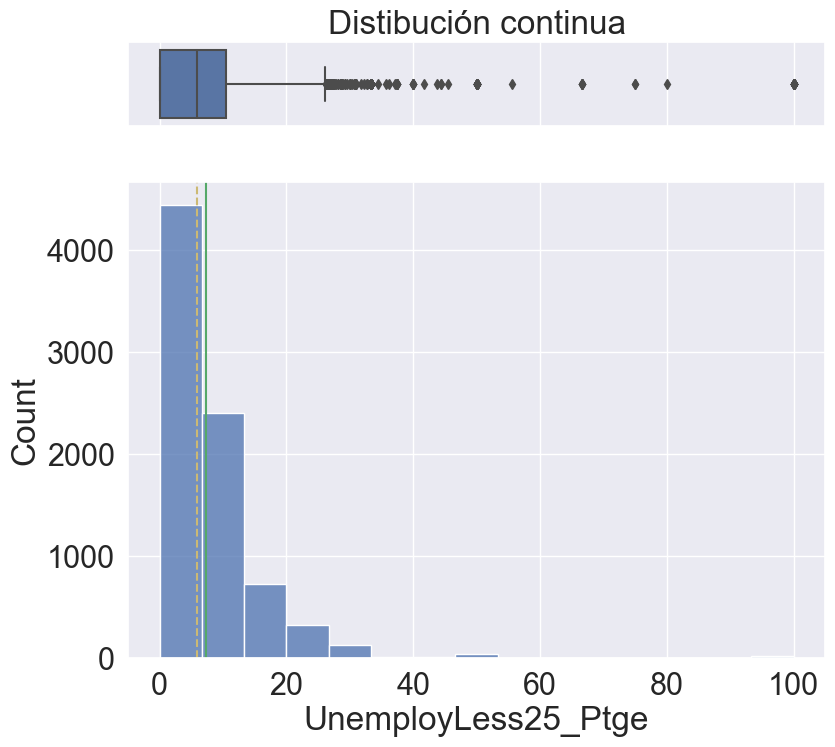

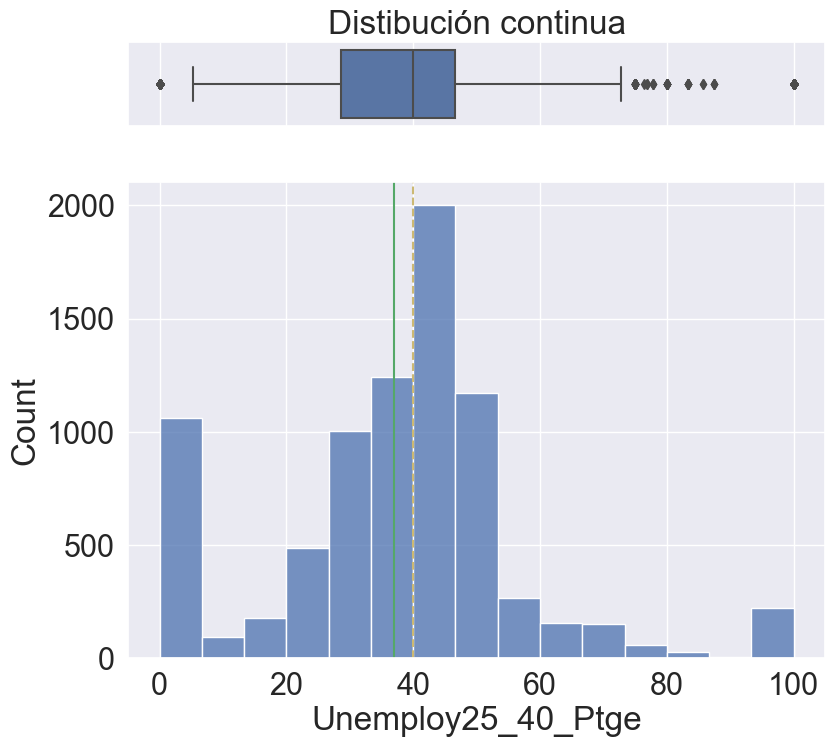

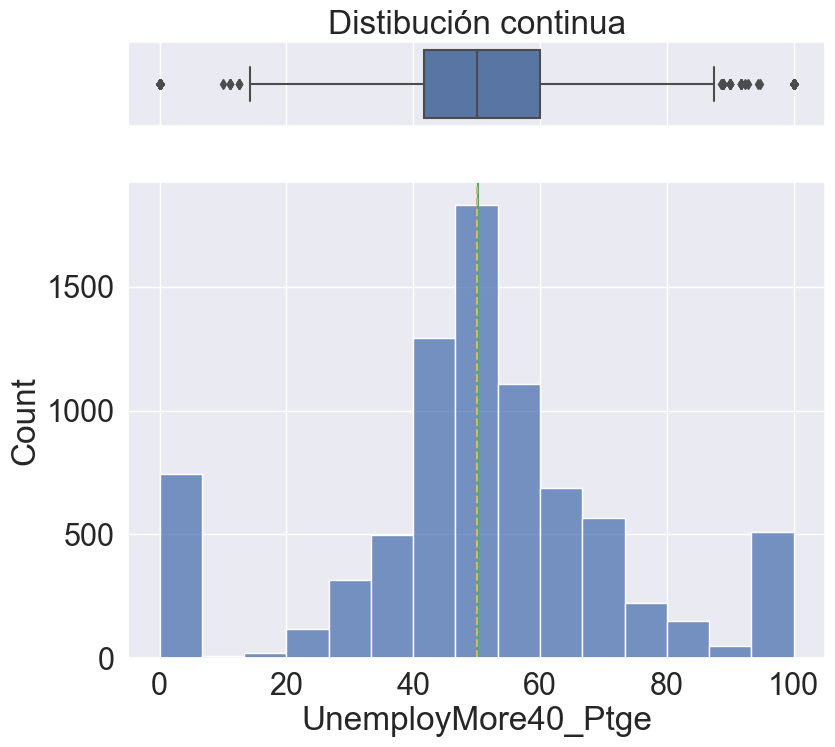

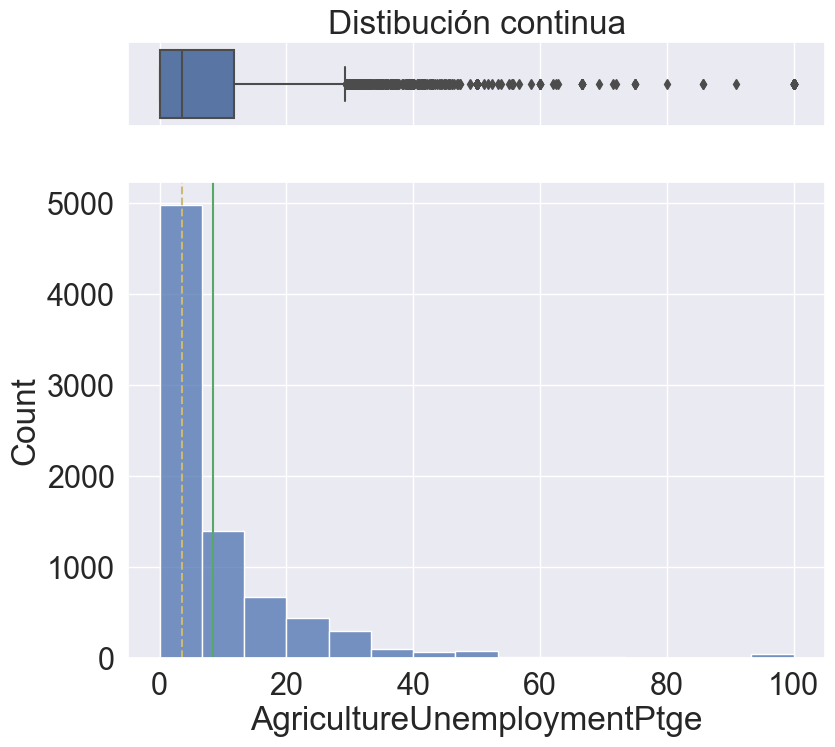

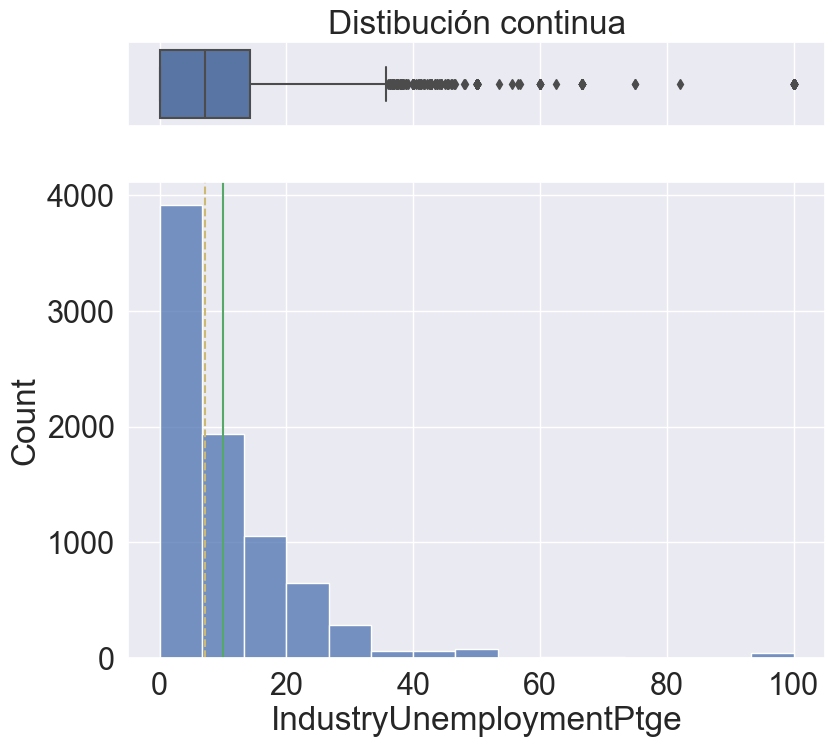

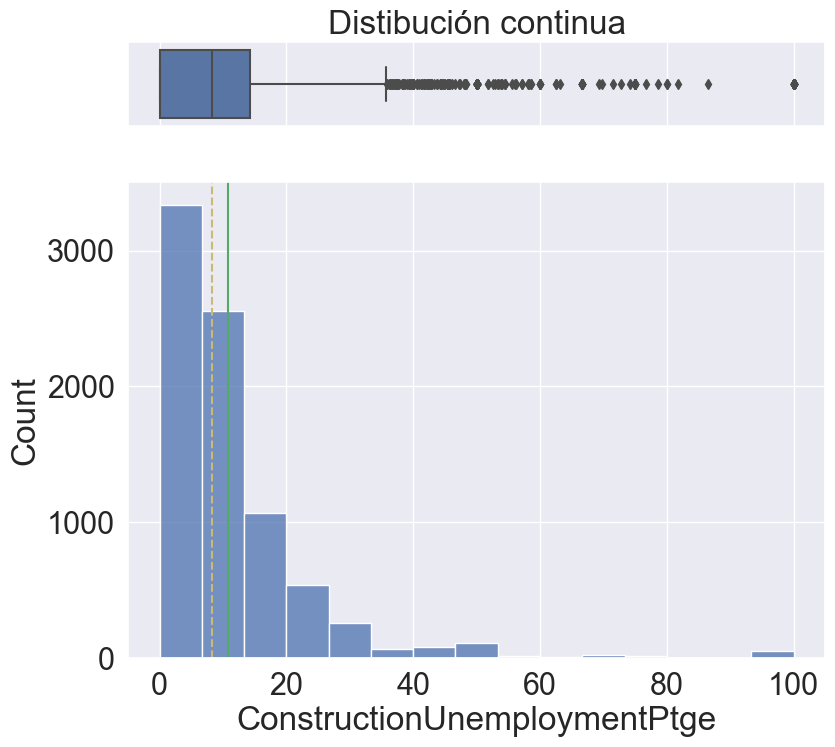

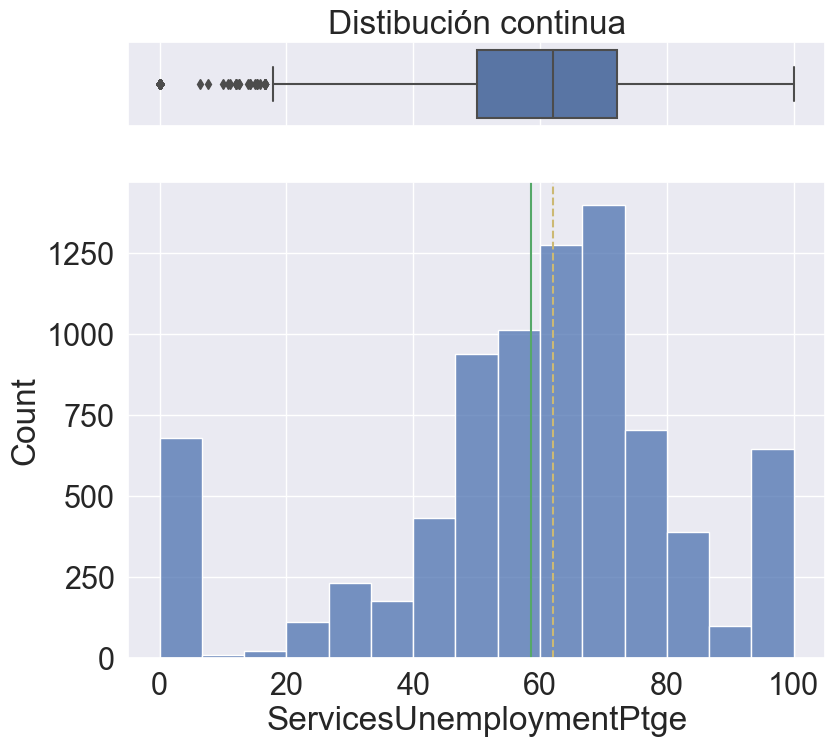

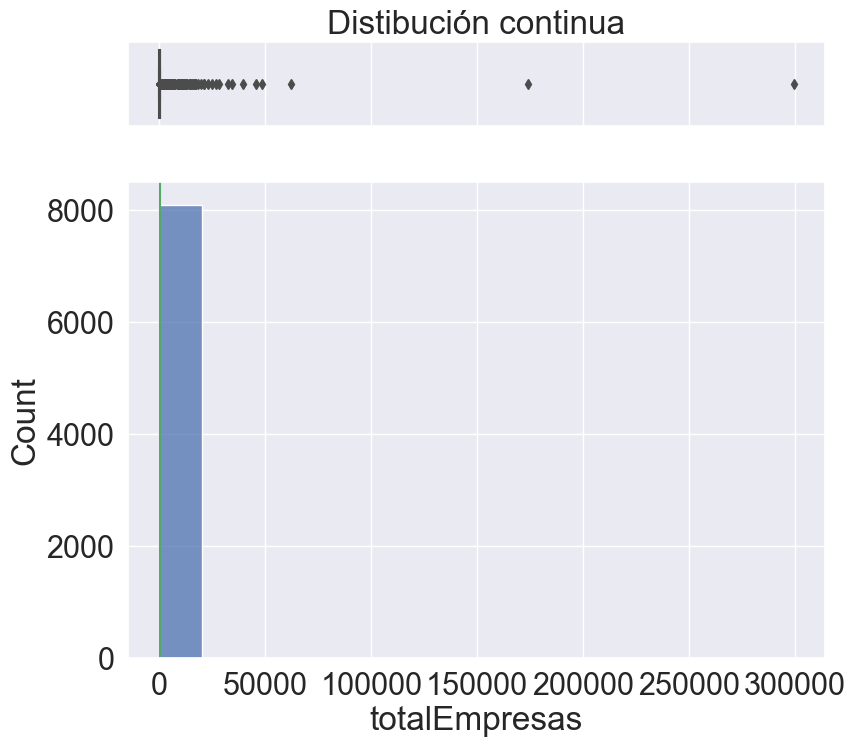

CCAA                            None
Population                      None
ForeignersPtge                  None
UnemployLess25_Ptge             None
Unemploy25_40_Ptge              None
UnemployMore40_Ptge             None
AgricultureUnemploymentPtge     None
IndustryUnemploymentPtge        None
ConstructionUnemploymentPtge    None
ServicesUnemploymentPtge        None
totalEmpresas                   None
dtype: object

In [165]:
## Función general plot para aplicar al archivo por columnas
def plot(col):
     if col.dtypes != 'object':
        fig = histogram_boxplot(col, xlabel = col.name, title = 'Distibución continua', bins = 15)
        return(fig)
nuevoData_elec.apply(plot)

Frente a nuestro nuevo dataset con las 10 variables y la variable objetivo CCAA tenemos 19 comunidades Autónomas, también se explica las 10 variables continuas:
* **Population:** Como se había observado en el describe nuestro grafico no tiene una buena simetría debido a que su valor máximo y mínimo tiene valores muy separados y en este caso la distribución de los datos se centra en el valor mínimo, ya que si observamos la distribución en el blox-plot vemos que se inclina por los valores más bajos y que solo hay dos valores muy altos, si cambiamos estos dos valores que están alejando nuestra distribución podríamos mejorarla.
* **ForeignersPtge:** para esta variable tenemos una distribución sesgada hacia la izquierda, ya que aparte de tener nuestros alores negativos los datos se concentran hacia la izquierda de la distribución, lo que hace que tengamos muchos outliers en donde no hay mucha densidad de los datos.
* **UnemployLess25_Ptge:** En esta variable vemos que tenemos una distribución sesgada hacia la izquierda como en la anterior, nuestros datos tienen mayor frecuencia en el valor del 0 esto hace que los valores más altos se produzcan outliers.
* **Unemploy25_40_Ptge:** En esta variable vemos una distribución parcialmente simétrica pero con valores frecuentes tanto en 0 como en 100.
* **UnemployMore40_Ptge:** En esta variable vemos una distribución parcialmente simétrica pero con valores frecuentes tanto en 0 como en 100.
* **AgricultureUnemploymentPtge:** Para la variable porcentaje de desempleados en el sector de agricultura vemos una distribución sesgada hacia la izquierda, esto quiere decir que los datos se concentran hacia la izquierda de la distribución. Esto se ve en el blox-plot con valores atípicos a nuestra derecha.
* **IndustryUnemploymentPtge:** Como en la anterior variable para la variable porcentaje de desempleados en el sector industrial vemos una distribución sesgada hacia la izquierda.
* **ConstructionUnemploymentPtge:** Como en la anterior variable en el porcentaje de desempleados en el sector de la construcción vemos una distribución sesgada hacia la izquierda.
* **ServicesUnemploymentPtge:** Para la variable de porcentaje de desempleados de servicios tenemos una distribución sesgada hacia la derecha, pero se obtiene una distribución parcialmente normal aunque con frecuencia de valores en 0 y en 100. En el blox-plot se observan outliers para valores bajos.
* **totalEmpresas:** Para el total de empresas tenemos el mismo problema que para population y es que tenemos mucha diferencia entre los valores mínimos y los valores máximos por lo tanto, en este caso que tenemos valores con mayor frecuencia en 0 nuestro grafico no tendrá un distribución normal, además de generar muchos valores en la derecha.


### Corrección de errores detectados

#### 1. ForeignersPtge: 
Se debe corregir los valores fuera de rango para ForeignersPtge es un porcentaje y no puede tener valores negativos.

In [166]:
nuevoData_elec.sort_values(by= 'ForeignersPtge', ascending=True).head()

,CCAA,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
841,CastillaMancha,1153,-8.96,18.841,34.783,46.377,10.145,5.797,17.391,55.072,129.0
7362,Extremadura,3489,-8.90,14.183,40.865,44.952,27.644,2.404,3.125,58.894,151.0
6613,PaísVasco,270,-8.80,0.000,66.667,33.333,0.000,0.000,0.000,83.333,23.0
2194,CastillaLeón,1135,-8.73,9.677,36.559,53.763,2.151,10.753,19.355,54.839,67.0
4769,CastillaLeón,25,-8.71,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0


In [167]:
# Corregimos valores fuera de rango de ForeignersPtge (recordemos que es un %). Opción con np.where de nuumpy
nuevoData_elec.ForeignersPtge = np.where((nuevoData_elec['ForeignersPtge'] < 0), np.nan,nuevoData_elec.ForeignersPtge)
# Comprobamos nuevos límites de la variable
nuevoData_elec.ForeignersPtge.min(),nuevoData_elec.ForeignersPtge.max()

(0.0, 71.47)

### Valores atípicos

Como ya se ha visto la variabilidad de los datos en su distribución es muy grande. Por lo tanto, se lleva a cabo un conteo de los valores que se consideran extremos según un consenso de dos criterios distintos.
* El el primero se aplica la media +3sd o mediana +8mad.
* En el segúndo aplicamos el criterio del bloxplot umbrales en cuartil 1-3IQR y cuartil 3 + 3IQR. 

In [168]:
nuevoData_elec.select_dtypes(include=np.number).apply(lambda x: x.skew())

Population                      45.996406
ForeignersPtge                   2.755577
UnemployLess25_Ptge              4.149784
Unemploy25_40_Ptge               0.213126
UnemployMore40_Ptge             -0.230105
AgricultureUnemploymentPtge      3.229281
IndustryUnemploymentPtge         3.089803
ConstructionUnemploymentPtge     3.094081
ServicesUnemploymentPtge        -0.805963
totalEmpresas                   53.704675
dtype: float64

Antes de gestionar aquellos valores detectados como outliers, valoramos la incidencia en cada variable contando el porcentaje de registros atípicos en relación al total de registros. 

* En nuestro caso gráficamente habíamos visto dos casos graves en Population y totalEmpresas los cuales tienen valores mínimos y máximos muy alejados, además de tener una concentración de la frecuencia en nuestros valores mínimos, generando una distribución muy mala. Calculando la asimetría en valores absolutos vemos en que porcentaje están sesgado nuestras variables con respecto a nuestros datos. Y vemos un 45% para population y un 53% para totalEmpresas, por lo tanto, aplicaremos una función que se encargue de gestionar estos outliers.


In [169]:
#se dividen las variables categoricas para no tener ploblema
var_cat = nuevoData_elec["CCAA"]
#dataset solo con varaibles continuas
imput_elec = nuevoData_elec.drop(["CCAA"], axis=1)
imput_elec.sort_values(by= "Population", ascending=False).head()

,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
2821,3141991,12.12,6.395,43.351,50.254,0.760,5.239,8.927,79.575,299397.0
7456,1604555,16.36,4.651,41.448,53.901,0.467,8.371,7.724,78.827,174209.0
5678,786189,11.86,5.886,41.687,52.427,1.947,9.489,8.111,74.893,62013.0
4612,693878,4.68,8.146,44.279,47.575,1.848,5.658,8.449,70.002,48415.0
6572,664953,10.12,8.769,43.151,48.079,3.023,10.345,8.216,68.528,45477.0


Se crea un dataset nuevo solo con las variables continuas y se ordena de mayor a menor para saber qué cambio se produce cuando realicemos la gestión por valores atípicos.

In [170]:
# Crear copia para evitar pisar información
imput_elec_Cont = imput_elec.select_dtypes(include=np.number).copy()

# Aplicar la gestión de outliers en modelo winsor
imput_elec_winsor = imput_elec.apply(lambda x: gestiona_outliers(x,clas='winsor'))

# Contemos si ha desaparecido algún resgitro o algo 
# vinos_winsor.apply(lambda x: x.isna().sum()/x.count()*100)

Population
ForeignersPtge
UnemployLess25_Ptge
Unemploy25_40_Ptge
UnemployMore40_Ptge
AgricultureUnemploymentPtge
IndustryUnemploymentPtge
ConstructionUnemploymentPtge
ServicesUnemploymentPtge
totalEmpresas


In [171]:
print(imput_elec_winsor.select_dtypes(include=np.number).apply(lambda x: x.skew()))
# Veamos los valores mínimos de acidez ahora
imput_elec_winsor.sort_values(by= "Population", ascending=False).head()


Population                      4.553763
ForeignersPtge                  2.233175
UnemployLess25_Ptge             2.230819
Unemploy25_40_Ptge              0.213126
UnemployMore40_Ptge            -0.230105
AgricultureUnemploymentPtge     2.484612
IndustryUnemploymentPtge        2.432575
ConstructionUnemploymentPtge    2.401210
ServicesUnemploymentPtge       -0.805963
totalEmpresas                   4.750303
dtype: float64


,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
6574,66598,6.11,14.928,49.833,35.239,0.486,4.457,6.196,71.200,3762.0
3449,66598,4.46,6.349,44.399,49.253,1.207,8.522,9.884,71.581,4741.0
6621,66598,8.72,6.169,48.942,44.889,2.866,11.946,8.599,64.831,4741.0
6575,66598,15.12,16.363,46.165,37.472,0.963,1.324,8.057,69.407,4349.0
239,66598,3.50,8.134,44.117,47.749,1.329,5.317,11.598,64.111,4741.0


Aplicamos nuestra función de gestión de outliers de clase winsor, en el que colapsan todos los valores mayores o menores determinados por nuestro umbral de ciertos rangos (dados por nuestros percentiles) en el cual se igualan a esos umbrales. Este método nos viene bien con respecto a nuestros datos debido a que como hay pocos datos que están por encima de ese límite superior no provoca una carga excesiva de las colas de distribución.
* Todos los valores sesgados se pierden algunos datos ya que estos se trasladan hacia su límite más cercano.


In [172]:
#Proporción de missings por variable 
imput_elec_winsor.apply(lambda x: x.isna().sum()/x.count()*100)

Population                      0.000000
ForeignersPtge                  8.746317
UnemployLess25_Ptge             0.000000
Unemploy25_40_Ptge              0.000000
UnemployMore40_Ptge             0.000000
AgricultureUnemploymentPtge     0.000000
IndustryUnemploymentPtge        0.000000
ConstructionUnemploymentPtge    0.000000
ServicesUnemploymentPtge        0.000000
totalEmpresas                   0.061622
dtype: float64

Se realiza una columna que calcula la proporción de prop_missings con respecto a cada registro.

In [173]:
#Proporción de missings por observación (como una nueva columna del dataset)
imput_elec_winsor['prop_missings'] = imput_elec_winsor.apply(lambda x: x.isna().sum()/imput_elec_winsor.shape[1]*100,axis=1)

# Valoramos distribución
imput_elec_winsor.prop_missings.describe()

count    8119.000000
mean        0.810445
std         2.729202
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        10.000000
Name: prop_missings, dtype: float64

In [174]:
imput_elec_winsor.sort_values(by='prop_missings', ascending=False).head()

,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,prop_missings
5108,261,NaN,0.000,70.000,30.000,0.000,50.000,10.000,40.000,17.0,10.0
7106,867,NaN,9.434,47.170,43.396,2.830,2.830,21.698,33.962,39.0,10.0
3339,2038,NaN,5.882,32.353,61.765,6.863,12.745,18.627,55.882,73.0,10.0
5040,125,NaN,0.000,100.000,0.000,0.000,0.000,0.000,0.000,6.0,10.0
1068,5608,NaN,4.783,38.696,56.522,11.304,26.957,5.217,47.391,388.0,10.0


Se ordena de mayor a menor con respecto al % de datos faltantes por registro.

In [175]:
imput_elec_winsor_del = imput_elec_winsor.dropna().describe()
imput_elec_winsor_del

,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,prop_missings
count,7461.000000,7461.000000,7461.000000,7461.000000,7461.000000,7461.000000,7461.000000,7461.00000,7461.000000,7461.000000,7461.0
mean,3931.976009,6.302228,7.169386,37.008201,50.201033,8.276120,9.849030,10.64222,58.702566,257.306125,0.0
std,10247.974792,6.902300,8.215376,20.270309,22.794467,12.082954,11.718425,12.25493,24.270035,703.184098,0.0
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0
25%,167.000000,1.620000,0.000000,28.772000,41.700000,0.000000,0.000000,0.00000,50.000000,7.000000,0.0
50%,553.000000,4.140000,5.882000,40.000000,50.000000,3.571000,7.143000,8.33300,62.069000,31.000000,0.0
75%,2456.000000,8.820000,10.469000,46.688000,60.000000,11.628000,14.286000,14.28600,72.172000,149.000000,0.0
max,66598.000000,44.190000,55.556000,100.000000,100.000000,75.000000,82.000000,76.74400,100.000000,4741.000000,0.0


Podríamos eliminar los datos ya que solo en la variable ForeignersPtge tenemos valores perdidos, siendo así el porcentaje de valores que perderíamos sería un 8% de nuestros registros. Pero como nuestro fin es mantener la cantidad de datos que tenemos, nuestro procedimiento será imputar valores en los datos faltantes con respecto a la siguiente premisa:

* Antes de realizar la eliminación de los valores inferiores a 0% (se habían eliminado ya que un % de personas no puede ser negativo para este caso), se observó que en la mayoría de los valores de porcentaje negativo estaba en un rango de 0-8, esto nos puede dar un indicio de cómo podríamos imputarles ya que como la mayoría de nuestros valores se concentran en este rango de manera positiva (0-8%) podríamos intuir que estos datos podrían ser los de la moda (más frecuente) y realzar esta forma de imputación según nuestra premisa planteada. Pero como con la moda solo se pueden imputar valores de variables categóricas nos centraremos en tipos de imputación que no suban el valor de la media.


### Inputación

Realizaremos imputaciones por media, mediana y ramdom para así tomar el dataset las imputaciones resultantes  más cercano sea al dataset con los valores nan (con los -% borrados) con respecto a la media, mediana y desvesta.

In [176]:
imput_elec_winsor.describe()

,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,prop_missings
count,8119.000000,7466.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8114.000000,8119.000000
mean,3890.431088,6.300122,7.170797,37.003976,50.180442,8.254124,9.901419,10.682831,58.649705,255.195218,0.810445
std,10150.590478,6.900654,8.219250,20.317306,22.803515,12.030423,11.819919,12.346154,24.259562,699.881141,2.729202
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,166.000000,1.620000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000
50%,549.000000,4.130000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000
75%,2427.500000,8.810000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000,0.000000
max,66598.000000,44.190000,55.556000,100.000000,100.000000,75.000000,82.000000,76.744000,100.000000,4741.000000,10.000000


#### Inputación por media

In [177]:
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
import feature_engine.imputation as fe_imp
# Media
imputer_mean = fe_imp.MeanMedianImputer(imputation_method='mean')
imput_elec_winsor_mean_imputed = imputer_mean.fit(imput_elec_winsor).transform(imput_elec_winsor)
print(imput_elec_winsor_mean_imputed.info())
imput_elec_winsor_mean_imputed.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Population                    8119 non-null   int64  
 1   ForeignersPtge                8119 non-null   float64
 2   UnemployLess25_Ptge           8119 non-null   float64
 3   Unemploy25_40_Ptge            8119 non-null   float64
 4   UnemployMore40_Ptge           8119 non-null   float64
 5   AgricultureUnemploymentPtge   8119 non-null   float64
 6   IndustryUnemploymentPtge      8119 non-null   float64
 7   ConstructionUnemploymentPtge  8119 non-null   float64
 8   ServicesUnemploymentPtge      8119 non-null   float64
 9   totalEmpresas                 8119 non-null   float64
 10  prop_missings                 8119 non-null   float64
dtypes: float64(10), int64(1)
memory usage: 697.9 KB
None


,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,prop_missings
count,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000
mean,3890.431088,6.300122,7.170797,37.003976,50.180442,8.254124,9.901419,10.682831,58.649705,255.195218,0.810445
std,10150.590478,6.617297,8.219250,20.317306,22.803515,12.030423,11.819919,12.346154,24.259562,699.665574,2.729202
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,166.000000,1.790000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000
50%,549.000000,4.680000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000
75%,2427.500000,8.180000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,148.000000,0.000000
max,66598.000000,44.190000,55.556000,100.000000,100.000000,75.000000,82.000000,76.744000,100.000000,4741.000000,10.000000


#### Inputación de mamera aleatoría

In [178]:
import feature_engine.imputation as fe_imp
# Aleatoria: numéricas y nominales
imputer_rand = fe_imp.RandomSampleImputer()
# Aleatoria: numéricas y nominales
imput_wins_rand_imputed = imputer_rand.fit(imput_elec_winsor).transform(imput_elec_winsor)
imput_wins_rand_imputed.describe()

,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,prop_missings
count,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000
mean,3890.431088,6.312827,7.170797,37.003976,50.180442,8.254124,9.901419,10.682831,58.649705,255.091883,0.810445
std,10150.590478,6.932745,8.219250,20.317306,22.803515,12.030423,11.819919,12.346154,24.259562,699.683003,2.729202
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,166.000000,1.610000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000
50%,549.000000,4.120000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000
75%,2427.500000,8.830000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000,0.000000
max,66598.000000,44.190000,55.556000,100.000000,100.000000,75.000000,82.000000,76.744000,100.000000,4741.000000,10.000000


#### Inputación según mediana

In [179]:
imputer_median = fe_imp.MeanMedianImputer(imputation_method='median')
# Mediana
imput_elec_winsor_median_imputed = imputer_median.fit(imput_elec_winsor).transform(imput_elec_winsor)
print(imput_elec_winsor_median_imputed.info())
imput_elec_winsor_median_imputed.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Population                    8119 non-null   int64  
 1   ForeignersPtge                8119 non-null   float64
 2   UnemployLess25_Ptge           8119 non-null   float64
 3   Unemploy25_40_Ptge            8119 non-null   float64
 4   UnemployMore40_Ptge           8119 non-null   float64
 5   AgricultureUnemploymentPtge   8119 non-null   float64
 6   IndustryUnemploymentPtge      8119 non-null   float64
 7   ConstructionUnemploymentPtge  8119 non-null   float64
 8   ServicesUnemploymentPtge      8119 non-null   float64
 9   totalEmpresas                 8119 non-null   float64
 10  prop_missings                 8119 non-null   float64
dtypes: float64(10), int64(1)
memory usage: 697.9 KB
None


,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,prop_missings
count,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000
mean,3890.431088,6.125582,7.170797,37.003976,50.180442,8.254124,9.901419,10.682831,58.649705,255.056534,0.810445
std,10150.590478,6.643567,8.219250,20.317306,22.803515,12.030423,11.819919,12.346154,24.259562,699.687881,2.729202
min,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,166.000000,1.790000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000
50%,549.000000,4.130000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000
75%,2427.500000,8.180000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000,0.000000
max,66598.000000,44.190000,55.556000,100.000000,100.000000,75.000000,82.000000,76.744000,100.000000,4741.000000,10.000000


Nos quedamos con las imputaciones por mediana debido a que no varían con respecto a la premisa inicial ya que en la variable que se ha imputado tienen valores muy similares de media **(6,3)**, desviación estándar **(6,9)** y mediana **(4,1)**.

### Toma de decisiones y guardado del archivo depurado

Ya **terminada la limpieza** del dataset lo que realizamos es la unión de las variables categóricas con las variables continuas para así continuar con nuestro estudio.

In [180]:
imput_elec_winsor_median_imputed.head()
imput_elec_winsor_median_imputed_1 = imput_elec_winsor_median_imputed.drop(['prop_missings'],axis=1)
imput_elec_winsor_median_imputed_1.head()

,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
0,336,0.89,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0
1,429,1.63,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0
2,569,0.70,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0
3,822,0.12,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0
4,623,0.64,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0


In [181]:
# Agregar variables objetivo al input ya limpio
elec_wins_mediana_imputed = pd.concat([var_cat, imput_elec_winsor_median_imputed_1], axis=1)
print(elec_wins_mediana_imputed.info())
elec_wins_mediana_imputed.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   CCAA                          8119 non-null   object 
 1   Population                    8119 non-null   int64  
 2   ForeignersPtge                8119 non-null   float64
 3   UnemployLess25_Ptge           8119 non-null   float64
 4   Unemploy25_40_Ptge            8119 non-null   float64
 5   UnemployMore40_Ptge           8119 non-null   float64
 6   AgricultureUnemploymentPtge   8119 non-null   float64
 7   IndustryUnemploymentPtge      8119 non-null   float64
 8   ConstructionUnemploymentPtge  8119 non-null   float64
 9   ServicesUnemploymentPtge      8119 non-null   float64
 10  totalEmpresas                 8119 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 697.9+ KB
None


,CCAA,Population,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas
0,Extremadura,336,0.89,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0
1,Extremadura,429,1.63,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0
2,Extremadura,569,0.70,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0
3,Extremadura,822,0.12,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0
4,Extremadura,623,0.64,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0


## 2- Agrega los valores por CCAA, distinguiendo entre valores relativos (agregaciónpor la media) y valores absolutos (agregación por suma)

In [182]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from sklearn.datasets import make_blobs

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (12,10)

# Preprocesado y modelado
# ==============================================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [183]:
valor_sin_abs = elec_wins_mediana_imputed.drop(['Population','totalEmpresas'],axis=1)
group_data_media = valor_sin_abs.groupby('CCAA').mean()
group_data_media 

,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge
CCAA,,,,,,,,
Andalucía,6.054644,13.842166,43.231334,42.868996,14.851850,5.971745,14.424155,55.793304
Aragón,7.155116,6.136969,35.528335,46.946937,8.790172,10.365862,8.900134,54.195016
Asturias,2.698974,7.168179,43.440769,49.391141,4.655141,9.579077,13.571231,64.149731
Baleares,14.844925,7.454119,39.984045,51.069343,2.226045,6.183836,17.585343,67.592612
Canarias,10.805341,5.438432,42.537591,52.023920,4.518182,3.876227,12.892523,72.823102
Cantabria,3.448137,7.462520,42.201020,49.900794,2.382667,7.717853,12.730029,69.295892
CastillaLeón,3.849649,6.322635,31.672047,51.557764,7.193402,8.289128,10.988807,54.964627
CastillaMancha,6.917824,7.366250,35.258565,48.624712,9.670244,7.581694,10.640993,57.178591
Cataluña,8.843073,4.909170,38.002856,55.926428,5.815637,14.333127,9.274014,64.650232


Se realiza la agregación por media para los valores relativos en los cuales tenemos %, para las variables que no sean población y número de empresas.

In [184]:
valor_abs = elec_wins_mediana_imputed[['CCAA','Population','totalEmpresas']]
group_data_sum = valor_abs.groupby('CCAA').sum()
group_data_sum 

,Population,totalEmpresas
CCAA,,
Andalucía,6030913,343436.0
Aragón,719492,49312.0
Asturias,673983,43782.0
Baleares,770499,59744.0
Canarias,1512399,96542.0
Cantabria,477820,30870.0
CastillaLeón,1969901,125797.0
CastillaMancha,1893866,116931.0
Cataluña,4960280,364150.0


Se realiza la agrupación por suma para las unicas variables absolutas que son población y cantidad de empresas.

In [185]:
para_CCAA = pd.concat([group_data_sum, group_data_media], axis=1)
para_CCAA

,Population,totalEmpresas,ForeignersPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge
CCAA,,,,,,,,,,
Andalucía,6030913,343436.0,6.054644,13.842166,43.231334,42.868996,14.851850,5.971745,14.424155,55.793304
Aragón,719492,49312.0,7.155116,6.136969,35.528335,46.946937,8.790172,10.365862,8.900134,54.195016
Asturias,673983,43782.0,2.698974,7.168179,43.440769,49.391141,4.655141,9.579077,13.571231,64.149731
Baleares,770499,59744.0,14.844925,7.454119,39.984045,51.069343,2.226045,6.183836,17.585343,67.592612
Canarias,1512399,96542.0,10.805341,5.438432,42.537591,52.023920,4.518182,3.876227,12.892523,72.823102
Cantabria,477820,30870.0,3.448137,7.462520,42.201020,49.900794,2.382667,7.717853,12.730029,69.295892
CastillaLeón,1969901,125797.0,3.849649,6.322635,31.672047,51.557764,7.193402,8.289128,10.988807,54.964627
CastillaMancha,1893866,116931.0,6.917824,7.366250,35.258565,48.624712,9.670244,7.581694,10.640993,57.178591
Cataluña,4960280,364150.0,8.843073,4.909170,38.002856,55.926428,5.815637,14.333127,9.274014,64.650232


Se concadenan en un dataset las variables agrupadas por sum y agrupadas por mean. Se llama para_CCAA con el fin de identificar que este es el dataset luego de aplicar la agrupación listo para comenzar nuestro proceso de separación por clusters.

## 3- Valora la necesidad de escalar los datos y decide el tipo de distancia a aplicar

No tenemos tasas de medidas de la misma escala ya que unos son % y otros son valores absolutos como numero de población, esto hace que tengamos mucha diferencia en nuestros datos a nivel de escala, por lo tanto, se debe realizar un escalado de los datos:

In [186]:
# Preprocesado y modelado
# ==============================================================================
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import scale

### escalado

In [187]:
# Escalado de datos
# ==============================================================================
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_ccaa = scaler.fit_transform(para_CCAA)
# Escalado de datos
# ==============================================================================
X_scaled = scale(para_CCAA)

## 4- Explora los métodos de clustering jerárquico para estos datos y decide el tipo de Linkage más adecuado.

Aplicamos el dendograma para los 4 métodos de Linkage principales para comparar la dinámica de agrupación propuesta por cada uno de ellos.

ward :	0.01s


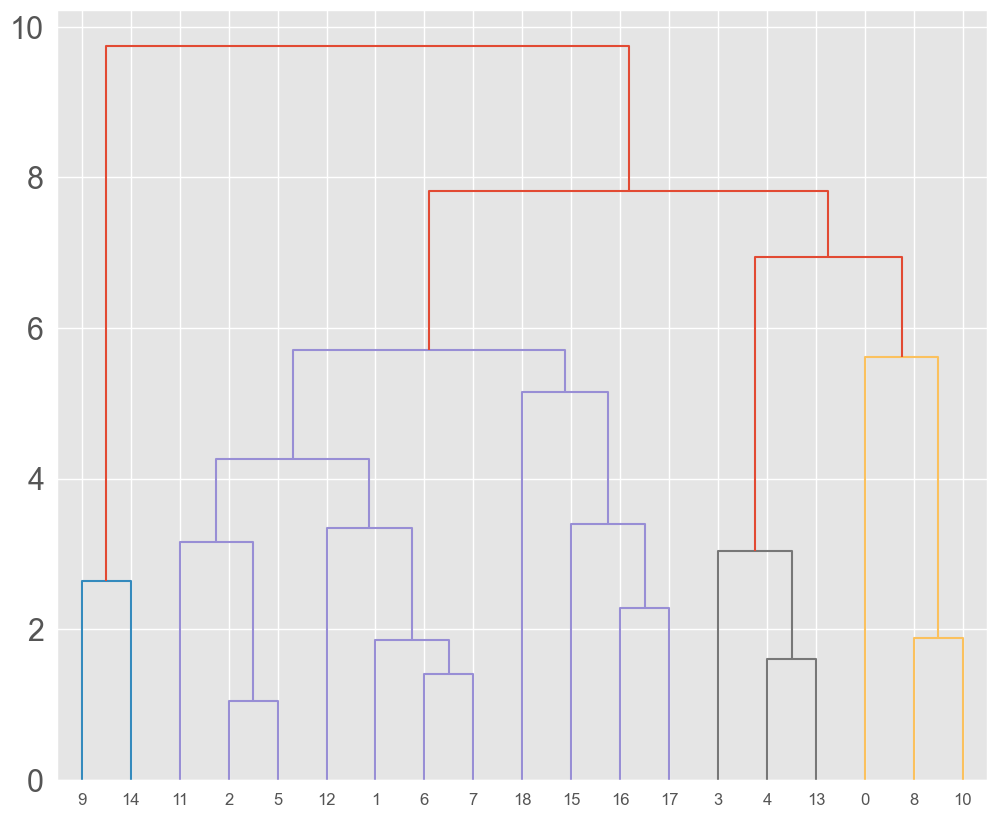

average :	0.00s


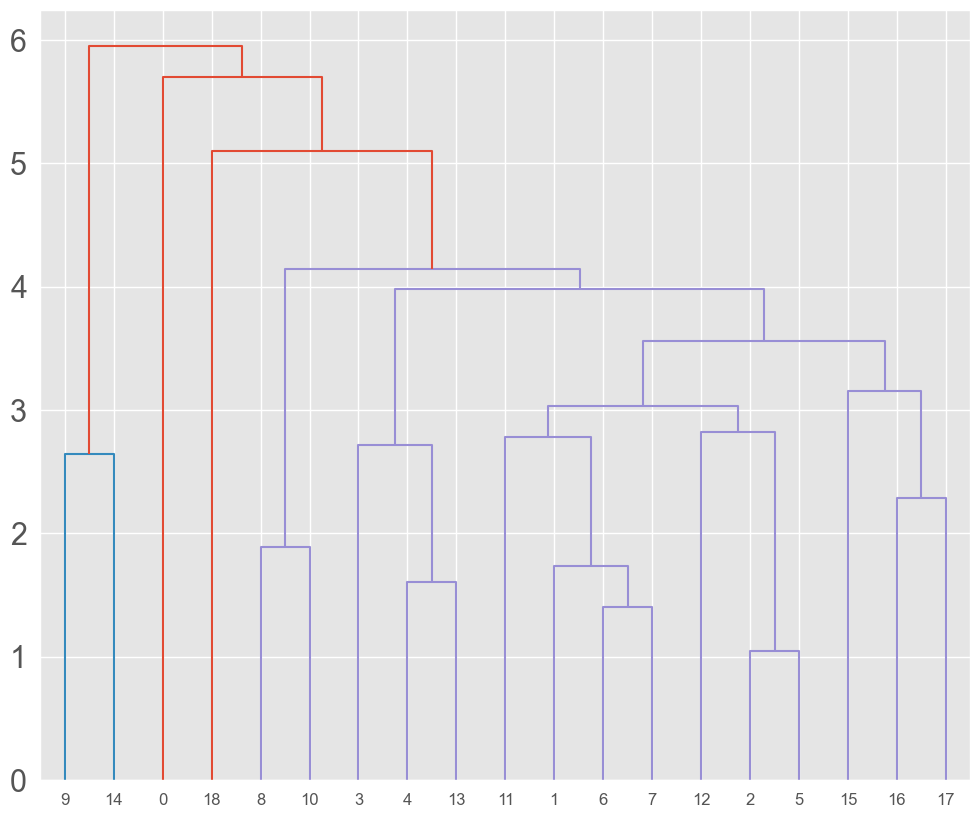

complete :	0.00s


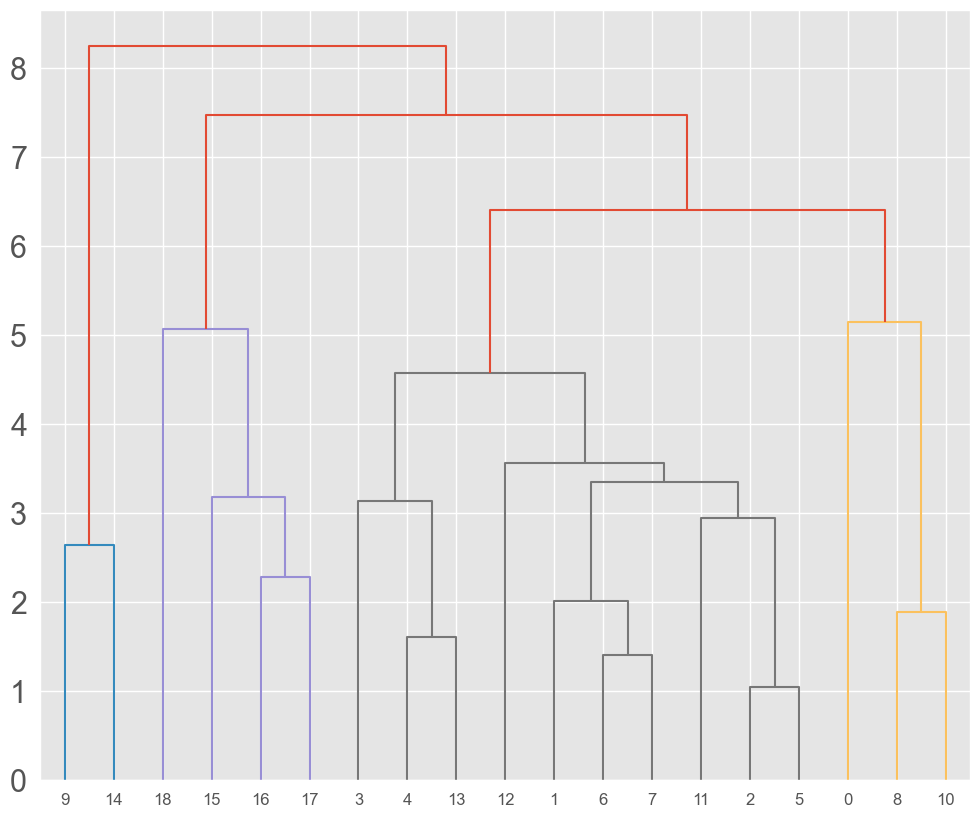

single :	0.01s


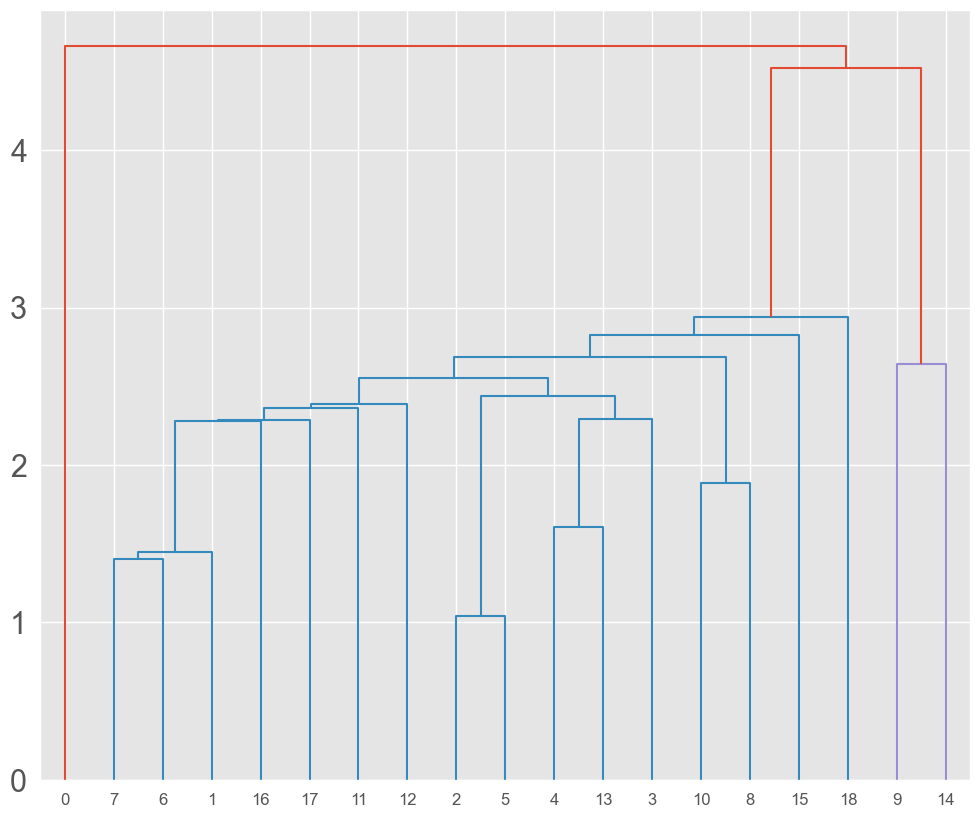

In [188]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from time import time

for linkage in ("ward", "average", "complete", "single"):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=None,
                            distance_threshold = 0)
    t0 = time()
    clustering.fit(X_scaled)
    print("%s :\t%.2fs" % (linkage, time() - t0))
    
    plt.clf()
    plot_dendogram(clustering)
    #plot_clustering(X_scaled, clustering.labels_, "%s linkage" % linkage)


Escogemos el método de mínima varianza, Observación de grupos:
* **ward:** Este endograma se separa en cuatro grupos.
* **average:** En este endograma se parte en tres grupos pero comienzan a juntarse las observaciones, generando distorsión en la evolución del clustering.
* **complete:** Este endograma se separa en cuatro grupos de manera clara.
* **single:** Se comienza a juntar las observaciones, presencia de potenciales observaciones que están un poco lejos y distorsionan mucho la evolución del clustering. nos proporciona 3 grupos.


## 5- Toma una decisión sobre el número de clusters a considerar y realiza un análisis cluster mediante el método k-means.

### cluster k-means 

Se aplica la función que hemos definido para graficar los screeplots en relación a las 4 métricas comentadas para valorar el número de grupos óptimo y comparar con los propuestos en el dendograma de ward.

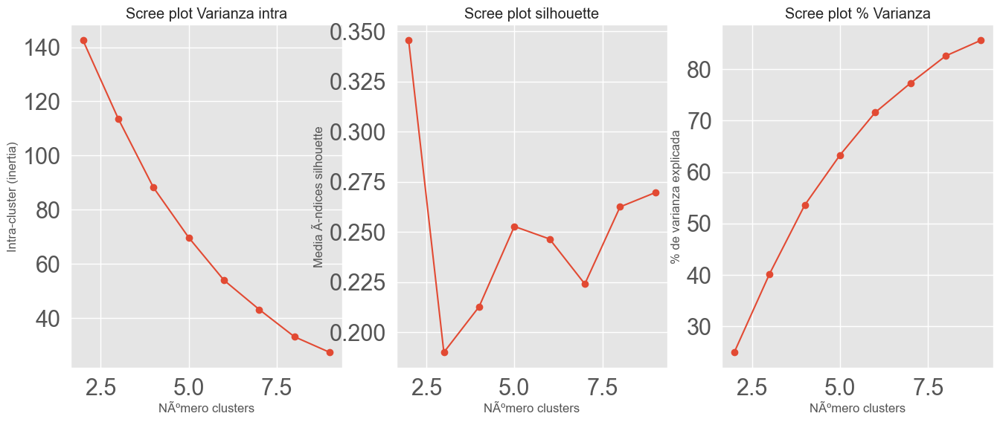

In [189]:
scree_plot_kmeans(para_CCAA,10)
plt.show()

En el antiguo grafico veíamos que nos pedía clasificación de cluster en 4 grupos, con esta cantidad de grupos explicamos más del 80% de varianza intra-cluster, tenemos el valor máximo para la silueta por lo tanto otro punto a favor con esta cantidad de clusters, en la variabilidad explicada no tenemos un valor muy alto ya que no llegamos ni al 60% de variabilidad explicada, pero decidimos ajustar el clustering Kmeans con 4 grupos ya que es lo más optimo.

In [190]:
modelo_kmeans = KMeans(n_clusters=4, 
                       n_init=25, 
                       random_state=42)
modelo_kmeans.fit(X=X_scaled)

print('Varianza intra: ' + str(modelo_kmeans.inertia_))

print('Centroides')
print(modelo_kmeans.cluster_centers_)


print('Etiquetas')
modelo_kmeans.labels_[:10]

Varianza intra: 85.5341801371321
Centroides
[[-0.27555148 -0.29172967 -0.43551351 -0.30660686 -0.50974762  0.14897072
   0.57864447  0.52464983 -0.29175631 -0.74375161]
 [-0.99882604 -1.01752271  0.7926604   2.14684261  1.47879106 -2.30774849
  -1.38420902 -1.50044094 -1.108432    1.02096125]
 [ 2.01820644  2.02279466  0.2735349   0.09001546  0.03826253  0.34372173
   0.57692189  0.4148247   0.08839083 -0.0649148 ]
 [-0.31540078 -0.28155431  0.30273923 -0.36085398  0.30307178  0.44871906
  -0.83402957 -0.59308814  0.91549967  0.96931728]]
Etiquetas


array([2, 0, 3, 3, 3, 3, 0, 0, 2, 1])

* **Varianza interna (varianza global):** la varianza intra es de 85% que es la varianza general, lo que nos dice que teniendo un número de cluster de 4 nuestro modelo_k_means va a ser optimo.
* **Centroides:** Nos da 4 centroides con diversas distribución en la cual nos da un indicio de cómo se van a comportar las variables con respecto a cada cluster. (se explica al final de una forma más específica)
* **Etiquetas:** nos da los cluster labels.


### Métricas de evaluación

In [191]:
cluster_labels = modelo_kmeans.labels_
silhouette_score(X_scaled, cluster_labels)

0.23596274599154649

Tenemos un valor muy bajo de silueta muy bajo por lo tanto nuestro modelo tendrá problemas para clasificar nuestros grupos.

#### indice de Calinski-Harabasz

In [192]:
from sklearn import metrics
metrics.calinski_harabasz_score(X_scaled, cluster_labels)

6.106671022939822

En el índice de Calinski-Harabasz que nos determina la medida de la separación del clúster, vemos que no hay una separabilidad muy buena como se espera ya que nuestro valor de silueta no es muy alto.

## 6- Muestra el biplot (puede ser proyección sobre dos de las variables que resulten relevantes o proyección sobre las dos primeras componentes principales de la matriz de entrada) y comenta los grupos formados. Interpreta los centroides.

### Visualización de resultados

#### Proyección sobre dos variables

In [193]:
para_CCAA.columns

Index(['Population', 'totalEmpresas', 'ForeignersPtge', 'UnemployLess25_Ptge',
       'Unemploy25_40_Ptge', 'UnemployMore40_Ptge',
       'AgricultureUnemploymentPtge', 'IndustryUnemploymentPtge',
       'ConstructionUnemploymentPtge', 'ServicesUnemploymentPtge'],
      dtype='object')

In [194]:
para_CCAA['cluster_kmeans'] = cluster_labels
fig = px.scatter(para_CCAA,  x='totalEmpresas', y='ServicesUnemploymentPtge', color='cluster_kmeans', text=para_CCAA.index)
fig.show()


Se observan 4 grupos de cluster:
* **Cluster 0:** comunidades en las que hay una cantidad mediana de empresas y hay una cantidad de desempleo para el servicio media-baja.
* **Cluster 3:** comunidades en las que no hay muchas empresa y hay un índice de desempleo alto en el sector de servicios.
* **Cluster 1:** Comunidades en las que hay un índice muy bajo de empresas y un índice de desempleo en el sector de servicios muy alto.
* **Cluster 2:** Comunidades en las que hay un promedio de empresas alto y un incide de desempleo en el sector de servicios medio.

Se observa que los grupos podrían estar separados un poco mejor pero como observamos en el análisis del k-mean el número de 4 clusters es el óptimo.

Se puede decir que **Rioja** fue asociada a el grupo 0 en base a las métricas pero en cuanto a porcentaje de desempleados en servicio no comparte esa caracteristica. 


### Cálculo de centroides para la interpretación

Es importante en clustering caracterizar los grupos formados en base a sus centroides. Así, se definen características centrales de los grupos sobre las variables originales pudiendo determinar las diferencias y similitudes entre ellos.

La idea final es obtener una interpretación de los grupos en base a valores medios en las variables del estudio.

In [195]:
from sklearn.neighbors import NearestCentroid
clf = NearestCentroid()
clf.fit(para_CCAA, cluster_labels)

NearestCentroid()

In [196]:
print(clf.centroids_)

[[1.22218844e+06 7.89044444e+04 5.74348840e+00 6.92626181e+00
  3.80800548e+01 4.91815225e+01 9.33111874e+00 1.17955627e+01
  9.66156007e+00 5.63404887e+01 0.00000000e+00]
 [6.65980000e+04 4.05550000e+03 1.06150000e+01 1.56455000e+01
  4.79990000e+01 3.63555000e+01 7.24500000e-01 2.89050000e+00
  7.12650000e+00 7.03035000e+01 1.00000000e+00]
 [4.88697200e+06 3.17594667e+05 8.55590570e+00 8.33580559e+00
  4.08135609e+01 5.01982772e+01 9.32356567e+00 1.13126215e+01
  1.08415828e+01 6.17116775e+01 2.00000000e+00]
 [1.15852040e+06 7.99538000e+04 8.67174374e+00 6.73347464e+00
  4.21344447e+01 5.07464465e+01 3.13689848e+00 6.88046116e+00
  1.34090286e+01 6.98948752e+01 3.00000000e+00]]


Vemos que con los centroides se puede establecer la correlación entre variable y tipo de cluster o categoría. como por ejemplo nuestra tasa de desempleo en la cual se asignó el cluster 0 para los valores en los que es baja-media, para nuestro centroide tuvimos el valor más bajo que fue 5.63404887e+01, pero si observamos el cluster 1 vemos que esto cambia ya que nos estima un valor alto con respecto al porcentaje de desempleo en los servicios y coincide con nuestro centroide ya que tiene el valor más alto 7.03035000e+01.